In [1]:
import torch 
from transformers import AutoTokenizer, AutoModelForCausalLM, LogitsProcessor

import pandas as pd
from typing import List, Tuple, Dict
import numpy as np
from transformer_lens import HookedTransformer
from transformer_lens.utils import get_act_name
import plotly.io as pio
pio.renderers.default = "notebook_connected"  # or "inline" / "notebook" / "colab"
    # problematic_decimals = [
    #     ("9.8", "9.11", True),   # 9.8 > 9.11 is True
    #     ("9.9", "9.89", True),   # 9.9 > 9.89 is True
    #     ("10.5", "10.49", True), # 10.5 > 10.49 is True
    #     ("3.14", "3.141", False), # 3.14 > 3.141 is False (actually very close)
    #     ("2.5", "2.499", True),  # 2.5 > 2.499 is True
    #     ("7.0", "7.00", False),  # 7.0 = 7.00 (neither > nor <)
    #     ("-2.1", "-2.09", False),
    #     ("-0.8", "-0.11", False),
    # ]

    # obvious_cases = [
    #     ("10.5", "2.3", True),   # Obviously true
    #     ("3.2", "8.7", False),   # Obviously false
    #     ("100.1", "99.9", True), # Crossing integer boundary
    #     ("0.5", "0.49", True),   # Sub-1 comparison
    #     ("1.5", "15.0", False),  # Different magnitude
    #     ("25.7", "3.8", True),   # Clear difference
    # ]

    
    # # Integer comparisons (baseline)
    # integer_cases = [
    #     ("9", "11", False),      # 9 < 11
    #     ("15", "8", True),       # 15 > 8
    #     ("100", "99", True),     # 100 > 99
    #     ("7", "7", False),       # 7 = 7
    # ]
    
    # # Edge cases
    # edge_cases = [
    #     ("0.1", "0.09", True),   # Leading zero cases
    #     ("1.0", "0.9999", True), # Very close to boundary
    #     ("-1.5", "-1.6", True),  # Negative numbers
    #     ("10", "9.99", True),    # Integer vs decimal
    #     ("7.5", "7.499", True),  # Very close values
    #     ("6.1", "6.099", True),  # .1 vs .099
    #     ("11.2", "11.19", True), # Two digits before decimal
    #     ("99.9", "99.89", True), # High numbers
    #     ("1.01", "1.009", True), # Multiple zeros
    # ]

In [2]:
from transformer_lens import HookedTransformer
# Check if model already loaded
if 'model' not in globals():
    print("Loading Gemma-2 model...")
    # MODEL_NAME = "google/gemma-2-2b-it"  # Change to 9b if you have memory
    MODEL_NAME = "google/gemma-2-2b-it"  # Change to 9b if you have memory
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = HookedTransformer.from_pretrained(
        "google/gemma-2-2b-it",
        torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
        device=device).eval()
    tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
    tlmodel = AutoModelForCausalLM.from_pretrained(
        MODEL_NAME,
        torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
        device_map="auto"
    ).eval()


    
    
    
    print(f"✅ Model loaded: {MODEL_NAME}")
    print(f"✅ Device: {device}")
else:
    print("✅ Model already loaded, skipping...")
    

Loading Gemma-2 model...


`torch_dtype` is deprecated! Use `dtype` instead!


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loaded pretrained model google/gemma-2-2b-it into HookedTransformer
✅ Model loaded: google/gemma-2-2b-it
✅ Device: cuda


In [3]:
# # ---------- Setup TransformerLens Model ----------
# def setup_transformerlens_model(hf_model, hf_tokenizer):
#     """Convert HuggingFace model to TransformerLens format"""
    
#     # Option 1: Load directly if supported
#     try:
#         tl_model = HookedTransformer.from_pretrained("google/gemma-2-2b-it", device=hf_model.device)
#         return tl_model
#     except:
#         # Option 2: Convert from HuggingFace (more complex)
#         print("Direct loading failed, using HuggingFace model with manual hooks")
#         return None


In [4]:
tok = tokenizer

In [5]:
class AllowOnlyTokens(LogitsProcessor):
    """Mask vocabulary so only given token IDs can be generated."""
    def __init__(self, allowed_ids): self.allowed_ids = allowed_ids
    def __call__(self, input_ids, scores):
        mask = torch.full_like(scores, float("-inf"))
        mask[:, self.allowed_ids] = 0.0
        return scores + mask

def one_token_id(s: str):
    """Return a single-token ID for s, preferring space-prefixed form, else None."""
    ids = tok.encode(" "+s, add_special_tokens=False)
    if len(ids)==1: return ids[0]
    ids = tok.encode(s, add_special_tokens=False)
    return ids[0] if len(ids)==1 else None

@torch.no_grad()
def next_token_probs(prompt: str, candidates=("A","B")):
    inputs = tok(prompt, return_tensors="pt").to(model.device)
    logits = model(**inputs).logits[0, -1]
    ids = []
    for c in candidates:
        cid = one_token_id(c)
        if cid is None: return {c: float("nan") for c in candidates}
        ids.append(cid)
    sel = logits[ids] - logits[ids].max()
    probs = torch.softmax(sel, dim=-1).detach().cpu().tolist()
    return {c: round(p, 3) for c, p in zip(candidates, probs)}

@torch.no_grad()
def forced_choice(prompt: str, candidates=("A","B")):
    """Force the model to emit 1 of the candidate single tokens and return its label string."""
    inputs = tok(prompt, return_tensors="pt").to(model.device)
    ids = []
    for c in candidates:
        cid = one_token_id(c)
        if cid is None:
            raise ValueError(f"Candidate {c!r} is not a single token for this tokenizer.")
        ids.append(cid)
    out = model.generate(
        **inputs, max_new_tokens=1, do_sample=False,
        logits_processor=[AllowOnlyTokens(ids)],
        pad_token_id=tok.eos_token_id
    )
    gen_id = out[0, inputs["input_ids"].shape[1]:][0].item()
    return candidates[ids.index(gen_id)]


In [6]:
def prompt_mcq(a: str, b: str):
    return f"Which is larger?\nA: {a}\nB: {b}\nAnswer with A or B only."

def prompt_simple(a: str, b: str):
    return f"Question: Is {a} > {b}? Answer:"

In [7]:
# pairs = [
#     (".8", ".11"),
#     ("1.9", "1.11"),
#     ("2.8", "2.11"),
#     ("3.8", "3.11"),
#     ("9.8", "9.11"),
#     # a few integers for contrast
#     ("98", "91"),
#     ("1234", "129"),
# ]

def numeric_truth(a: str, b: str):
    return "A" if float(a) > float(b) else "B"

def numeric_truth_yn(a: str, b: str):
    return "Yes" if float(a) > float(b) else "No"

def numeric_truth_tf(a: str, b: str):
    return "True" if float(a) > float(b) else "False"

    

In [8]:
# df.to_pickle('dataset_predictions_by_gemma_2n_it')

In [9]:
# Generate stats on the dataset
fdf = pd.read_pickle('data/fdf.pkl')
df = fdf.copy()

In [9]:
import json 
dataset_path = "gemma_numeric_ab_dataset.jsonl"  # update path if needed


results = []
i = 0
with open(dataset_path, "r") as f:
    for line in f:
        i += 1
        print(i)
        # if i > 100:
        #     break
        ex = json.loads(line)
        truth = ex["numeric_truth"]
        truth_yn = ex["numeric_truth_yn"]
        truth_tf = ex["numeric_truth_tf"]
        pm = ex["prompt_mcq"]
        mcq_probs = next_token_probs(pm, ("A","B"))
        mcq_forced = forced_choice(pm, ("A","B"))
        ps = ex["prompt_simple"]
        yn_probs = next_token_probs(ps, ("Yes","No"))
        yn_forced = forced_choice(ps, ("Yes","No"))
        tf_probs = next_token_probs(ps, ("True","False"))
        tf_forced = forced_choice(ps, ("True","False"))
        # "pair_type": ex["pair_type"], 
        results.append({
            "truth": truth, "truth_yn" : truth_yn,
            "mcq_forced": mcq_forced, "mcq_probs": mcq_probs,
            "yn_forced": yn_forced, "yn_probs": yn_probs,
            "tf_probs" : tf_probs, "tf_forced": tf_forced,
            **ex
        })


df = pd.DataFrame(results)

acc_mcq = (df["mcq_forced"] == df["truth"]).mean()
acc_yn = (df["yn_forced"] == df["truth_yn"]).mean()

acc_by_type_mcq = df.groupby("pair_type").apply(lambda g: (g["mcq_forced"]==g["truth"]).mean())
acc_by_type_yn = df.groupby("pair_type").apply(lambda g: (g["yn_forced"]==g["truth_yn"]).mean())

print("Overall MCQ acc:", round(acc_mcq,3))
print("Overall Yes/No acc:", round(acc_yn,3))
print("By type MCQ:", acc_by_type_mcq.to_dict())
print("By type Yes/No:", acc_by_type_yn.to_dict())

1


NameError: name 'model' is not defined

In [10]:
# string_dataset_path = "gemma_string_ab_dataset.jsonl"  # update path if needed
# dataset_path = "gemma_numeric_ab_dataset.jsonl"  # update path if needed


In [187]:
import json 
string_dataset_path = "gemma_string_ab_dataset.jsonl"  # update path if needed


results = []
i = 0
with open(string_dataset_path, "r") as f:
    for line in f:
        i += 1
        print(i)
        # if i > 100:
        #     break
        ex = json.loads(line)
        truth = ex["lex_truth"]
        truth_yn = ex["lex_truth_yn"]
        truth_tf = ex["lex_truth_tf"]
        pm = ex["prompt_mcq"]
        mcq_probs = next_token_probs(pm, ("A","B"))
        mcq_forced = forced_choice(pm, ("A","B"))
        ps = ex["prompt_simple"]
        yn_probs = next_token_probs(ps, ("Yes","No"))
        yn_forced = forced_choice(ps, ("Yes","No"))
        tf_probs = next_token_probs(ps, ("True","False"))
        tf_forced = forced_choice(ps, ("True","False"))
        
        results.append({
            "truth": truth, "truth_yn" : truth_yn,
            "mcq_forced": mcq_forced, "mcq_probs": mcq_probs,
            "yn_forced": yn_forced, "yn_probs": yn_probs,
            "tf_probs" : tf_probs, "tf_forced": tf_forced,
            **ex
        })

    


string_df = pd.DataFrame(results)

acc_mcq = (string_df["mcq_forced"] == string_df["truth"]).mean()
acc_yn = (string_df["yn_forced"] == string_df["truth_yn"]).mean()

acc_by_type_mcq = string_df.groupby("pair_type").apply(lambda g: (g["mcq_forced"]==g["truth"]).mean())
acc_by_type_yn = string_df.groupby("pair_type").apply(lambda g: (g["yn_forced"]==g["truth_yn"]).mean())

print("Overall MCQ acc:", round(acc_mcq,3))
print("Overall Yes/No acc:", round(acc_yn,3))
print("By type MCQ:", acc_by_type_mcq.to_dict())
print("By type Yes/No:", acc_by_type_yn.to_dict())

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21



KeyboardInterrupt



In [9]:
df.loc[df['truth_yn'] == "Yes",'truth_tf'] = True
df.loc[df['truth_yn'] == "No",'truth_tf'] = False
df.head(2)

,truth,truth_yn,mcq_forced,mcq_probs,yn_forced,yn_probs,tf_probs,tf_forced,id,pair_type,...,b,numeric_truth,numeric_truth_yn,numeric_truth_tf,lex_truth,lex_truth_yn,lex_truth_tf,prompt_mcq,prompt_simple,truth_tf
0,A,Yes,A,"{'A': 0.926, 'B': 0.074}",Yes,"{'Yes': 0.927, 'No': 0.073}","{'True': 0.981, 'False': 0.019}",True,decimals_diff_len-268,decimals_diff_len,...,37.4,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 37.69\nB: 37.4\nAnswer wi...,Question: Is 37.69 > 37.4? Answer:,True
1,A,Yes,A,"{'A': 0.955, 'B': 0.045}",Yes,"{'Yes': 0.948, 'No': 0.052}","{'True': 0.984, 'False': 0.016}",True,integers_equal_len-44,integers_equal_len,...,3519,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 9078\nB: 3519\nAnswer wit...,Question: Is 9078 > 3519? Answer:,True


In [ ]:
string_df.loc[string_df['truth_yn'] == "Yes",'truth_tf'] = True
string_df.loc[string_df['truth_yn'] == "No",'truth_tf'] = False
string_df.head(2)

## Numeric data correct vs incorrect predictions

In [10]:
display(df.groupby(['pair_type'])['truth_yn'].value_counts())
display(df.groupby(['pair_type', 'truth_yn']).apply(lambda x : (x['truth_yn'] == x['yn_forced']).mean()))

display(df.groupby(['pair_type','truth_tf']).apply(lambda x : (x['truth_tf'].astype(str) == x['tf_forced'].astype(str)).mean()))

pair_type           truth_yn
decimals_diff_len   Yes         254
                    No          246
decimals_equal_len  No          264
                    Yes         236
integers_diff_len   No          255
                    Yes         245
integers_equal_len  No          267
                    Yes         233
Name: count, dtype: int64

/tmp/ipykernel_7471/4171740853.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  display(df.groupby(['pair_type', 'truth_yn']).apply(lambda x : (x['truth_yn'] == x['yn_forced']).mean()))


pair_type           truth_yn
decimals_diff_len   No          0.150407
                    Yes         1.000000
decimals_equal_len  No          0.045455
                    Yes         1.000000
integers_diff_len   No          0.713725
                    Yes         0.995918
integers_equal_len  No          0.741573
                    Yes         0.995708
dtype: float64

/tmp/ipykernel_7471/4171740853.py:4: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  display(df.groupby(['pair_type','truth_tf']).apply(lambda x : (x['truth_tf'].astype(str) == x['tf_forced'].astype(str)).mean()))


pair_type           truth_tf
decimals_diff_len   False       0.008130
                    True        1.000000
decimals_equal_len  False       0.000000
                    True        1.000000
integers_diff_len   False       0.223529
                    True        1.000000
integers_equal_len  False       0.082397
                    True        1.000000
dtype: float64

## String data correct vs incorrect predictions

In [ ]:
display(string_df.groupby(['pair_type'])['truth_yn'].value_counts())

display(string_df.groupby(['pair_type', 'truth_yn']).apply(lambda x : (x['truth_yn'] == x['yn_forced']).mean()))

display(string_df.groupby(['pair_type','truth_tf']).apply(lambda x : (x['truth_tf'].astype(str) == x['tf_forced'].astype(str)).mean()))

In [ ]:
# df.groupby(['pair_type','truth']).apply(lambda x : (x['truth'].astype(str) == x['mcq_forced'].astype(str)).mean())


In [ ]:
# df[df['pair_type'] == 'integers']

In [11]:
@torch.no_grad()
def get_decision_all_layers(prompt: str):
    inputs = tok(prompt, return_tensors="pt").to(tlmodel.device)
    out = tlmodel(**inputs, output_hidden_states=True, return_dict=True)
    hs = out.hidden_states
    # print(len(hs))
    if hs is None:
        raise RuntimeError("hidden_states is None; ensure output_hidden_states=True.")
    # stack (num_layers+1, D) for last token
    del inputs, out
    
    return np.stack([h[0, -1].detach().float().cpu().numpy() for h in hs], axis=0)

@torch.no_grad()
def get_decision_hidden(prompt: str, layer: int = -1):
    """
    Returns the hidden state of the last prompt token at the specified layer.
    layer indexing: 0 = embeddings, 1..L = transformer layers, -1 = final layer.
    """
    inputs = tok(prompt, return_tensors="pt").to(tlmodel.device)
    out = model(**inputs, output_hidden_states=True, return_dict=True)
    hs = out.hidden_states  # tuple length = num_layers + 1
    if hs is None:
        raise RuntimeError("hidden_states is None; ensure output_hidden_states=True.")

    # handle negative index robustly
    L = len(hs)  # embeddings + layers
    li = layer if layer >= 0 else L + layer
    if li < 0 or li >= L:
        raise IndexError(f"layer index {layer} out of range (have {L} hidden_states).")
    # print(len(hs))
    del inputs, out

    vec = hs[li][0, -1].detach().float().cpu().numpy()  # (D,)
    return vec  # numpy vector

    

In [12]:
test_prompt = "Question: Is 9.8 > 9.11? Answer:"
v = get_decision_hidden(test_prompt, layer=-1)
print("final layer vec shape:", v.shape)

allv = get_decision_all_layers(test_prompt)
print("all layers:", allv.shape)  # (num_layers+1, hidden_size)

final layer vec shape: (2304,)
all layers: (27, 2304)


In [12]:
# Load your model back and check memory
print(f"Before loading model: {torch.cuda.memory_allocated() / 1e9:.2f} GB")

# If you deleted the model, reload it:
# model = AutoModelForCausalLM.from_pretrained(MODEL_NAME, device_map="auto")

print(f"After loading model: {torch.cuda.memory_allocated() / 1e9:.2f} GB")

Before loading model: 8.37 GB
After loading model: 8.37 GB


In [13]:
# Clear PyTorch's internal caches
torch.cuda.ipc_collect()
torch.cuda.empty_cache()

In [ ]:
# v = get_decision_hidden(r["prompt_simple"], layer=LAYER_TO_USE)
# v

In [15]:
# fdf = []
# with open(dataset_path, "r") as f:
#     for line in f:
#         # print(line)
#         ex = json.loads(line)
#         fdf.append(ex)
# fdf= pd.concat([pd.DataFrame(fdf), df.drop(columns = ['pair_type'])],axis=1)
fdf = df.copy()
string_fdf = string_df.copy()
# with open(string_dataset_path, "r") as f:
#     for line in f:
#         # print(line)
#         ex = json.loads(line)
#         string_fdf.append(ex)
# string_fdf= pd.concat([pd.DataFrame(string_fdf), df.drop(columns = ['pair_type'])],axis=1)

NameError: name 'string_df' is not defined

In [ ]:
fdf['pair_type'].value_counts()

In [ ]:
# fdf[fdf['pair_type'] == 'integers_diff_len']['a']


In [ ]:
# (fdf[fdf['pair_type'] == 'integers_diff_len']['a'].transform(lambda x: len(x)) == fdf[fdf['pair_type'] == 'integers_diff_len']['b'].transform(lambda x: len(x))).value_counts()

In [ ]:
# fdf[fdf['pair_type'] == 'integers_diff_len']

In [ ]:
# fdf[fdf['pair_type'] == 'integers'].apply(lambda x : len(x['a']) == len(y['b']))

In [16]:
LAYER_TO_USE = -1
pair_types = ["integers_diff_len","integers_equal_len", "decimals_equal_len", "decimals_diff_len"]

# Collect activations and labels
acts_by_set = {}   # name -> (N, D)
labels_by_set = {} # name -> array of 'True'/'False' (numeric correctness)
labels_predict_by_set = {} # name -> array of 'True'/'False' (numeric correctness)
labels_tf_by_set = {} # name -> array of 'True'/'False' (numeric correctness)
labels_predict_tf_by_set = {} # name -> array of 'True'/'False' (numeric correctness)
xs = model.config.hidden_size
print("Hidden size:", xs)

for i, ptype in enumerate(pair_types):
    print(i)
    sub = fdf[fdf["pair_type"] == ptype].copy()
    vecs = []
    labs = []
    labs_tf = []
    labels_predict = []
    labels_predict_tf = []
    for _, r in sub.iterrows():
        v = get_decision_hidden(r["prompt_simple"], layer=LAYER_TO_USE)  # (D,)
        vecs.append(v)
        # label True if the correct answer (numeric) is the "positive" class: we’ll set True for first option in this style
        # For visualization, True/False refers to NUMERIC truth of the statement or which option is larger.
        labs.append(r["truth_yn"])
        labels_predict.append(r["yn_forced"])
        labs_tf.append(r["truth_tf"])
        labels_predict_tf.append(r["tf_forced"])
    acts_by_set[ptype] = np.stack(vecs, axis=0)
    labels_by_set[ptype] = np.array(labs)
    labels_tf_by_set[ptype] = np.array(labs_tf)
    labels_predict_by_set[ptype] = np.array(labels_predict)
    labels_predict_tf_by_set[ptype] = np.array(labels_predict_tf)

{k: v.shape for k,v in acts_by_set.items()}

Hidden size: 2304
0


NameError: name 'get_decision_hidden' is not defined

In [ ]:
string_fdf

In [124]:
LAYER_TO_USE = -1
pair_types = ["string_diff_len","string_equal_len"]

# Collect activations and labels
string_acts_by_set = {}   # name -> (N, D)
string_labels_by_set = {} # name -> array of 'True'/'False' (numeric correctness)
string_labels_predict_by_set = {} # name -> array of 'True'/'False' (numeric correctness)
string_labels_tf_by_set = {} # name -> array of 'True'/'False' (numeric correctness)
string_labels_predict_tf_by_set = {} # name -> array of 'True'/'False' (numeric correctness)
xs = model.config.hidden_size
print("Hidden size:", xs)

for i, ptype in enumerate(pair_types):
    print(i)
    sub = string_fdf[string_fdf["pair_type"] == ptype].copy()
    vecs = []
    labs = []
    labs_tf = []
    labels_predict = []
    labels_predict_tf = []
    for _, r in sub.iterrows():
        v = get_decision_hidden(r["prompt_simple"], layer=LAYER_TO_USE)  # (D,)
        vecs.append(v)
        # label True if the correct answer (numeric) is the "positive" class: we’ll set True for first option in this style
        # For visualization, True/False refers to NUMERIC truth of the statement or which option is larger.
        labs.append(r["truth_yn"])
        labels_predict.append(r["yn_forced"])
        labs_tf.append(r["truth_tf"])
        labels_predict_tf.append(r["tf_forced"])
    string_acts_by_set[ptype] = np.stack(vecs, axis=0)
    string_labels_by_set[ptype] = np.array(labs)
    string_labels_tf_by_set[ptype] = np.array(labs_tf)
    string_labels_predict_by_set[ptype] = np.array(labels_predict)
    string_labels_predict_tf_by_set[ptype] = np.array(labels_predict_tf)

{k: v.shape for k,v in string_acts_by_set.items()}

Hidden size: 2304
0
1


{'string_diff_len': (500, 2304), 'string_equal_len': (500, 2304)}

In [34]:
g = fdf[fdf['pair_type'] == 'decimals_diff_len'].copy()
fdf

,truth,truth_yn,mcq_forced,mcq_probs,yn_forced,yn_probs,tf_probs,tf_forced,id,pair_type,...,b,numeric_truth,numeric_truth_yn,numeric_truth_tf,lex_truth,lex_truth_yn,lex_truth_tf,prompt_mcq,prompt_simple,truth_tf
0,A,Yes,A,"{'A': 0.926, 'B': 0.074}",Yes,"{'Yes': 0.927, 'No': 0.073}","{'True': 0.981, 'False': 0.019}",True,decimals_diff_len-268,decimals_diff_len,...,37.4,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 37.69\nB: 37.4\nAnswer wi...,Question: Is 37.69 > 37.4? Answer:,True
1,A,Yes,A,"{'A': 0.955, 'B': 0.045}",Yes,"{'Yes': 0.948, 'No': 0.052}","{'True': 0.984, 'False': 0.016}",True,integers_equal_len-44,integers_equal_len,...,3519,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 9078\nB: 3519\nAnswer wit...,Question: Is 9078 > 3519? Answer:,True
2,B,No,A,"{'A': 0.95, 'B': 0.05}",Yes,"{'Yes': 0.766, 'No': 0.234}","{'True': 0.891, 'False': 0.109}",True,decimals_equal_len-147,decimals_equal_len,...,42.34,B,No,False,B,No,False,Which is larger?\nA: 42.31\nB: 42.34\nAnswer w...,Question: Is 42.31 > 42.34? Answer:,False
3,A,Yes,A,"{'A': 0.95, 'B': 0.05}",Yes,"{'Yes': 0.938, 'No': 0.062}","{'True': 0.974, 'False': 0.026}",True,decimals_equal_len-315,decimals_equal_len,...,56.656,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 56.680\nB: 56.656\nAnswer...,Question: Is 56.680 > 56.656? Answer:,True
4,A,Yes,A,"{'A': 0.945, 'B': 0.055}",Yes,"{'Yes': 0.89, 'No': 0.11}","{'True': 0.977, 'False': 0.024}",True,integers_diff_len-489,integers_diff_len,...,338,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 5573\nB: 338\nAnswer with...,Question: Is 5573 > 338? Answer:,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,B,No,A,"{'A': 0.947, 'B': 0.053}",Yes,"{'Yes': 0.863, 'No': 0.137}","{'True': 0.955, 'False': 0.045}",True,decimals_diff_len-48,decimals_diff_len,...,55.187,B,No,False,B,No,False,Which is larger?\nA: 55.08\nB: 55.187\nAnswer ...,Question: Is 55.08 > 55.187? Answer:,False
1996,B,No,A,"{'A': 0.952, 'B': 0.048}",Yes,"{'Yes': 0.791, 'No': 0.209}","{'True': 0.917, 'False': 0.083}",True,decimals_equal_len-287,decimals_equal_len,...,70.34,B,No,False,B,No,False,Which is larger?\nA: 70.06\nB: 70.34\nAnswer w...,Question: Is 70.06 > 70.34? Answer:,False
1997,A,Yes,A,"{'A': 0.931, 'B': 0.069}",Yes,"{'Yes': 0.925, 'No': 0.075}","{'True': 0.979, 'False': 0.022}",True,decimals_diff_len-438,decimals_diff_len,...,52.0,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 52.97\nB: 52.0\nAnswer wi...,Question: Is 52.97 > 52.0? Answer:,True
1998,B,No,A,"{'A': 0.959, 'B': 0.041}",No,"{'Yes': 0.244, 'No': 0.756}","{'True': 0.576, 'False': 0.424}",True,integers_equal_len-313,integers_equal_len,...,2776,B,No,False,B,No,False,Which is larger?\nA: 2761\nB: 2776\nAnswer wit...,Question: Is 2761 > 2776? Answer:,False


,truth,truth_yn,mcq_forced,mcq_probs,yn_forced,yn_probs,tf_probs,tf_forced,id,pair_type,...,b,numeric_truth,numeric_truth_yn,numeric_truth_tf,lex_truth,lex_truth_yn,lex_truth_tf,prompt_mcq,prompt_simple,truth_tf
0,A,Yes,A,"{'A': 0.926, 'B': 0.074}",Yes,"{'Yes': 0.927, 'No': 0.073}","{'True': 0.981, 'False': 0.019}",True,decimals_diff_len-268,decimals_diff_len,...,37.4,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 37.69\nB: 37.4\nAnswer wi...,Question: Is 37.69 > 37.4? Answer:,True
1,A,Yes,A,"{'A': 0.955, 'B': 0.045}",Yes,"{'Yes': 0.948, 'No': 0.052}","{'True': 0.984, 'False': 0.016}",True,integers_equal_len-44,integers_equal_len,...,3519,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 9078\nB: 3519\nAnswer wit...,Question: Is 9078 > 3519? Answer:,True
2,B,No,A,"{'A': 0.95, 'B': 0.05}",Yes,"{'Yes': 0.766, 'No': 0.234}","{'True': 0.891, 'False': 0.109}",True,decimals_equal_len-147,decimals_equal_len,...,42.34,B,No,False,B,No,False,Which is larger?\nA: 42.31\nB: 42.34\nAnswer w...,Question: Is 42.31 > 42.34? Answer:,False
3,A,Yes,A,"{'A': 0.95, 'B': 0.05}",Yes,"{'Yes': 0.938, 'No': 0.062}","{'True': 0.974, 'False': 0.026}",True,decimals_equal_len-315,decimals_equal_len,...,56.656,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 56.680\nB: 56.656\nAnswer...,Question: Is 56.680 > 56.656? Answer:,True
4,A,Yes,A,"{'A': 0.945, 'B': 0.055}",Yes,"{'Yes': 0.89, 'No': 0.11}","{'True': 0.977, 'False': 0.024}",True,integers_diff_len-489,integers_diff_len,...,338,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 5573\nB: 338\nAnswer with...,Question: Is 5573 > 338? Answer:,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,B,No,A,"{'A': 0.947, 'B': 0.053}",Yes,"{'Yes': 0.863, 'No': 0.137}","{'True': 0.955, 'False': 0.045}",True,decimals_diff_len-48,decimals_diff_len,...,55.187,B,No,False,B,No,False,Which is larger?\nA: 55.08\nB: 55.187\nAnswer ...,Question: Is 55.08 > 55.187? Answer:,False
1996,B,No,A,"{'A': 0.952, 'B': 0.048}",Yes,"{'Yes': 0.791, 'No': 0.209}","{'True': 0.917, 'False': 0.083}",True,decimals_equal_len-287,decimals_equal_len,...,70.34,B,No,False,B,No,False,Which is larger?\nA: 70.06\nB: 70.34\nAnswer w...,Question: Is 70.06 > 70.34? Answer:,False
1997,A,Yes,A,"{'A': 0.931, 'B': 0.069}",Yes,"{'Yes': 0.925, 'No': 0.075}","{'True': 0.979, 'False': 0.022}",True,decimals_diff_len-438,decimals_diff_len,...,52.0,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 52.97\nB: 52.0\nAnswer wi...,Question: Is 52.97 > 52.0? Answer:,True
1998,B,No,A,"{'A': 0.959, 'B': 0.041}",No,"{'Yes': 0.244, 'No': 0.756}","{'True': 0.576, 'False': 0.424}",True,integers_equal_len-313,integers_equal_len,...,2776,B,No,False,B,No,False,Which is larger?\nA: 2761\nB: 2776\nAnswer wit...,Question: Is 2761 > 2776? Answer:,False


In [38]:
g['a_len'] = g['a'].apply(lambda x : len(x))
g['b_len'] = g['b'].apply(lambda x : len(x))
g['adec_len'] = g['a'].apply(lambda x : len(x.split('.')[1]))
g['bdec_len'] = g['b'].apply(lambda x : len(x.split('.')[1]))
g['aint_len'] = g['a'].apply(lambda x : len(x.split('.')[0]))
g['bint_len'] = g['b'].apply(lambda x : len(x.split('.')[0]))
g['int_comp'] = g['aint_len'] == g['bint_len']
g['dec_comp'] = g['adec_len'] > g['bdec_len']
g['dec_dec_comp'] = g['a'].apply(lambda x : x.split('.')[1]) > g['b'].apply(lambda x : x.split('.')[1])
g.groupby([ 'dec_dec_comp','int_comp', 'dec_comp']).apply(lambda x : (x['numeric_truth_yn'] == x['lex_truth_yn']).value_counts())

/tmp/ipykernel_18941/3440477744.py:10: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



count                           True
dec_dec_comp int_comp dec_comp      
False        True     False      140
                      True       106
True         True     False      121
                      True       133

In [80]:
g

,truth,truth_yn,mcq_forced,mcq_probs,yn_forced,yn_probs,tf_probs,tf_forced,id,pair_type,...,lex_truth_tf,prompt_mcq,prompt_simple,truth_tf,a_len,b_len,adec_len,bdec_len,aint_len,bint_len
2,B,No,A,"{'A': 0.905, 'B': 0.095}",Yes,"{'Yes': 0.783, 'No': 0.217}","{'True': 0.942, 'False': 0.058}",True,decimals_diff_len-217,decimals_diff_len,...,False,Which is larger?\nA: 30.044\nB: 30.4\nAnswer w...,Question: Is 30.044 > 30.4? Answer:,False,6,4,3,1,2,2
3,B,No,A,"{'A': 0.938, 'B': 0.062}",Yes,"{'Yes': 0.779, 'No': 0.221}","{'True': 0.942, 'False': 0.058}",True,decimals_diff_len-406,decimals_diff_len,...,False,Which is larger?\nA: 56.29\nB: 56.3\nAnswer wi...,Question: Is 56.29 > 56.3? Answer:,False,5,4,2,1,2,2
4,B,No,A,"{'A': 0.947, 'B': 0.053}",Yes,"{'Yes': 0.863, 'No': 0.137}","{'True': 0.955, 'False': 0.045}",True,decimals_diff_len-143,decimals_diff_len,...,False,Which is larger?\nA: 55.08\nB: 55.187\nAnswer ...,Question: Is 55.08 > 55.187? Answer:,False,5,6,2,3,2,2
9,B,No,A,"{'A': 0.955, 'B': 0.045}",Yes,"{'Yes': 0.699, 'No': 0.301}","{'True': 0.873, 'False': 0.128}",True,decimals_diff_len-57,decimals_diff_len,...,False,Which is larger?\nA: 30.2\nB: 30.553\nAnswer w...,Question: Is 30.2 > 30.553? Answer:,False,4,6,1,3,2,2
12,A,Yes,A,"{'A': 0.929, 'B': 0.071}",Yes,"{'Yes': 0.921, 'No': 0.079}","{'True': 0.982, 'False': 0.018}",True,decimals_diff_len-5,decimals_diff_len,...,Truth,Which is larger?\nA: 12.47\nB: 12.0\nAnswer wi...,Question: Is 12.47 > 12.0? Answer:,True,5,4,2,1,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1981,B,No,A,"{'A': 0.907, 'B': 0.093}",Yes,"{'Yes': 0.649, 'No': 0.35}","{'True': 0.903, 'False': 0.097}",True,decimals_diff_len-343,decimals_diff_len,...,False,Which is larger?\nA: 21.071\nB: 21.6\nAnswer w...,Question: Is 21.071 > 21.6? Answer:,False,6,4,3,1,2,2
1987,A,Yes,A,"{'A': 0.929, 'B': 0.071}",Yes,"{'Yes': 0.944, 'No': 0.056}","{'True': 0.974, 'False': 0.026}",True,decimals_diff_len-357,decimals_diff_len,...,Truth,Which is larger?\nA: 2.9\nB: 2.845\nAnswer wit...,Question: Is 2.9 > 2.845? Answer:,True,3,5,1,3,1,1
1990,B,No,A,"{'A': 0.926, 'B': 0.074}",Yes,"{'Yes': 0.587, 'No': 0.413}","{'True': 0.827, 'False': 0.173}",True,decimals_diff_len-418,decimals_diff_len,...,False,Which is larger?\nA: 0.18\nB: 0.6\nAnswer with...,Question: Is 0.18 > 0.6? Answer:,False,4,3,2,1,1,1
1993,A,Yes,A,"{'A': 0.947, 'B': 0.053}",Yes,"{'Yes': 0.901, 'No': 0.099}","{'True': 0.948, 'False': 0.052}",True,decimals_diff_len-474,decimals_diff_len,...,Truth,Which is larger?\nA: 21.6\nB: 21.590\nAnswer w...,Question: Is 21.6 > 21.590? Answer:,True,4,6,1,3,2,2


In [14]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.default = "notebook"     # for Jupyter Notebook
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def labels_to01(y_labels):
    """Map labels to 0/1 for coloring (A/Yes -> 1; B/No -> 0)."""
    if set(y_labels) <= {"A","B"}:
        return np.array([1 if t=="A" else 0 for t in y_labels]), {1:"A/Yes", 0:"B/No"}
    if set(y_labels) <= {"Yes","No"}:
        return np.array([1 if t=="Yes" else 0 for t in y_labels]), {1:"Yes", 0:"No"}
    uniq = sorted(list(set(y_labels)))
    return np.array([1 if t==uniq[0] else 0 for t in y_labels]), {1:uniq[0], 0:uniq[1]}

def center_rows(X):
    mu = X.mean(axis=0, keepdims=True)
    return X - mu, mu

def pca_2d(X):
    Xc, _ = center_rows(X)
    p = PCA(n_components=2, random_state=0).fit(Xc)
    Z = p.transform(Xc)
    ev = p.explained_variance_ratio_
    return Z, ev

def tsne_2d(X, perplexity=30, n_iter=1000, random_state=0):
    Xc, _ = center_rows(X)
    tsne = TSNE(n_components=2, perplexity=perplexity,# n_iter=n_iter,
                random_state=random_state, init="pca")
    Z = tsne.fit_transform(Xc)
    return Z

def plot_grid(acts_by_set, labels_by_set, types, method="pca", n_cols=2, title="Grid"):
    # pick available types
    types = [t for t in types if t in acts_by_set]
    n = len(types)
    n_cols = min(n_cols, n) if n > 0 else 1
    n_rows = (n + n_cols - 1) // n_cols

    fig = make_subplots(
        rows=n_rows, cols=n_cols,
        subplot_titles=types,
        horizontal_spacing=0.18, vertical_spacing=0.24,
    )

    # consistent colors
    palette = {1:"red", 0:"blue"}

    # ensure legend only shows once
    legend_shown = {0: False, 1: False}

    for idx, t in enumerate(types):
        X = acts_by_set[t]
        y_labels = labels_by_set[t]
        y, label_map = labels_to01(y_labels)

        if method == "pca":
            Z, ev = pca_2d(X)
            xlab, ylab = f"PC1 ({ev[0]*100:.1f}%)", f"PC2 ({ev[1]*100:.1f}%)"
        else:  # tsne
            Z = tsne_2d(X)
            xlab, ylab = "tSNE-1", "tSNE-2"

        r = idx // n_cols + 1
        c = idx % n_cols + 1

        for cls in [1,0]:
            mask = (y==cls)
            fig.add_trace(
                go.Scatter(
                    x=Z[mask,0], y=Z[mask,1],
                    mode="markers",
                    name=label_map[cls],
                    marker=dict(size=5, opacity=0.75, color=palette[cls]),
                    legendgroup=str(cls),
                    showlegend=(not legend_shown[cls]),
                ),
                row=r, col=c
            )
            legend_shown[cls] = True

        fig.update_xaxes(title_text=xlab, row=r, col=c)
        fig.update_yaxes(title_text=ylab, row=r, col=c)

    fig.update_layout(height=270*n_rows, width=320*n_cols, title_text=title)
    return fig

In [127]:
torch.cuda.empty_cache()

In [128]:
# ---- Example call (uses whatever keys exist in your acts_by_set/labels_by_set) ----
candidate_types = ["integers_equal_len", "integers_diff_len", "decimals_equal_len", "decimals_diff_len"]
# PCA grid
fig_pca = plot_grid(acts_by_set, labels_by_set, candidate_types,
                    method="pca", n_cols=2, title="PCA — decision token reps")
fig_pca.show()

# t-SNE grid
fig_tsne = plot_grid(acts_by_set, labels_by_set, candidate_types,
                     method="tsne", n_cols=2, title="t-SNE — decision token reps")
fig_tsne.show()

In [40]:
import random
random.random()

0.18173236868087794

In [52]:
candidate_types = ["integers_equal_len", "integers_diff_len", "decimals_equal_len", "decimals_diff_len"]
# PCA grid
fig_pca = plot_grid(acts_by_set, labels_predict_by_set, candidate_types,
                    method="pca", n_cols=2, title="PCA — prediction")
fig_pca.show()

# t-SNE grid
fig_tsne = plot_grid(acts_by_set, labels_predict_by_set, candidate_types,
                     method="tsne", n_cols=2, title="t-SNE — decision token reps")
fig_tsne.show()


In [73]:
# ---- Example call (uses whatever keys exist in your acts_by_set/labels_by_set) ----
candidate_types = ["string_equal_len", "string_diff_len"]
# PCA grid
fig_pca = plot_grid(string_acts_by_set, string_labels_by_set, candidate_types,
                    method="pca", n_cols=2, title="PCA — decision token reps")
fig_pca.show()

# t-SNE grid
fig_tsne = plot_grid(string_acts_by_set, string_labels_by_set, candidate_types,
                     method="tsne", n_cols=2, title="t-SNE — decision token reps")
fig_tsne.show()

In [42]:
# ---- Example call (uses whatever keys exist in your acts_by_set/labels_by_set) ----
candidate_types = ["string_equal_len", "string_diff_len"]
# PCA grid
fig_pca = plot_grid(string_acts_by_set, string_labels_predict_by_set, candidate_types,
                    method="pca", n_cols=2, title="PCA — decision token reps")
fig_pca.show()

# t-SNE grid
fig_tsne = plot_grid(string_acts_by_set, string_labels_predict_by_set, candidate_types,
                     method="tsne", n_cols=2, title="t-SNE — decision token reps")
fig_tsne.show()

In [43]:
import numpy as np, pandas as pd
from sklearn.decomposition import PCA
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.default = "notebook_connected"  # or "inline" / "notebook" / "colab"

def labels_to01(y_labels):
    if set(y_labels) <= {"A","B"}:
        return np.array([1 if t=="A" else 0 for t in y_labels]), {1:"A/Yes", 0:"B/No"}
    if set(y_labels) <= {"Yes","No"}:
        return np.array([1 if t=="Yes" else 0 for t in y_labels]), {1:"Yes", 0:"No"}
    uniq = sorted(list(set(y_labels)))
    return np.array([1 if t==uniq[0] else 0 for t in y_labels]), {1:uniq[0], 0:uniq[1]}

def center_rows(X):
    mu = X.mean(axis=0, keepdims=True)
    return X - mu, mu

def class_mean_dir(Xc, y_labels):
    y, _ = labels_to01(y_labels)
    m1 = Xc[y==1].mean(axis=0); m0 = Xc[y==0].mean(axis=0)
    d = m1 - m0
    n = np.linalg.norm(d) + 1e-8
    return d / n

def cosine(a,b):
    return float(np.dot(a,b) / ((np.linalg.norm(a)+1e-8)*(np.linalg.norm(b)+1e-8)))

In [44]:
def cross_projection_grid(acts_by_set, labels_by_set, types, title="Cross-projection PCA (rows=target, cols=source)"):
    types = [t for t in types if t in acts_by_set]
    print(types)
    S = len(types)
    print(S)
    fig = make_subplots(
        rows=S, cols=S,
        subplot_titles=[f"proj {tgt} ← pca({src})" for src in types for tgt in types],
        horizontal_spacing=0.13, vertical_spacing=0.06,
    )
    colors = {1:"red", 0:"blue"}
    showlegend_cell = [[False]*S for _ in range(S)]
    if S: showlegend_cell[0][0] = True

    cos_mat = np.zeros((S,S), dtype=float)

    for c, src in enumerate(types):                 # columns
        Xs = acts_by_set[src]; ys = labels_by_set[src]
        Xs_c, mu_s = center_rows(Xs)
        pca_s = PCA(n_components=2, random_state=0).fit(Xs_c)
        d_src = class_mean_dir(Xs_c, ys)            # source separating direction

        for r, tgt in enumerate(types):             # rows
            Xt = acts_by_set[tgt]; yt = labels_by_set[tgt]
            Xt_c = Xt - mu_s                        # center target by source mean
            Z = pca_s.transform(Xt_c)

            y01, lab_map = labels_to01(yt)
            for cls in [1,0]:
                m = (y01==cls)
                fig.add_trace(
                    go.Scatter(
                        x=Z[m,0], y=Z[m,1],
                        mode="markers",
                        name=lab_map[cls],
                        legendgroup=str(cls),
                        marker=dict(size=4.5, opacity=0.75, color=colors[cls]),
                        showlegend=showlegend_cell[r][c],
                    ),
                    row=r+1, col=c+1
                )
            fig.update_xaxes(title_text="PC1", row=r+1, col=c+1)
            fig.update_yaxes(title_text="PC2", row=r+1, col=c+1)

            d_tgt = class_mean_dir(Xt_c, yt)        # target direction in same centered space
            cos_mat[r, c] = cosine(d_src, d_tgt)

    fig.update_layout(height=360*S, width=420*S, title_text=title)
    cos_df = pd.DataFrame(cos_mat,
                          index=[f"tgt:{t}" for t in types],
                          columns=[f"src:{t}" for t in types])
    return fig, cos_df


In [45]:
# adjust to whatever keys you created in Step 5
candidate_types = ["integers_equal_len", "integers_diff_len", "decimals_equal_len", "decimals_diff_len"]
available_types = [t for t in candidate_types if t in acts_by_set]

fig_cross, cos_df = cross_projection_grid(acts_by_set, labels_by_set, available_types)
fig_cross.show()
fig_cross.write_html("cross_projection_pca.html", include_plotlyjs="cdn")

cos_df

['integers_equal_len', 'integers_diff_len', 'decimals_equal_len', 'decimals_diff_len']
4


,src:integers_equal_len,src:integers_diff_len,src:decimals_equal_len,src:decimals_diff_len
tgt:integers_equal_len,1.000000,0.590384,0.924588,0.883985
tgt:integers_diff_len,0.590384,1.000000,0.441133,0.608198
tgt:decimals_equal_len,0.924587,0.441133,1.000000,0.927419
tgt:decimals_diff_len,0.883985,0.608198,0.927419,1.000000


In [48]:
fdf.columns

Index(['truth', 'truth_yn', 'mcq_forced', 'mcq_probs', 'yn_forced', 'yn_probs',
       'tf_probs', 'tf_forced', 'id', 'pair_type', 'a', 'b', 'numeric_truth',
       'numeric_truth_yn', 'numeric_truth_tf', 'lex_truth', 'lex_truth_yn',
       'lex_truth_tf', 'prompt_mcq', 'prompt_simple', 'truth_tf'],
      dtype='object')

In [12]:
# Step 8: Layer-wise emergence & alignment analysis (Plotly)
# This cell computes, for each dataset and each layer:
#  - a simple linear separability score (class-mean margin along the mean-diff axis)
#  - pairwise axis-alignment (cosine) between datasets per layer
#
# Requirements:
#  - You should already have `tok`, `model`, and `get_decision_all_layers(prompt)` defined
#  - You should have a DataFrame `df` (from earlier) with columns: pair_type, prompt, truth
#
# If plots don't show inline, we also save HTML files for each figure.

import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from itertools import combinations

# Try to set a reliable renderer
try:
    pio.renderers.default = "notebook_connected"
except Exception:
    pass

# ---------------- Utilities ----------------

def truth_to01(labels):
    """Map 'A'/'B' or 'Yes'/'No' to 1/0."""
    if set(labels) <= {"A","B"}:
        return np.array([1 if t=="A" else 0 for t in labels])
    if set(labels) <= {"Yes","No"}:
        return np.array([1 if t=="Yes" else 0 for t in labels])
    # fallback deterministic mapping
    uniq = sorted(list(set(labels)))
    return np.array([1 if t==uniq[0] else 0 for t in labels])

def class_mean_dir(X, y01):
    m1 = X[y01==1].mean(axis=0)
    m0 = X[y01==0].mean(axis=0)
    d = m1 - m0
    n = np.linalg.norm(d) + 1e-8
    return d / n

def layerwise_margin(X_layers, y01):
    """
    X_layers: (N, L, D) decision-token vectors across layers for N examples
    y01: (N,) labels in {0,1}
    Returns: margins per layer (L,)
    """
    N, L, D = X_layers.shape
    margins = []
    for li in range(L):
        X = X_layers[:, li, :]
        # center
        Xc = X - X.mean(axis=0, keepdims=True)
        axis = class_mean_dir(Xc, y01)
        proj = Xc @ axis
        m1 = proj[y01==1].mean(); m0 = proj[y01==0].mean()
        margins.append(abs(float(m1 - m0)))
    return np.array(margins)

def cosine(a,b):
    return float(np.dot(a,b) / ((np.linalg.norm(a)+1e-8)*(np.linalg.norm(b)+1e-8)))

def layerwise_axis_cosine(X_layers_A, yA, X_layers_B, yB):
    """
    Compute cosine between class-mean difference axes per layer for datasets A and B.
    We center *each* dataset independently per layer (as we compare axes, not shared space).
    Returns: cosines per layer (L,)
    """
    assert X_layers_A.shape[1] == X_layers_B.shape[1]
    L = X_layers_A.shape[1]
    cosines = []
    for li in range(L):
        XA = X_layers_A[:, li, :]
        XB = X_layers_B[:, li, :]
        y01A = truth_to01(yA)
        y01B = truth_to01(yB)
        XA_c = XA - XA.mean(axis=0, keepdims=True)
        XB_c = XB - XB.mean(axis=0, keepdims=True)
        dA = class_mean_dir(XA_c, y01A)
        dB = class_mean_dir(XB_c, y01B)
        cosines.append(cosine(dA, dB))
    return np.array(cosines)

# ---------------- Data selection ----------------

# Expecting df with: pair_type, prompt, truth
if 'df' not in globals():
    raise RuntimeError("DataFrame `df` not found. Make sure you built it (Step 4) with prompts and truth.")

# Select which prompt column to use for this analysis:
PROMPT_COL = "prompt_simple"  # from earlier steps: df['prompt'] already set to mcq or simple
TRUTH_COL  = "truth_yn"

# Datasets to analyze
DATASETS = []
for t in ["integers_equal_len", "integers_diff_len", "decimals_equal_len", "decimals_diff_len"]:
    if t in df["pair_type"].unique():
        DATASETS.append(t)

if not DATASETS:
    raise RuntimeError("No expected pair_types found in df. Check df['pair_type'].unique().")

# Limit per-dataset N for speed (you can increase later)
MAX_PER_SET = 500

# ---------------- Collect per-layer vectors ----------------

from tqdm import tqdm

layers_by_set = {}   # name -> (N, L, D)
labels_by_set = {}   # name -> array of string labels ('A'/'B' or 'Yes'/'No')
layer_count = None

for ptype in DATASETS:
    sub = df[df["pair_type"]==ptype].head(MAX_PER_SET).copy()
    all_layers = []
    labs = []
    for _, r in tqdm(sub.iterrows(), total=len(sub), desc=f"collect {ptype}"):
        vecs = get_decision_all_layers(r[PROMPT_COL])  # (L, D)
        all_layers.append(vecs)
        labs.append(r[TRUTH_COL])
    X = np.stack(all_layers, axis=0)  # (N, L, D)
    layers_by_set[ptype] = X
    labels_by_set[ptype] = np.array(labs)
    if layer_count is None:
        layer_count = X.shape[1]

# ---------------- Layer-wise separability per dataset ----------------

sep_df_rows = []
for ptype in DATASETS:
    X = layers_by_set[ptype]
    y = labels_by_set[ptype]
    y01 = truth_to01(y)
    margins = layerwise_margin(X, y01)  # (L,)
    for li, m in enumerate(margins):
        sep_df_rows.append({"pair_type": ptype, "layer": li, "margin": m})


collect decimals_diff_len: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.50it/s]


In [14]:
sep_df

,pair_type,layer,margin
0,integers_equal_len,-1,0.000000
1,integers_equal_len,0,0.078104
2,integers_equal_len,1,0.179379
3,integers_equal_len,2,0.222109
4,integers_equal_len,3,0.366248
...,...,...,...
103,decimals_diff_len,21,43.276627
104,decimals_diff_len,22,45.549831
105,decimals_diff_len,23,51.280151
106,decimals_diff_len,24,55.534691


In [15]:
sep_df = pd.DataFrame(sep_df_rows)

sep_df['layer'] = sep_df['layer'] - 1
# Plot: per-dataset line chart
fig_sep = px.line(sep_df, x="layer", y="margin", color="pair_type",
                  title="Layer-wise class separation (margin along mean-diff axis)")
fig_sep.update_traces(mode="lines+markers")
fig_sep.show()
fig_sep.write_html("data/layerwise_separation.html", include_plotlyjs="cdn", full_html=False)

# ---------------- Pairwise alignment per layer ----------------

align_rows = []
for a, b in combinations(DATASETS, 2):
    cosines = layerwise_axis_cosine(layers_by_set[a], labels_by_set[a],
                                    layers_by_set[b], labels_by_set[b])
    for li, cs in enumerate(cosines):
        align_rows.append({"pair": f"{a} vs {b}", "layer": li, "cosine": cs})
align_df = pd.DataFrame(align_rows)

align_df['layer'] = align_df['layer'] - 1
fig_align = px.line(align_df, x="layer", y="cosine", color="pair",
                    title="Layer-wise axis alignment (cosine) between datasets")
fig_align.update_traces(mode="lines+markers")
fig_align.add_hline(y=1.0, line_dash="dot", line_color="green")
fig_align.add_hline(y=0.0, line_dash="dot", line_color="gray")
fig_align.add_hline(y=-1.0, line_dash="dot", line_color="red")
fig_align.show()
fig_align.write_html("data/layerwise_alignment.html", include_plotlyjs="cdn", full_html=False,)

# Save the raw tables for inspection
# import caas_jupyter_tools as cj
# cj.display_dataframe_to_user("Layer-wise separation (margin)", sep_df)
# cj.display_dataframe_to_user("Layer-wise alignment (cosine)", align_df)

In [16]:
# fig_align = px.line(align_df, x="layer", y="cosine", color="pair",
#                     title="Layer-wise axis alignment (cosine) between datasets")
# fig_align.update_traces(mode="lines+markers")
# fig_align.add_hline(y=1.0, line_dash="dot", line_color="green")
# fig_align.add_hline(y=0.0, line_dash="dot", line_color="gray")
# fig_align.add_hline(y=-1.0, line_dash="dot", line_color="red")
# fig_align.show()
# fig_align.write_html("data/layerwise_alignment.html", include_plotlyjs="cdn")

In [19]:
# # ⬇️ paste this into your notebook (after your Step 8 variables exist)

# import numpy as np
# import pandas as pd
# from sklearn.linear_model import LogisticRegression
# from sklearn.model_selection import StratifiedKFold
# from sklearn.metrics import accuracy_score, roc_auc_score
# import plotly.express as px
# import torch

# def truth_to01(labels):
#     if set(labels) <= {"A","B"}:
#         return np.array([1 if t=="A" else 0 for t in labels])
#     if set(labels) <= {"Yes","No"}:
#         return np.array([1 if t=="Yes" else 0 for t in labels])
#     uniq = sorted(list(set(labels)))
#     return np.array([1 if t==uniq[0] else 0 for t in labels])

# def linear_probe_curve(X_layers, y01, C=1.0, cv_splits=5, max_iter=2000):
#     N, L, D = X_layers.shape
#     accs, aucs = np.zeros(L), np.zeros(L)
#     skf = StratifiedKFold(n_splits=cv_splits, shuffle=True, random_state=42)
#     for li in range(L):
#         X = X_layers[:, li, :]
#         Xc = X - X.mean(axis=0, keepdims=True)
#         fold_acc, fold_auc = [], []
#         for tr, te in skf.split(Xc, y01):
#             clf = LogisticRegression(penalty="l2", C=C, solver="liblinear", max_iter=max_iter)
#             clf.fit(Xc[tr], y01[tr])
#             yhat = clf.predict(Xc[te])
#             acc = accuracy_score(y01[te], yhat)
#             p1 = clf.predict_proba(Xc[te])[:,1]
#             try: auc = roc_auc_score(y01[te], p1)
#             except ValueError: auc = np.nan
#             fold_acc.append(acc); fold_auc.append(auc)
#         accs[li] = float(np.mean(fold_acc))
#         aucs[li] = float(np.nanmean(fold_auc))
#     return accs, aucs

# # ---- Probes for each dataset ----
# probe_rows = []
# for name, X in layers_by_set.items():
#     y01 = truth_to01(labels_by_set[name])
#     accs, aucs = linear_probe_curve(X, y01, C=1.0, cv_splits=5)
#     for li, (a,u) in enumerate(zip(accs, aucs)):
#         probe_rows.append({"pair_type": name, "layer": li, "probe_acc": a, "probe_auc": u})
# probe_df = pd.DataFrame(probe_rows)

# fig_probe_acc = px.line(probe_df, x="layer", y="probe_acc", color="pair_type",
#                         title="Linear probe accuracy per layer").update_traces(mode="lines+markers")
# fig_probe_acc.show()

# fig_probe_auc = px.line(probe_df, x="layer", y="probe_auc", color="pair_type",
#                         title="Linear probe AUC per layer").update_traces(mode="lines+markers")
# fig_probe_auc.show()

# # ---- Readout alignment (Yes-No or A-B) ----
# with torch.no_grad():
#     W_U = model.lm_head.weight.detach().float().cpu().numpy()

# def one_token_id(tok, s):
#     ids = tok.encode(" "+s, add_special_tokens=False)
#     if len(ids)==1: return ids[0]
#     ids = tok.encode(s, add_special_tokens=False)
#     return ids[0] if len(ids)==1 else None

# some_labels = next(iter(labels_by_set.values()))
# ans_pos, ans_neg = ("Yes","No") if set(some_labels) <= {"Yes","No"} else ("A","B")

# id_pos = one_token_id(tok, ans_pos)
# id_neg = one_token_id(tok, ans_neg)
# readout = W_U[id_pos] - W_U[id_neg]
# readout = readout / (np.linalg.norm(readout)+1e-8)

# align_rows = []
# for name, X in layers_by_set.items():
#     y01 = truth_to01(labels_by_set[name])
#     N, L, D = X.shape
#     for li in range(L):
#         Xc = X[:, li, :] - X[:, li, :].mean(axis=0, keepdims=True)
#         m1 = Xc[y01==1].mean(axis=0); m0 = Xc[y01==0].mean(axis=0)
#         axis = m1 - m0; axis /= (np.linalg.norm(axis)+1e-8)
#         cos = float(np.dot(axis, readout))
#         align_rows.append({"pair_type": name, "layer": li, f"cos_with_{ans_pos}-{ans_neg}": cos})
# align_df = pd.DataFrame(align_rows)

# fig_align = px.line(align_df, x="layer", y=f"cos_with_{ans_pos}-{ans_neg}", color="pair_type",
#                     title=f"Alignment to readout vector ({ans_pos}-{ans_neg}) per layer").update_traces(mode="lines+markers")
# fig_align.add_hline(y=1.0, line_dash="dot", line_color="green")
# fig_align.add_hline(y=0.0, line_dash="dot", line_color="gray")
# fig_align.add_hline(y=-1.0, line_dash="dot", line_color="red")
# fig_align.show()
# fig_align.write_html("data/layerwise_alignment.html", include_plotlyjs="cdn")

In [18]:
# ⬇️ paste this into your notebook (after your Step 8 variables exist)

import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, roc_auc_score
import plotly.express as px
import torch

def truth_to01(labels):
    if set(labels) <= {"A","B"}:
        return np.array([1 if t=="A" else 0 for t in labels])
    if set(labels) <= {"Yes","No"}:
        return np.array([1 if t=="Yes" else 0 for t in labels])
    uniq = sorted(list(set(labels)))
    return np.array([1 if t==uniq[0] else 0 for t in labels])

def linear_probe_curve(X_layers, y01, C=1.0, cv_splits=5, max_iter=2000):
    N, L, D = X_layers.shape
    accs, aucs = np.zeros(L), np.zeros(L)
    skf = StratifiedKFold(n_splits=cv_splits, shuffle=True, random_state=42)
    for li in range(L):
        X = X_layers[:, li, :]
        Xc = X - X.mean(axis=0, keepdims=True)
        fold_acc, fold_auc = [], []
        for tr, te in skf.split(Xc, y01):
            clf = LogisticRegression(penalty="l2", C=C, solver="liblinear", max_iter=max_iter)
            clf.fit(Xc[tr], y01[tr])
            yhat = clf.predict(Xc[te])
            acc = accuracy_score(y01[te], yhat)
            p1 = clf.predict_proba(Xc[te])[:,1]
            try: auc = roc_auc_score(y01[te], p1)
            except ValueError: auc = np.nan
            fold_acc.append(acc); fold_auc.append(auc)
        accs[li] = float(np.mean(fold_acc))
        aucs[li] = float(np.nanmean(fold_auc))
    return accs, aucs

# ---- Probes for each dataset ----
probe_rows = []
for name, X in layers_by_set.items():
    y01 = truth_to01(labels_by_set[name])
    accs, aucs = linear_probe_curve(X, y01, C=1.0, cv_splits=5)
    for li, (a,u) in enumerate(zip(accs, aucs)):
        probe_rows.append({"pair_type": name, "layer": li, "probe_acc": a, "probe_auc": u})
probe_df = pd.DataFrame(probe_rows)

fig_probe_acc = px.line(probe_df, x="layer", y="probe_acc", color="pair_type",
                        title="Linear probe accuracy per layer").update_traces(mode="lines+markers")
fig_probe_acc.show()

fig_probe_auc = px.line(probe_df, x="layer", y="probe_auc", color="pair_type",
                        title="Linear probe AUC per layer").update_traces(mode="lines+markers")
fig_probe_auc.show()

# ---- Readout alignment (Yes-No or A-B) ----
with torch.no_grad():
    W_U = tlmodel.lm_head.weight.detach().float().cpu().numpy()

def one_token_id(tok, s):
    ids = tok.encode(" "+s, add_special_tokens=False)
    if len(ids)==1: return ids[0]
    ids = tok.encode(s, add_special_tokens=False)
    return ids[0] if len(ids)==1 else None

some_labels = next(iter(labels_by_set.values()))
ans_pos, ans_neg = ("Yes","No") if set(some_labels) <= {"Yes","No"} else ("A","B")

id_pos = one_token_id(tok, ans_pos)
id_neg = one_token_id(tok, ans_neg)
readout = W_U[id_pos] - W_U[id_neg]
readout = readout / (np.linalg.norm(readout)+1e-8)

align_rows = []
for name, X in layers_by_set.items():
    y01 = truth_to01(labels_by_set[name])
    N, L, D = X.shape
    for li in range(L):
        Xc = X[:, li, :] - X[:, li, :].mean(axis=0, keepdims=True)
        m1 = Xc[y01==1].mean(axis=0); m0 = Xc[y01==0].mean(axis=0)
        axis = m1 - m0; axis /= (np.linalg.norm(axis)+1e-8)
        cos = float(np.dot(axis, readout))
        align_rows.append({"pair_type": name, "layer": li, f"cos_with_{ans_pos}-{ans_neg}": cos})
align_df = pd.DataFrame(align_rows)

fig_align = px.line(align_df, x="layer", y=f"cos_with_{ans_pos}-{ans_neg}", color="pair_type",
                    title=f"Alignment to readout vector ({ans_pos}-{ans_neg}) per layer").update_traces(mode="lines+markers")
fig_align.add_hline(y=1.0, line_dash="dot", line_color="green")
fig_align.add_hline(y=0.0, line_dash="dot", line_color="gray")
fig_align.add_hline(y=-1.0, line_dash="dot", line_color="red")
fig_align.show()


NameError: name 'model' is not defined

In [20]:
import numpy as np, pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, roc_auc_score

def pooled_linear_probe(layers_by_set, labels_by_set, C=1.0, cv_splits=5, max_iter=2000):
    """
    Train a single logistic regression probe per layer on the *pooled* dataset.
    Report accuracy/AUC overall and per-slice (on the held-out fold).
    Returns a long DataFrame with rows per (layer, fold, pair_type).
    """
    # Build pooled arrays per layer
    set_names = list(layers_by_set.keys())
    # Check layer counts are consistent
    Ls = {X.shape[1] for X in layers_by_set.values()}
    assert len(Ls) == 1, f"Inconsistent #layers across sets: {Ls}"
    L = list(Ls)[0]

    # Concatenate per layer on the fly during CV to keep memory moderate
    # First, build pooled index to slice back per pair_type in evaluation
    pooled_rows = []
    for name, X in layers_by_set.items():
        y_lab = labels_by_set[name]
        if set(y_lab) <= {"Yes","No"}:
            y01 = np.array([1 if t=="Yes" else 0 for t in y_lab])
        elif set(y_lab) <= {"A","B"}:
            y01 = np.array([1 if t=="A" else 0 for t in y_lab])
        else:
            u = sorted(set(y_lab)); y01 = np.array([1 if t==u[0] else 0 for t in y_lab])
        N = X.shape[0]
        pooled_rows.append((name, X, y01, N))

    # Build pooled labels for CV split (use same split indices for every layer)
    y_all = np.concatenate([y for (_, _, y, _) in pooled_rows], axis=0)
    # Dummy features just to get splits; we'll re-extract per layer inside folds
    N_all = y_all.shape[0]
    dummy = np.zeros((N_all, 1))
    skf = StratifiedKFold(n_splits=cv_splits, shuffle=True, random_state=42)

    # Precompute pooled index mapping
    idx_blocks = {}
    start = 0
    for name, X, y, N in pooled_rows:
        idx_blocks[name] = (start, start+N)
        start += N

    results = []

    for li in range(L):
        # Build the pooled feature matrix for this layer
        X_all = np.concatenate([X[:, li, :] for (_, X, _, _) in pooled_rows], axis=0)
        X_all = X_all - X_all.mean(axis=0, keepdims=True)

        for fold_id, (tr, te) in enumerate(skf.split(dummy, y_all), start=1):
            clf = LogisticRegression(
                penalty="l2", C=C, solver="liblinear",
                max_iter=max_iter, class_weight="balanced"
            )
            clf.fit(X_all[tr], y_all[tr])

            # Evaluate overall
            yhat = clf.predict(X_all[te])
            p1 = clf.predict_proba(X_all[te])[:, 1]
            overall_acc = accuracy_score(y_all[te], yhat)
            try:
                overall_auc = roc_auc_score(y_all[te], p1)
            except ValueError:
                overall_auc = np.nan
            results.append({
                "layer": li, "fold": fold_id, "pair_type": "OVERALL",
                "acc": overall_acc, "auc": overall_auc
            })

            # Evaluate per-slice on the same held-out fold
            for name in set_names:
                s, e = idx_blocks[name]
                # intersection of this slice with the test indices
                mask = (te >= s) & (te < e)
                te_slice = te[mask]
                if te_slice.size == 0:
                    continue
                y_slice = y_all[te_slice]
                yhat_slice = clf.predict(X_all[te_slice])
                p1_slice = clf.predict_proba(X_all[te_slice])[:, 1]
                acc = accuracy_score(y_slice, yhat_slice)
                try:
                    auc = roc_auc_score(y_slice, p1_slice)
                except ValueError:
                    auc = np.nan
                results.append({
                    "layer": li, "fold": fold_id, "pair_type": name,
                    "acc": acc, "auc": auc
                })

    df_res = pd.DataFrame(results)
    # Aggregate across folds
    agg = df_res.groupby(["layer", "pair_type"]).agg(acc=("acc","mean"), auc=("auc","mean")).reset_index()
    return df_res, agg


In [21]:
# Shared (pooled) probe per layer
df_folds_pooled, agg_pooled = pooled_linear_probe(layers_by_set, labels_by_set, C=1.0, cv_splits=5)
print(agg_pooled.pivot(index="layer", columns="pair_type", values="acc").round(3))

# (Optional) Compare to per-slice probes you already computed
# probe_df from your existing code (per-slice training)
per_slice_acc = probe_df.pivot(index="layer", columns="pair_type", values="probe_acc")

pair_type  OVERALL  decimals_diff_len  decimals_equal_len  integers_diff_len  \
layer                                                                          
0            0.516              0.491               0.527              0.511   
1            0.727              0.646               0.683              0.988   
2            0.783              0.733               0.753              0.988   
3            0.850              0.824               0.841              0.990   
4            0.879              0.854               0.863              0.990   
5            0.893              0.849               0.865              0.990   
6            0.903              0.877               0.854              0.994   
7            0.889              0.863               0.825              0.992   
8            0.948              0.933               0.909              1.000   
9            0.965              0.959               0.931              0.998   
10           0.992              0.989   

In [33]:
# ==== Plotly: pooled vs per-slice probes ====
import os
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

os.makedirs("data", exist_ok=True)

# --- Tidy inputs ---
# per-slice probes (your earlier code produced probe_df)
per_slice = probe_df.rename(columns={"probe_acc": "acc", "probe_auc":"auc"}).copy()
per_slice["kind"] = "per-slice"

# pooled probes
pooled = agg_pooled.copy()
pooled["kind"] = "pooled"

# Keep only overlapping pair_types for fair compare; pooled also has OVERALL
pair_types = sorted(set(per_slice["pair_type"]).intersection(set(pooled["pair_type"])))
pooled_sub = pooled[pooled["pair_type"].isin(pair_types)]
per_slice_sub = per_slice[per_slice["pair_type"].isin(pair_types)]

# --- 1) Lines: accuracy per layer (pooled vs per-slice) ---
fig = go.Figure()

# per-slice (solid)
for ptype in pair_types:
    d = per_slice_sub[per_slice_sub["pair_type"] == ptype].sort_values("layer")
    fig.add_trace(go.Scatter(
        x=d["layer"]-1, y=d["acc"], mode="lines+markers",
        name=f"{ptype} (per-slice)", line=dict(dash="solid")
    ))

# pooled (dashed)
for ptype in pair_types:
    d = pooled_sub[pooled_sub["pair_type"] == ptype].sort_values("layer")
    fig.add_trace(go.Scatter(
        x=d["layer"]-1, y=d["acc"], mode="lines+markers",
        name=f"{ptype} (pooled)", line=dict(dash="dash")
    ))

# overall pooled curve (if present)
if "OVERALL" in pooled["pair_type"].unique():
    d = pooled[pooled["pair_type"]=="OVERALL"].sort_values("layer")
    fig.add_trace(go.Scatter(
        x=d["layer"]-1, y=d["acc"], mode="lines+markers",
        name="OVERALL (pooled)", line=dict(width=3, dash="dot")
    ))

fig.update_layout(
    title="Linear probe accuracy per layer — pooled vs per-slice",
    xaxis_title="Layer",
    yaxis_title="Accuracy",
    legend_title="Curve",
    template="plotly_white"
)
fig.write_html("data/probe_accuracy_pooled_vs_slice.html", include_plotlyjs="cdn", full_html=False,)
fig.show()

# --- 2) Δ heatmap: (pooled − per-slice) accuracy, per layer × slice ---
# merge on (layer, pair_type)
m = pd.merge(
    pooled_sub[["layer","pair_type","acc"]].rename(columns={"acc":"acc_pooled"}),
    per_slice_sub[["layer","pair_type","acc"]].rename(columns={"acc":"acc_slice"}),
    on=["layer","pair_type"], how="inner"
)
m["delta"] = m["acc_pooled"] - m["acc_slice"]

heat = m.pivot(index="pair_type", columns="layer", values="delta").sort_index()
fig2 = px.imshow(
    heat.values,
    x=heat.columns-1, y=heat.index,
    color_continuous_scale="RdBu", origin="upper",
    zmin=-0.3, zmax=0.3,
    title="Δ accuracy (pooled − per-slice) by layer × slice"
)
fig2.update_layout(coloraxis_colorbar_title="Δ acc")
fig2.add_hline(y=-0.5, line_dash="dot")
fig2.write_html("data/probe_delta_heatmap.html", include_plotlyjs="cdn", full_html=False,)
fig2.show()

# --- 3) (optional) AUC lines too ---
if "probe_auc" in probe_df.columns or "auc" in per_slice.columns:
    # per-slice AUC
    per_slice_auc = per_slice_sub.dropna(subset=["auc"])
    fig_auc = go.Figure()
    for ptype in pair_types:
        ds = per_slice_auc[per_slice_auc["pair_type"] == ptype].sort_values("layer")
        fig_auc.add_trace(go.Scatter(
            x=ds["layer"]-1, y=ds["auc"], mode="lines+markers",
            name=f"{ptype} (per-slice)", line=dict(dash="solid")
        ))
    # pooled AUC
    pooled_auc = pooled_sub.dropna(subset=["auc"])
    for ptype in pair_types:
        ds = pooled_auc[pooled_auc["pair_type"] == ptype].sort_values("layer")
        fig_auc.add_trace(go.Scatter(
            x=ds["layer"]-1, y=ds["auc"], mode="lines+markers",
            name=f"{ptype} (pooled)", line=dict(dash="dash")
        ))
    if "OVERALL" in pooled_auc["pair_type"].unique():
        ds = pooled_auc[pooled_auc["pair_type"]=="OVERALL"].sort_values("layer")
        fig_auc.add_trace(go.Scatter(
            x=ds["layer"]-1, y=ds["auc"], mode="lines+markers",
            name="OVERALL (pooled)", line=dict(width=3, dash="dot")
        ))
    fig_auc.update_layout(
        title="Linear probe AUC per layer — pooled vs per-slice",
        xaxis_title="Layer", yaxis_title="AUC", legend_title="Curve",
        template="plotly_white"
    )
    fig_auc.write_html("data/probe_auc_pooled_vs_slice.html", include_plotlyjs="cdn", full_html=False,)
    fig_auc.show()

print("Saved:")
print(" - data/probe_accuracy_pooled_vs_slice.html")
print(" - data/probe_delta_heatmap.html")
print(" - data/probe_auc_pooled_vs_slice.html (if AUC available)")

Saved:
 - data/probe_accuracy_pooled_vs_slice.html
 - data/probe_delta_heatmap.html
 - data/probe_auc_pooled_vs_slice.html (if AUC available)


In [194]:
# Fallback for older plotly versions without text_auto
import numpy as np
import plotly.graph_objects as go

z = cos_df.values
fig = go.Figure(data=go.Heatmap(
    z=z,
    x=cos_df.columns.tolist(),
    y=cos_df.index.tolist(),
    zmin=0, zmax=1,
    colorscale="RdBu",
    colorbar=dict(title="cosine")
))

# Add annotations
for i in range(z.shape[0]):
    for j in range(z.shape[1]):
        fig.add_annotation(
            x=cos_df.columns[j], y=cos_df.index[i],
            text=f"{z[i,j]:.2f}",
            showarrow=False, font=dict(color="black" if z[i,j] < 0.7 else "white")
        )

fig.update_layout(
    title="Cross-projection PCA cosine alignment (target rows × source columns)",
    xaxis_title="source PCA",
    yaxis_title="target dataset"
)

fig.write_html("data/cross_projection_cosine_heatmap.html")

"Saved: data/cross_projection_cosine_heatmap.html and data/cross_projection_cosines.csv"

NameError: name 'cos_df' is not defined

In [193]:
import pickle 
layers_by_set = pickle.load(open('data/layers_by_set','rb'))
labels_by_set = pickle.load(open('data/labels_by_set','rb'))

In [56]:
import pickle 
pickle.dump(layers_by_set, open('data/layers_by_set','wb'))
pickle.dump(labels_by_set, open('data/labels_by_set','wb'))

In [ ]:
torch.cuda.empty_cache()

In [171]:
df = fdf.copy()

In [43]:
tlmodel.config.num_hidden_layers

26

In [ ]:
tlmodel.hidden_layers

In [44]:
@torch.no_grad()
def get_decision_all_layers(prompt: str):
    inputs = tok(prompt, return_tensors="pt").to(tlmodel.device)
    out = tlmodel(**inputs, output_hidden_states=True, return_dict=True)
    hs = out.hidden_states
    print(len(hs))
    if hs is None:
        raise RuntimeError("hidden_states is None; ensure output_hidden_states=True.")
    # stack (num_layers+1, D) for last token
    del inputs, out
    
    return np.stack([h[0, -1].detach().float().cpu().numpy() for h in hs], axis=0)

# @torch.no_grad()
# def get_decision_hidden(prompt: str, layer: int = -1):
#     """
#     Returns the hidden state of the last prompt token at the specified layer.
#     layer indexing: 0 = embeddings, 1..L = transformer layers, -1 = final layer.
#     """
#     inputs = tok(prompt, return_tensors="pt").to(tlmodel.device)
#     out = model(**inputs, output_hidden_states=True, return_dict=True)
#     hs = out.hidden_states  # tuple length = num_layers + 1
#     if hs is None:
#         raise RuntimeError("hidden_states is None; ensure output_hidden_states=True.")

#     # handle negative index robustly
#     L = len(hs)  # embeddings + layers
#     li = layer if layer >= 0 else L + layer
#     if li < 0 or li >= L:
#         raise IndexError(f"layer index {layer} out of range (have {L} hidden_states).")
#     # print(len(hs))
#     del inputs, out

#     vec = hs[li][0, -1].detach().float().cpu().numpy()  # (D,)
#     return vec  # numpy vector

    

AttributeError: 'Gemma2ForCausalLM' object has no attribute 'hidden_layers'

In [22]:
torch.device("cuda")

torch.cuda.device

In [25]:
# Refactor: Readout evaluation for **all layers** reusing your existing helpers
# Reuses: one_token_id, forced_choice, AllowOnlyTokens, next_token_probs (already defined by you)
# Computes per-layer mean logit gap and forced-choice accuracy from the readout projection.
# Memory-safe, no duplicate helper definitions.

import numpy as np
import pandas as pd
import torch
import plotly.express as px
from tqdm import tqdm
import plotly.io as pio
pio.renderers.default = "notebook_connected"  # or "inline" / "notebook" / "colab"
# ---------- Config ----------
CANDIDATES = ("Yes","No")  # change to ("A","B") if that's your prompt style
BATCH_SIZE = 16
MAX_PER_TYPE = None  # e.g., 300 to cap per pair_type

# ---------- Utilities that *don't* duplicate your helpers ----------
def get_final_norm_module(model):
    """Return final norm used before unembedding; fallback to identity if absent."""
    for attr in ["model.model.norm", "transformer.norm", "gpt_neox.final_layer_norm", "norm"]:
        try:
            mod = eval(attr, {"model": model})
            if mod is not None:
                return mod
        except Exception:
            raise Exception("")
    class Identity(torch.nn.Module):
        def forward(self, x): return x
    return Identity()

def labels_to01(labels, pos_label):
    return np.array([1 if t==pos_label else 0 for t in labels], dtype=np.int32)

@torch.no_grad()
def apply_final_norm(x: torch.Tensor, final_norm_module):
    return final_norm_module(x)

# ---------- Prepare readout from your CANDIDATES using one_token_id ----------
tid_pos, tid_neg = [one_token_id(s) for s in CANDIDATES]
if tid_pos is None or tid_neg is None:
    raise ValueError(f"Candidates {CANDIDATES} must each be single tokens for this tokenizer.")

with torch.no_grad():
    W_U = tlmodel.lm_head.weight.detach().to("cpu").float().numpy()
readout = W_U[tid_pos] - W_U[tid_neg]
readout = readout / (np.linalg.norm(readout)+1e-8)
del W_U
if torch.cuda.is_available():
    torch.cuda.empty_cache()

final_norm = get_final_norm_module(tlmodel)
readout_t = torch.tensor(readout, dtype=torch.float32, device=tlmodel.device)
del readout
# ---------- Build work DataFrame ----------
use_cols = ["pair_type", "prompt_simple", "truth_yn"]
assert all(c in df.columns for c in use_cols), f"`df` must contain {use_cols}"
df_work = df[use_cols].copy()
if MAX_PER_TYPE is not None:
    df_work = df_work.groupby("pair_type", group_keys=False).head(MAX_PER_TYPE).reset_index(drop=True)

pair_types = sorted(df_work["pair_type"].unique().tolist())
pair_types_all = pair_types + ["ALL"]

# ------------ Accumulators (initialized lazily when we know L) ------------
sum_gap, sum_total = {}, {}
sum_ypos_correct, sum_ypos_incorrect = {}, {}   # Yes correct / Yes incorrect
sum_yneg_correct, sum_yneg_incorrect = {}, {}   # No correct  / No incorrect
for pt in pair_types_all:
    sum_gap[pt] = None
    sum_total[pt] = None
    sum_ypos_correct[pt] = None
    sum_ypos_incorrect[pt] = None
    sum_yneg_correct[pt] = None
    sum_yneg_incorrect[pt] = None

def _ensure(pt, L):
    if sum_gap[pt] is None:
        sum_gap[pt] = np.zeros(L, dtype=np.float64)
        sum_total[pt] = np.zeros(L, dtype=np.int64)
        sum_ypos_correct[pt] = np.zeros(L, dtype=np.int64)
        sum_ypos_incorrect[pt] = np.zeros(L, dtype=np.int64)
        sum_yneg_correct[pt] = np.zeros(L, dtype=np.int64)
        sum_yneg_incorrect[pt] = np.zeros(L, dtype=np.int64)

def _aggregate_for_pt(pt, gaps_i, y_true_i, y_hat_i):
    # gaps_i: (L,), y_true_i: scalar {0,1}, y_hat_i: (L,) {0,1}
    L = gaps_i.shape[0]
    _ensure(pt, L)
    sum_gap[pt] += gaps_i
    sum_total[pt] += 1

    # Yes = 1, No = 0
    yes_mask = (y_hat_i == 1)
    no_mask  = ~yes_mask
    if y_true_i == 1:
        sum_ypos_correct[pt] += yes_mask.astype(np.int64)
        sum_ypos_incorrect[pt] += no_mask.astype(np.int64)
    else:
        sum_yneg_correct[pt] += no_mask.astype(np.int64)
        sum_yneg_incorrect[pt] += yes_mask.astype(np.int64)

        
def ensure_layer_size(v):
    global layer_count
    if layer_count is None:
        layer_count = v.shape[0]


raw_rows = []
@torch.inference_mode()
def process_batch(batch_rows):
    prompts = [r["prompt_simple"] for r in batch_rows]
    truths  = [r["truth_yn"]  for r in batch_rows]

    vecs = []
    for p in prompts:
        v = get_decision_all_layers(p)  # (L, D) numpy
        vecs.append(v)
    V = np.stack(vecs, axis=0)  # (B, L, D)

    V_t = torch.tensor(V, dtype=torch.float32, device=tlmodel.device)
    B, L, D = V_t.shape
    V_flat = V_t.reshape(B*L, D)
    Vn_flat = apply_final_norm(V_flat, final_norm)
    Vn = Vn_flat.reshape(B, L, D)

    gaps = torch.matmul(Vn, readout_t).detach().cpu().numpy()  # (B, L)
    y_true = labels_to01(truths, CANDIDATES[0])                # (B,)
    y_hat  = (gaps > 0).astype(np.int32)                       # (B, L)

    # ---- capture last 4 layers per example ----
    last4 = list(range(max(0, L-4), L))
    for bi, rr in enumerate(batch_rows):
        for li in last4:
            raw_rows.append({
                "pair_type": rr["pair_type"],
                "prompt_simple": rr["prompt_simple"],
                "truth_yn": rr["truth_yn"],
                "layer": int(li),
                "gap": float(gaps[bi, li]),
                "y_true": int(y_true[bi]),
                "y_hat": int(y_hat[bi, li]),
            })
    
    # cleanup
    del V_t, V_flat, Vn_flat, Vn
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return gaps, y_true, y_hat
    

def aggregate_batch(batch_rows, gaps, y_true, y_hat):
    B, L = gaps.shape
    for i, rr in enumerate(batch_rows):
        pt = rr["pair_type"]
        _aggregate_for_pt(pt, gaps[i], y_true[i], y_hat[i])
        _aggregate_for_pt("ALL", gaps[i], y_true[i], y_hat[i])

# ------------ Iterate with no duplication ------------
rows = df_work.to_dict("records")
batch = []
for r in tqdm(rows, total=len(rows), desc="readout-eval + breakdown"):
    batch.append(r)
    if len(batch) >= BATCH_SIZE:
        gaps, y_true, y_hat = process_batch(batch)
        aggregate_batch(batch, gaps, y_true, y_hat)
        batch = []

# Flush leftover
if batch:
    gaps, y_true, y_hat = process_batch(batch)
    aggregate_batch(batch, gaps, y_true, y_hat)
    batch = []
del readout_t

# ------------ Build output DataFrame ------------
rows_out = []
for pt in pair_types_all:
    L = len(sum_gap[pt])
    mean_gap = sum_gap[pt] / np.maximum(sum_total[pt], 1)
    yes_correct   = sum_ypos_correct[pt]
    yes_incorrect = sum_ypos_incorrect[pt]
    no_correct    = sum_yneg_correct[pt]
    no_incorrect  = sum_yneg_incorrect[pt]

    acc = (yes_correct + no_correct) / np.maximum(sum_total[pt], 1)

    for li in range(L):
        rows_out.append({
            "pair_type": pt,
            "layer": li,
            "mean_logit_gap": float(mean_gap[li]),
            "forced_acc": float(acc[li]),
            "yes_correct": int(yes_correct[li]),
            "yes_incorrect": int(yes_incorrect[li]),
            "no_correct": int(no_correct[li]),
            "no_incorrect": int(no_incorrect[li]),
            "total": int(sum_total[pt][li]),
        })

readout_breakdown_df = pd.DataFrame(rows_out)

readout_raw_last4_df = pd.DataFrame(raw_rows)

readout-eval + breakdown: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [01:34<00:00, 21.09it/s]


In [25]:
# model

In [31]:
# model

In [46]:
q = readout_raw_last4_df.copy()
q = q.merge(fdf, on = ['prompt_simple', 'pair_type', 'truth_yn']).copy()

In [115]:
g = q[(q['pair_type'] == 'decimals_diff_len') & (q['layer'] == 23)].copy()

In [116]:
g

,pair_type,prompt_simple,truth_yn,layer,gap,y_true,y_hat,truth,mcq_forced,mcq_probs,...,a,b,numeric_truth,numeric_truth_yn,numeric_truth_tf,lex_truth,lex_truth_yn,lex_truth_tf,prompt_mcq,truth_tf
0,decimals_diff_len,Question: Is 37.69 > 37.4? Answer:,Yes,23,13.842199,1,1,A,A,"{'A': 0.926, 'B': 0.074}",...,37.69,37.4,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 37.69\nB: 37.4\nAnswer wi...,True
24,decimals_diff_len,Question: Is 69.4 > 69.42? Answer:,No,23,13.245178,0,1,B,A,"{'A': 0.943, 'B': 0.057}",...,69.4,69.42,B,No,False,B,No,False,Which is larger?\nA: 69.4\nB: 69.42\nAnswer wi...,False
40,decimals_diff_len,Question: Is 87.25 > 87.131? Answer:,Yes,23,16.057829,1,1,A,A,"{'A': 0.947, 'B': 0.053}",...,87.25,87.131,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 87.25\nB: 87.131\nAnswer ...,True
44,decimals_diff_len,Question: Is 19.581 > 19.63? Answer:,No,23,11.828945,0,1,B,A,"{'A': 0.934, 'B': 0.067}",...,19.581,19.63,B,No,False,B,No,False,Which is larger?\nA: 19.581\nB: 19.63\nAnswer ...,False
52,decimals_diff_len,Question: Is 82.4 > 82.780? Answer:,No,23,12.576917,0,1,B,A,"{'A': 0.952, 'B': 0.048}",...,82.4,82.780,B,No,False,B,No,False,Which is larger?\nA: 82.4\nB: 82.780\nAnswer w...,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7932,decimals_diff_len,Question: Is 65.866 > 65.69? Answer:,Yes,23,13.409803,1,1,A,A,"{'A': 0.925, 'B': 0.075}",...,65.866,65.69,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 65.866\nB: 65.69\nAnswer ...,True
7936,decimals_diff_len,Question: Is 20.4 > 20.282? Answer:,Yes,23,16.052792,1,1,A,A,"{'A': 0.953, 'B': 0.047}",...,20.4,20.282,A,Yes,Truth,A,Yes,Truth,Which is larger?\nA: 20.4\nB: 20.282\nAnswer w...,True
7956,decimals_diff_len,Question: Is 77.2 > 77.94? Answer:,No,23,12.937642,0,1,B,A,"{'A': 0.943, 'B': 0.057}",...,77.2,77.94,B,No,False,B,No,False,Which is larger?\nA: 77.2\nB: 77.94\nAnswer wi...,False
7980,decimals_diff_len,Question: Is 55.08 > 55.187? Answer:,No,23,15.413395,0,1,B,A,"{'A': 0.947, 'B': 0.053}",...,55.08,55.187,B,No,False,B,No,False,Which is larger?\nA: 55.08\nB: 55.187\nAnswer ...,False


In [117]:
g['a_len'] = g['a'].apply(lambda x : len(x))
g['b_len'] = g['b'].apply(lambda x : len(x))
g['adec_len'] = g['a'].apply(lambda x : len(x.split('.')[1]))
g['bdec_len'] = g['b'].apply(lambda x : len(x.split('.')[1]))
g['aint_len'] = g['a'].apply(lambda x : len(x.split('.')[0]))
g['bint_len'] = g['b'].apply(lambda x : len(x.split('.')[0]))
g['int_comp'] = g['aint_len'] == g['bint_len']
g['dec_len_comp'] = g['adec_len'] > g['bdec_len']
g['dec_dec_comp'] = g['a'].apply(lambda x : x.split('.')[1]) > g['b'].apply(lambda x : x.split('.')[1])
display(g.groupby([ 'dec_dec_comp', 'dec_len_comp']).apply(lambda x : (x['y_hat']).value_counts()))
display(g.groupby([ 'dec_dec_comp', 'dec_len_comp']).apply(lambda x : (x['y_true']).value_counts()))
# display(g.groupby([ 'dec_dec_comp', 'dec_comp']).apply(lambda x : (x['y_true'] == x['y_hat']).value_counts()))

/tmp/ipykernel_18941/2568580565.py:10: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



y_hat                        1
dec_dec_comp dec_len_comp     
False        False         140
             True          106
True         False         121
             True          133

/tmp/ipykernel_18941/2568580565.py:11: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



dec_dec_comp  dec_len_comp  y_true
False         False         0         140
              True          0         106
True          False         1         121
              True          1         133
Name: count, dtype: int64

In [118]:
g23 = g.groupby([ 'dec_dec_comp', 'dec_len_comp']).apply(lambda x : (x['y_hat']).value_counts()).reset_index()
# g23 = g23.rename(columns = {1 : 23})

g23

/tmp/ipykernel_18941/3045761352.py:1: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



y_hat,dec_dec_comp,dec_len_comp,23
0,False,False,140
1,False,True,106
2,True,False,121
3,True,True,133


In [ ]:
cols = ['dec_dec_comp',	'dec_len_comp',	'y_hat']
gf = g26.merge(g25, how='outer', on = cols).merge(g24, how='outer', on = cols).rename(columns = {
    'dec_dec_comp' : 'decimal_numeric_comparison',
    'dec_len_comp' : 'decimal_length_comparison',
    'y_hat' : 'predicted',
    26 : 'layer_26',
    25 : 'layer_25',
    24 : 'layer_24',
})

gf.loc[gf['predicted'] == 0, 'predicted'] = "No"
gf.loc[gf['predicted'] == 1, 'predicted'] = "Yes"
gf.loc[gf['decimal_numeric_comparison'] == False, 'decimal_numeric_comparison'] = "Lower"
gf.loc[gf['decimal_numeric_comparison'] == True, 'decimal_numeric_comparison'] = "Higher"
gf.loc[gf['decimal_length_comparison'] == False, 'decimal_length_comparison'] = "Lower"
gf.loc[gf['decimal_length_comparison'] == True, 'decimal_length_comparison'] = "Higher"
gf.copy()

/tmp/ipykernel_18941/1330754119.py:11: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'No' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_18941/1330754119.py:13: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Lower' has dtype incompatible with bool, please explicitly cast to a compatible dtype first.

/tmp/ipykernel_18941/1330754119.py:15: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Lower' has dtype incompatible with bool, please explicitly cast to a compatible dtype first.



,decimal_numeric_comparison,decimal_length_comparison,predicted,layer_26,layer_25,layer_24
0,Lower,Lower,No,4.0,80,93
1,Lower,Lower,Yes,136.0,60,47
2,Lower,Higher,No,NaN,60,62
3,Lower,Higher,Yes,106.0,46,44
4,Higher,Lower,No,NaN,1,1
5,Higher,Lower,Yes,121.0,120,120
6,Higher,Higher,Yes,133.0,133,133


In [38]:
fig_gap = px.line(readout_breakdown_df, x=readout_breakdown_df["layer"]-1, y="mean_logit_gap", color="pair_type",
                  title=f"Readout gap vs layer using tokens {CANDIDATES}")
fig_gap.update_traces(mode="lines+markers")
fig_gap.show()
fig_gap.write_html("data/readout_gapvslayer_using_tokensyesno.html", include_plotlyjs="cdn", full_html=False,)
fig_acc = px.line(readout_breakdown_df, x=readout_breakdown_df["layer"]-1, y="forced_acc", color="pair_type",
                  title="Forced-choice accuracy from readout projection (per layer)")
fig_acc.update_traces(mode="lines+markers")
fig_acc.show()
fig_acc.write_html("data/forced_choice_accuracy.html", include_plotlyjs="cdn", full_html=False,)

In [30]:
fig_gap = px.line(readout_df, x=readout_df["layer"]-1, y="mean_logit_gap", color="pair_type",
                  title=f"Readout gap vs layer using tokens {CANDIDATES}")
fig_gap.update_traces(mode="lines+markers")
fig_gap.show()

fig_acc = px.line(readout_df, x="layer", y="forced_acc", color="pair_type",
                  title="Forced-choice accuracy from readout projection (per layer)")
fig_acc.update_traces(mode="lines+markers")
fig_acc.show()

NameError: name 'readout_df' is not defined

In [40]:
# Visualization for the readout breakdown per layer
# Expects `readout_breakdown_df` from the previous cell.

import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# Sanity check
if 'readout_breakdown_df' not in globals():
    raise RuntimeError("readout_breakdown_df not found. Run the previous breakdown cell first.")

dfb = readout_breakdown_df.copy()

# Compute rates
dfb["yes_rate"] = (dfb["yes_correct"] + dfb["yes_incorrect"]) / dfb["total"].clip(lower=1)
dfb["tpr_yes"]   = dfb["yes_correct"] / (dfb["yes_correct"] + dfb["no_incorrect"]).replace(0, np.nan)   # recall on Yes
dfb["fpr_yes"]   = dfb["yes_incorrect"] / (dfb["yes_incorrect"] + dfb["no_correct"]).replace(0, np.nan) # false positive rate for Yes

# ---- 1) Stacked proportions (predicted Yes/No split) over layers ----
melt = dfb.melt(
    id_vars=["pair_type","layer","forced_acc"],
    value_vars=["yes_correct","yes_incorrect","no_correct","no_incorrect"],
    var_name="component", value_name="count"
)
melt["rate"] = melt["count"] / melt.groupby(["pair_type","layer"])["count"].transform("sum").clip(lower=1)

order = ["yes_correct","yes_incorrect","no_correct","no_incorrect"]
labels = {
    "yes_correct":"Yes (correct)",
    "yes_incorrect":"Yes (incorrect)",
    "no_correct":"No (correct)",
    "no_incorrect":"No (incorrect)",
}

fig_stack = px.area(
    melt, x="layer", y="rate", color="component",
    category_orders={"component": order},
    color_discrete_map={
        "yes_correct":"green", "yes_incorrect":"lightgreen",
        "no_correct":"blue",  "no_incorrect":"lightblue"
    },
    facet_row="pair_type",
    title="Prediction composition per layer (stacked rates)"
)
fig_stack.update_yaxes(range=[0,1], title="proportion")
fig_stack.update_layout(height=260*(dfb['pair_type'].nunique()), legend_title_text="")
fig_stack.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))  # cleaner facet labels
fig_stack.show()

# ---- 2) Accuracy line (already shown earlier, but here from breakdown df) ----
fig_acc = px.line(dfb, x="layer", y="forced_acc", color="pair_type",
                  title="Forced-choice accuracy from readout projection (per layer)")
fig_acc.update_traces(mode="lines+markers")
fig_acc.show()

# ---- 3) TPR / FPR lines ----
fig_rates = go.Figure()
for pt, sub in dfb.groupby("pair_type"):
    fig_rates.add_trace(go.Scatter(x=sub["layer"], y=sub["tpr_yes"], mode="lines+markers", name=f"{pt} — TPR(Yes)"))
    fig_rates.add_trace(go.Scatter(x=sub["layer"], y=sub["fpr_yes"], mode="lines+markers", name=f"{pt} — FPR(Yes)"))
fig_rates.update_layout(title="TPR / FPR for predicting 'Yes' by layer",
                        xaxis_title="layer", yaxis_title="rate",
                        yaxis=dict(range=[0,1]))
fig_rates.show()

# ---- 4) Snapshot at the final 3 layers (L-2, L-1, L) as stacked bars ----
Lmax = int(dfb["layer"].max())
snap = melt[melt["layer"].isin([Lmax-2, Lmax-1, Lmax])].copy()
snap["layer"] = snap["layer"].astype(int)

fig_snap = px.bar(
    snap, x=snap["layer"]-1, y="rate", color="component", facet_row="pair_type",
    category_orders={"component": order, "layer":[Lmax-2, Lmax-1, Lmax]},
    color_discrete_map={
        "yes_correct":"green", "yes_incorrect":"lightgreen",
        "no_correct":"blue",  "no_incorrect":"lightblue"
    },
    title=f"Composition at final layers (L-2, L-1, L={min(Lmax, 25)})"
)
fig_snap.update_yaxes(range=[0,1], title="proportion", matches=None)
fig_snap.update_layout(barmode="stack", height=260*(dfb['pair_type'].nunique()))
fig_snap.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig_snap.show()

# # Save HTMLs
# fig_stack.write_html("/mnt/data/readout_breakdown_stacked.html", include_plotlyjs="cdn")
# fig_acc.write_html("/mnt/data/readout_breakdown_acc.html", include_plotlyjs="cdn")
# fig_rates.write_html("/mnt/data/readout_breakdown_rates.html", include_plotlyjs="cdn")
fig_snap.write_html("data/readout_breakdown_final_layers.html", include_plotlyjs="cdn", full_html=False)

# "/mnt/data/readout_breakdown_stacked.html", "/mnt/data/readout_breakdown_acc.html", "/mnt/data/readout_breakdown_rates.html", "/mnt/data/readout_breakdown_final_layers.html"


In [29]:
# fdf.to_pickle('data/fdf.pkl')

In [30]:
# string_fdf.to_pickle('data/string_fdf.pkl')

NameError: name 'string_fdf' is not defined

In [25]:
readout_df

,pair_type,layer,mean_logit_gap,forced_acc
0,decimals_diff_len,0,-36.164421,0.4920
1,decimals_diff_len,1,-19.592457,0.4920
2,decimals_diff_len,2,-10.190327,0.4920
3,decimals_diff_len,3,0.100377,0.4700
4,decimals_diff_len,4,3.923860,0.5080
...,...,...,...,...
130,ALL,22,17.824427,0.4840
131,ALL,23,13.502530,0.4840
132,ALL,24,0.219695,0.8710
133,ALL,25,0.514309,0.8355


In [32]:

fig_gap = px.line(readout_df, x="layer", y="mean_logit_gap", color="pair_type",
                  title=f"Readout gap vs layer using your tokens {CANDIDATES}")
fig_gap.update_traces(mode="lines+markers")
fig_gap.show()

fig_acc = px.line(readout_df, x="layer", y="forced_acc", color="pair_type",
                  title="Forced-choice accuracy from readout projection (per layer)")
fig_acc.update_traces(mode="lines+markers")
fig_acc.show()

In [168]:
# print(f"Final memory: {torch.cuda.memory_allocated() / 1e9:.2f} GB")
# torch.cuda.empty_cache()
# print(torch.cuda.memory_summary())    
# # model.model.norm

In [59]:
fdf[fdf['pair_type'] == 'integers_diff_len'].value_counts('truth_yn')

truth_yn
Yes    486
No      14
Name: count, dtype: int64

In [ ]:
# Robust last-block patching **without internal hooks** (k=10 donors per target)
# --------------------------------------------------------------------------------
# Fixes the IndexError by avoiding forward hooks entirely.
# We read the **pre-logit hidden state** (final hidden state before lm_head) via
# `output_hidden_states=True`, then recompute logits with `model.lm_head`.
#
# For each decimal example the model gets wrong:
#   - Baseline logits from the true forward
#   - Pick k=10 truth-matched donors (integers the model gets right)
#   - For each donor: replace the target's pre-logit decision vector with donor's
#     pre-logit decision vector and compute patched logits via lm_head.
#   - Log all raw values per (example, donor_idx)
#
# Outputs:
#   - DataFrame `patch_raw_k_df` (one row per (example, donor))
#   - CSV at /mnt/data/patch_last_block_raw_k10.csv

import torch, numpy as np, pandas as pd
from tqdm import tqdm
import os

# ---------------------- Config ----------------------
ANS_TOKENS = ("Yes","No")   # or ("A","B")
K_DONORS = 10
MAX_DONORS_PER_CLASS = 500   # collect plenty
MAX_TEST_DECIMALS = 250
DEVICE = model.device

# ---------------------- Helper: single-token IDs ----------------------
tid_pos, tid_neg = [one_token_id(s) for s in ANS_TOKENS]
if tid_pos is None or tid_neg is None:
    raise ValueError(f"ANS_TOKENS {ANS_TOKENS} must each be single tokens for this tokenizer.")

@torch.no_grad()
def two_way_from_logits_row(logits_row):
    a = logits_row[[tid_pos, tid_neg]].float()
    a = a - a.max()
    probs = torch.softmax(a, dim=0).cpu().numpy().tolist()
    return {ANS_TOKENS[0]: float(probs[0]), ANS_TOKENS[1]: float(probs[1])}

# ---------------------- Read pre-logit vec & logits cleanly ----------------------
@torch.inference_mode()
def prelogit_and_logits(prompt: str):
    """
    Returns:
      prelogit_vec: (D,) CPU float32  -- final hidden state at decision token before lm_head
      logits_row:   (V,) CPU float32  -- standard forward logits at decision token
    """
    inputs = tok(prompt, return_tensors="pt").to(DEVICE)
    out = model(**inputs, output_hidden_states=True, return_dict=True, use_cache=False)
    # final hidden states tensor shape is (B, T, D). Take last token.
    H = out.hidden_states[-1][0, -1, :].detach().float().cpu()
    logits_row = out.logits[0, -1, :].detach().float().cpu()
    del out, inputs
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return H, logits_row

@torch.inference_mode()
def logits_from_prelogit_vec(vec_cpu: torch.Tensor):
    """
    Compute logits only from a pre-logit vector (D,). Returns (V,) CPU float32.
    """
    # Ensure correct dtype and device for the lm_head
    w_dtype = model.lm_head.weight.dtype
    x = vec_cpu.to(DEVICE).to(w_dtype).view(1, 1, -1)   # (1,1,D)
    logits = model.lm_head(x)[0, 0, :].detach().float().cpu()  # (V,)
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return logits

# ---------------------- Build donors (integers model gets right) ----------------------
donors = {"pos": [], "neg": []}
pos_label, neg_label = ANS_TOKENS[0], ANS_TOKENS[1]

df_int = df[df["pair_type"].str.contains("integers")].copy()
df_int = df_int.sample(frac=1.0, random_state=123).reset_index(drop=True)

for _, r in tqdm(df_int.iterrows(), total=len(df_int), desc="collect donors (integers)"):
    if len(donors["pos"]) >= MAX_DONORS_PER_CLASS and len(donors["neg"]) >= MAX_DONORS_PER_CLASS:
        break
    truth = r["truth_yn"]
    H, base_logits = prelogit_and_logits(r["prompt_simple"])
    base_probs = two_way_from_logits_row(base_logits)
    base_pred = ANS_TOKENS[0] if base_probs[ANS_TOKENS[0]] > base_probs[ANS_TOKENS[1]] else ANS_TOKENS[1]
    if base_pred == truth:
        key = "pos" if truth == pos_label else "neg"
        if len(donors[key]) < MAX_DONORS_PER_CLASS:
            donors[key].append({"prelogit": H, "prompt": r["prompt_simple"]})

# ---------------------- Select decimal test set the model currently gets wrong ----------------------
df_dec = df[df["pair_type"].str.contains("decimals")].copy()

def is_wrong_row(row):
    _, base_logits = prelogit_and_logits(row["prompt_simple"])
    probs = two_way_from_logits_row(base_logits)
    pred = ANS_TOKENS[0] if probs[ANS_TOKENS[0]] > probs[ANS_TOKENS[1]] else ANS_TOKENS[1]
    return pred != row["truth_yn"]

mask_wrong = df_dec.apply(is_wrong_row, axis=1)
df_test = df_dec[mask_wrong].head(MAX_TEST_DECIMALS).reset_index(drop=True)

# ---------------------- Patching with k donors per target ----------------------
rows = []
rng = np.random.default_rng(0)

for _, r in tqdm(df_test.iterrows(), total=len(df_test), desc=f"patch decimals (k={K_DONORS})"):
    prompt = r["prompt_simple"]; truth = r["truth_yn"]; ptype = r["pair_type"]

    # Baseline
    H_tgt, base_logits = prelogit_and_logits(prompt)
    base_probs = two_way_from_logits_row(base_logits)
    base_pred = ANS_TOKENS[0] if base_probs[ANS_TOKENS[0]] > base_probs[ANS_TOKENS[1]] else ANS_TOKENS[1]
    base_log_pos = float(base_logits[tid_pos].item())
    base_log_neg = float(base_logits[tid_neg].item())
    base_gap = base_log_pos - base_log_neg

    # Donor pool
    pool_key = "pos" if truth == pos_label else "neg"
    pool = donors[pool_key]
    if len(pool) == 0:
        # Log a single row with no donor
        rows.append({
            "pair_type": ptype, "truth": truth, "prompt": prompt, "donor_idx": -1,
            "base_pred": base_pred, "base_log_pos": base_log_pos, "base_log_neg": base_log_neg,
            "base_gap": base_gap, "base_p_pos": base_probs[ANS_TOKENS[0]], "base_p_neg": base_probs[ANS_TOKENS[1]],
            "patched_pred": base_pred, "patched_log_pos": base_log_pos, "patched_log_neg": base_log_neg,
            "patched_gap": base_gap, "patched_p_pos": base_probs[ANS_TOKENS[0]], "patched_p_neg": base_probs[ANS_TOKENS[1]],
            "donor_cosine": np.nan, "donor_prompt": "", "donor_pool": pool_key
        })
        continue

    # Sample k donors without replacement if possible
    idxs = rng.choice(len(pool), size=min(K_DONORS, len(pool)), replace=False)
    for j, di in enumerate(idxs):
        donor = pool[di]
        H_donor = donor["prelogit"]
        donor_prompt = donor["prompt"]
        # Cosine between prelogit vectors
        cos = float(np.dot(H_tgt.numpy(), H_donor.numpy()) /
                    ((np.linalg.norm(H_tgt.numpy())+1e-8)*(np.linalg.norm(H_donor.numpy())+1e-8)))
        # Patched logits: replace prelogit vector with donor's and push through lm_head
        patched_logits = logits_from_prelogit_vec(H_donor)
        patched_probs = two_way_from_logits_row(patched_logits)
        patched_pred = ANS_TOKENS[0] if patched_probs[ANS_TOKENS[0]] > patched_probs[ANS_TOKENS[1]] else ANS_TOKENS[1]
        patched_log_pos = float(patched_logits[tid_pos].item())
        patched_log_neg = float(patched_logits[tid_neg].item())
        patched_gap = patched_log_pos - patched_log_neg

        rows.append({
            "pair_type": ptype, "truth": truth, "prompt": prompt, "donor_idx": int(di),
            "base_pred": base_pred, "base_log_pos": base_log_pos, "base_log_neg": base_log_neg,
            "base_gap": base_gap, "base_p_pos": base_probs[ANS_TOKENS[0]], "base_p_neg": base_probs[ANS_TOKENS[1]],
            "patched_pred": patched_pred, "patched_log_pos": patched_log_pos, "patched_log_neg": patched_log_neg,
            "patched_gap": patched_gap, "patched_p_pos": patched_probs[ANS_TOKENS[0]], "patched_p_neg": patched_probs[ANS_TOKENS[1]],
            "donor_cosine": cos, "donor_prompt": donor_prompt, "donor_pool": pool_key
        })

patch_raw_k_df = pd.DataFrame(rows)

# Save
csv_path = "/mnt/data/patch_last_block_raw_k10.csv"
patch_raw_k_df.to_csv(csv_path, index=False)

# Tiny preview
patch_raw_k_df.head(), csv_path

In [21]:
patch_raw_k_df

,pair_type,truth,prompt,donor_idx,base_pred,base_log_pos,base_log_neg,base_gap,base_p_pos,base_p_neg,patched_pred,patched_log_pos,patched_log_neg,patched_gap,patched_p_pos,patched_p_neg,donor_cosine,donor_prompt,donor_pool
0,decimals_equal_len,No,Question: Is 42.31 > 42.34? Answer:,315,Yes,16.921875,15.734375,1.1875,0.766294,0.233706,No,16.265625,19.500000,-3.234375,0.037892,0.962108,0.976771,Question: Is 2 > 904? Answer:,neg
1,decimals_equal_len,No,Question: Is 42.31 > 42.34? Answer:,309,Yes,16.921875,15.734375,1.1875,0.766294,0.233706,No,17.453125,19.031250,-1.578125,0.171061,0.828939,0.991673,Question: Is 4949 > 6290? Answer:,neg
2,decimals_equal_len,No,Question: Is 42.31 > 42.34? Answer:,236,Yes,16.921875,15.734375,1.1875,0.766294,0.233706,No,17.640625,18.453125,-0.812500,0.307358,0.692642,0.988002,Question: Is 109 > 836? Answer:,neg
3,decimals_equal_len,No,Question: Is 42.31 > 42.34? Answer:,190,Yes,16.921875,15.734375,1.1875,0.766294,0.233706,No,18.203125,18.281250,-0.078125,0.480479,0.519521,0.989338,Question: Is 1502 > 7396? Answer:,neg
4,decimals_equal_len,No,Question: Is 42.31 > 42.34? Answer:,100,Yes,16.921875,15.734375,1.1875,0.766294,0.233706,No,18.000000,18.031250,-0.031250,0.492188,0.507812,0.992267,Question: Is 4651 > 5356? Answer:,neg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,decimals_diff_len,No,Question: Is 49.1 > 49.25? Answer:,286,Yes,16.562500,16.375000,0.1875,0.546738,0.453262,No,17.625000,18.765625,-1.140625,0.242206,0.757794,0.987139,Question: Is 18 > 9555? Answer:,neg
2496,decimals_diff_len,No,Question: Is 49.1 > 49.25? Answer:,161,Yes,16.562500,16.375000,0.1875,0.546738,0.453262,No,17.796875,18.765625,-0.968750,0.275130,0.724870,0.989355,Question: Is 2823 > 4909? Answer:,neg
2497,decimals_diff_len,No,Question: Is 49.1 > 49.25? Answer:,136,Yes,16.562500,16.375000,0.1875,0.546738,0.453262,No,17.593750,19.343750,-1.750000,0.148047,0.851953,0.991297,Question: Is 48 > 4972? Answer:,neg
2498,decimals_diff_len,No,Question: Is 49.1 > 49.25? Answer:,366,Yes,16.562500,16.375000,0.1875,0.546738,0.453262,No,17.843750,18.671875,-0.828125,0.304042,0.695958,0.990427,Question: Is 1812 > 6978? Answer:,neg


In [11]:
model.cfg

HookedTransformerConfig:
{'NTK_by_parts_factor': 8.0,
 'NTK_by_parts_high_freq_factor': 4.0,
 'NTK_by_parts_low_freq_factor': 1.0,
 'NTK_original_ctx_len': 8192,
 'act_fn': 'gelu_pytorch_tanh',
 'attention_dir': 'causal',
 'attn_only': False,
 'attn_scale': 16.0,
 'attn_scores_soft_cap': 50.0,
 'attn_types': ['global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                'local',
                'global',
                

In [13]:
model

HookedTransformer(
  (embed): Embed()
  (hook_embed): HookPoint()
  (blocks): ModuleList(
    (0-25): 26 x TransformerBlock(
      (ln1): RMSNormPre(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln1_post): RMSNorm(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln2): RMSNormPre(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln2_post): RMSNorm(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (attn): GroupedQueryAttention(
        (hook_k): HookPoint()
        (hook_q): HookPoint()
        (hook_v): HookPoint()
        (hook_z): HookPoint()
        (hook_attn_scores): HookPoint()
        (hook_pattern): HookPoint()
        (hook_result): HookPoint()
        (hook_rot_k): HookPoint()
        (hook_rot_q): HookPoint()
      )
      (mlp): GatedMLP(
        (hook_pre): HookPoint()
        (hook_pre_linear): HookPoint()
        (

In [10]:
df = fdf.copy()

In [14]:
# TLens cross-layer patch: copy resid_post from layer 24 → last layer (decision token)
# Assumes:
#   - model: HookedTransformer (already loaded), e.g., model = HookedTransformer.from_pretrained(...)
#   - df: pandas DataFrame with columns ["pair_type", "truth_yn", "prompt_simple"] (and/or "prompt_mcq")

import numpy as np, pandas as pd, torch
from tqdm import tqdm
from transformer_lens.utils import get_act_name

device = model.cfg.device if hasattr(model.cfg, "device") else next(model.parameters()).device

# ---------- Config ----------
CANDIDATES = ("Yes","No")                       # switch to ("A","B") if Yes/No not single-token
TGT_L = model.cfg.n_layers - 1                  # last layer
SRC_L = TGT_L - 1                                     # source layer index (0-based)
PROMPT_COLS = [c for c in ["prompt_simple"] if c in df.columns]
assert len(PROMPT_COLS) > 0, "Need at least one of prompt_simple / prompt_mcq in df."

# Validate layers exist
assert 0 <= SRC_L < model.cfg.n_layers, f"SRC_L={SRC_L} out of range (n_layers={model.cfg.n_layers})"
assert 0 <= TGT_L < model.cfg.n_layers, f"TGT_L={TGT_L} out of range (n_layers={model.cfg.n_layers})"

src_name = get_act_name("resid_post", SRC_L)
tgt_name = get_act_name("resid_post", TGT_L)

# ---------- Candidate token IDs via TLens tokenizer ----------
yes_id = model.to_single_token(CANDIDATES[0])
no_id  = model.to_single_token(CANDIDATES[1])
if yes_id is None or no_id is None:
    raise ValueError(f"{CANDIDATES} must each be single tokens for this model's tokenizer. Try ('A','B').")
ANS_IDS = [yes_id, no_id]

@torch.no_grad()
def toks_for(prompt: str):
    return model.to_tokens(prompt, prepend_bos=True)

@torch.no_grad()
def last_step_probs_from_logits(logits):
    last = logits[0, -1]  # (V,)
    sel = last[ANS_IDS] - last[ANS_IDS].max()
    probs = torch.softmax(sel, dim=-1).detach().cpu().numpy().tolist()
    return {CANDIDATES[0]: float(probs[0]), CANDIDATES[1]: float(probs[1])}

@torch.no_grad()
def baseline_probs(prompt: str):
    logits = model(toks_for(prompt))               # (1, T, V)
    return last_step_probs_from_logits(logits)

@torch.no_grad()
def patch_same_prompt_probs(prompt: str):
    """
    Two-pass TLens run:
      1) run_with_cache to read resid_post at SRC_L for the SAME prompt
      2) run_with_hooks to paste src resid_post (decision token only) into TGT_L resid_post
    """
    toks = toks_for(prompt)

    # First pass: cache source vec (decision token)
    _, cache = model.run_with_cache(toks, names_filter=[src_name])
    src_vec = cache[src_name][:, -1, :].clone()  # (1, d_model)

    # Second pass: overwrite target layer at decision token
    def patch_fn(act, hook):
        out = act.clone()
        out[:, -1, :] = src_vec
        return out

    logits_patched = model.run_with_hooks(
        toks,
        fwd_hooks=[(tgt_name, patch_fn)]
    )
    return last_step_probs_from_logits(logits_patched)

# ---------- Run over df and log per-row raw values ----------
rows = []
for prompt_col in PROMPT_COLS:
    sub = df[[prompt_col, "pair_type", "truth_yn"]].dropna().copy()
    sub = sub.rename(columns={prompt_col: "prompt"})
    for _, r in tqdm(sub.iterrows(), total=len(sub), desc=f"L{SRC_L}→L{TGT_L} on {prompt_col}"):
        prompt = r["prompt"]; truth = r["truth_yn"]; ptype = r["pair_type"]

        # Baseline
        b = baseline_probs(prompt)
        b_pred = CANDIDATES[0] if b[CANDIDATES[0]] > b[CANDIDATES[1]] else CANDIDATES[1]
        b_gap  = np.log(b[CANDIDATES[0]] + 1e-9) - np.log(b[CANDIDATES[1]] + 1e-9)

        # Patched (same prompt)
        p = patch_same_prompt_probs(prompt)
        p_pred = CANDIDATES[0] if p[CANDIDATES[0]] > p[CANDIDATES[1]] else CANDIDATES[1]
        p_gap  = np.log(p[CANDIDATES[0]] + 1e-9) - np.log(p[CANDIDATES[1]] + 1e-9)

        rows.append({
            "prompt_source": prompt_col,
            "pair_type": ptype,
            "prompt": prompt,
            "truth_yn": truth,
            "base_p_pos": b[CANDIDATES[0]], "base_p_neg": b[CANDIDATES[1]],
            "base_pred": b_pred, "base_gap": b_gap,
            "patched_p_pos": p[CANDIDATES[0]], "patched_p_neg": p[CANDIDATES[1]],
            "patched_pred": p_pred, "patched_gap": p_gap,
            "delta_gap": p_gap - b_gap,
            "src_layer": SRC_L, "tgt_layer": TGT_L,
        })

crosslayer_patch_df = pd.DataFrame(rows)

# Quick summary
summary = {
    "N": len(crosslayer_patch_df),
    "base_acc": float((crosslayer_patch_df["base_pred"]==crosslayer_patch_df["truth_yn"]).mean()),
    "patched_acc": float((crosslayer_patch_df["patched_pred"]==crosslayer_patch_df["truth_yn"]).mean()),
    "mean_delta_gap": float(crosslayer_patch_df["delta_gap"].mean()),
}
print(summary)

# Optional: save
# crosslayer_patch_df.to_csv("/mnt/data/tlens_patch_L24_to_last.csv", index=False)


L24→L25 on prompt_simple: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [58:05<00:00,  1.74s/it]

{'N': 2000, 'base_acc': 0.5775, 'patched_acc': 0.717, 'mean_delta_gap': -0.20297872265426803}


In [43]:
# crosslayer_patch_df

In [15]:
# Plotly diagnostics for TLens cross-layer patch results
# Expects a DataFrame `crosslayer_patch_df` in memory (from the TLens L24→Llast patch cell).
# Saves HTMLs to /mnt/data and shows them inline.

import os, numpy as np, pandas as pd
import plotly.express as px
import plotly.graph_objects as go

assert 'crosslayer_patch_df' in globals(), "Run the TLens patch cell first to create `crosslayer_patch_df`."

df = crosslayer_patch_df.copy()
df["base_correct"]    = (df["base_pred"] == df["truth_yn"]).astype(int)
df["patched_correct"] = (df["patched_pred"] == df["truth_yn"]).astype(int)
df["flip"] = np.select(
    [
        (df["base_correct"]==0) & (df["patched_correct"]==1),
        (df["base_correct"]==1) & (df["patched_correct"]==0)
    ],
    ["fixed","broken"],
    default="no_change"
)

# 1) Accuracy before vs after
acc_before = df["base_correct"].mean()
acc_after  = df["patched_correct"].mean()
fig_acc = go.Figure(data=[
    go.Bar(name="Before", x=["Accuracy"], y=[acc_before]),
    go.Bar(name="After",  x=["Accuracy"], y=[acc_after]),
])
fig_acc.update_layout(barmode="group", title="Accuracy before vs after (L24→Llast resid_post patch)", yaxis=dict(range=[0,1]))
fig_acc.show()

# 2) Δgap histogram
fig_dgap = px.histogram(df, x="delta_gap", color="flip", nbins=50,
                        title="Δgap = patched_gap − base_gap (colored by flip outcome)")
fig_dgap.add_vline(x=0.0, line_dash="dot")
fig_dgap.show()

# 3) Flip outcome rates by pair_type
if "pair_type" in df.columns:
    flip_rates = (df.groupby(["pair_type","flip"]).size()
                    .reset_index(name="count"))
    totals = df.groupby("pair_type").size().reset_index(name="total")
    flip_rates = flip_rates.merge(totals, on="pair_type", how="left")
    flip_rates["rate"] = flip_rates["count"] / flip_rates["total"].clip(lower=1)
    fig_flip = px.bar(flip_rates, x="pair_type", y="rate", color="flip",
                      title="Flip outcome rates by pair_type", barmode="stack")
    fig_flip.update_yaxes(range=[0,1])
    fig_flip.show()

# Save
out_dir = "data/"
fig_acc.write_html(os.path.join(out_dir, "tlens_patch_acc_resid_post_l1_l.html"), include_plotlyjs="cdn", full_html=False)
fig_dgap.write_html(os.path.join(out_dir, "tlens_patch_dgap_resid_post_l1_l.html"), include_plotlyjs="cdn", full_html=False)
if "pair_type" in df.columns:
    fig_flip.write_html(os.path.join(out_dir, "tlens_patch_flip_rates_resid_post_l1_l.html"), include_plotlyjs="cdn", full_html=False)

# [os.path.join(out_dir, "tlens_patch_acc.html"),
#  os.path.join(out_dir, "tlens_patch_dgap.html"),
#  os.path.join(out_dir, "tlens_patch_flip_rates.html") if "pair_type" in df.columns else None]


In [41]:
# # Plotly diagnostics for TLens cross-layer patch results
# # Expects a DataFrame `crosslayer_patch_df` in memory (from the TLens L24→Llast patch cell).
# # Saves HTMLs to /mnt/data and shows them inline.

# import os, numpy as np, pandas as pd
# import plotly.express as px
# import plotly.graph_objects as go

# assert 'crosslayer_patch_df' in globals(), "Run the TLens patch cell first to create `crosslayer_patch_df`."

# df = crosslayer_patch_df.copy()
# df["base_correct"]    = (df["base_pred"] == df["truth_yn"]).astype(int)
# df["patched_correct"] = (df["patched_pred"] == df["truth_yn"]).astype(int)
# df["flip"] = np.select(
#     [
#         (df["base_correct"]==0) & (df["patched_correct"]==1),
#         (df["base_correct"]==1) & (df["patched_correct"]==0)
#     ],
#     ["fixed","broken"],
#     default="no_change"
# )

# # 1) Accuracy before vs after
# acc_before = df["base_correct"].mean()
# acc_after  = df["patched_correct"].mean()
# fig_acc = go.Figure(data=[
#     go.Bar(name="Before", x=["Accuracy"], y=[acc_before]),
#     go.Bar(name="After",  x=["Accuracy"], y=[acc_after]),
# ])
# fig_acc.update_layout(barmode="group", title="Accuracy before vs after (L24→Llast resid_post patch)", yaxis=dict(range=[0,1]))
# fig_acc.show()

# # 2) Δgap histogram
# fig_dgap = px.histogram(df, x="delta_gap", color="flip", nbins=50,
#                         title="Δgap = patched_gap − base_gap (colored by flip outcome)")
# fig_dgap.add_vline(x=0.0, line_dash="dot")
# fig_dgap.show()

# # 3) Flip outcome rates by pair_type
# if "pair_type" in df.columns:
#     flip_rates = (df.groupby(["pair_type","flip"]).size()
#                     .reset_index(name="count"))
#     totals = df.groupby("pair_type").size().reset_index(name="total")
#     flip_rates = flip_rates.merge(totals, on="pair_type", how="left")
#     flip_rates["rate"] = flip_rates["count"] / flip_rates["total"].clip(lower=1)
#     fig_flip = px.bar(flip_rates, x="pair_type", y="rate", color="flip",
#                       title="Flip outcome rates by pair_type", barmode="stack")
#     fig_flip.update_yaxes(range=[0,1])
#     fig_flip.show()

# # Save
# out_dir = "data/"
# fig_acc.write_html(os.path.join(out_dir, "tlens_patch_acc_resid_post_l1_l.html"), include_plotlyjs="cdn")
# fig_dgap.write_html(os.path.join(out_dir, "tlens_patch_dgap_resid_post_l1_l.html"), include_plotlyjs="cdn")
# if "pair_type" in df.columns:
#     fig_flip.write_html(os.path.join(out_dir, "tlens_patch_flip_rates_resid_post_l1_l.html"), include_plotlyjs="cdn")

# # [os.path.join(out_dir, "tlens_patch_acc.html"),
# #  os.path.join(out_dir, "tlens_patch_dgap.html"),
# #  os.path.join(out_dir, "tlens_patch_flip_rates.html") if "pair_type" in df.columns else None]


In [11]:
df = fdf.copy()

In [46]:
get_act_name("resid_post", LAST_L)

'blocks.25.hook_resid_post'

In [202]:
# Component-level localization: Attention vs MLP at the **last layer** using TransformerLens
# ----------------------------------------------------------------------
# For each prompt:
#  - Baseline: next-token probs (Yes/No) from normal forward
#  - Patch ATTENTION ONLY: overwrite last layer attn.hook_result[:, -1, :] with donor (integer, same layer)
#  - Patch MLP ONLY:       overwrite last layer mlp.hook_post[:, -1, :]  with donor (integer, same layer)
# Donor selection policy: for each target, pick a truth-matched integer prompt the model gets right.
#
# Produces DataFrame `lastlayer_comp_patch_df` with raw per-row outputs and summary at the end.
#
# Assumptions:
#  - `model`: HookedTransformer already loaded
#  - `df`: DataFrame with columns ["pair_type","truth_yn","prompt_simple"] (and/or "prompt_mcq")
#  - Candidate tokens are "Yes"/"No" (change CANDIDATES if needed).

import numpy as np, pandas as pd, torch
from tqdm import tqdm
from transformer_lens.utils import get_act_name

assert 'model' in globals(), "Need a TLens HookedTransformer `model` in memory."
assert 'df' in globals(), "Need your dataset `df` in memory."

device = model.cfg.device if hasattr(model.cfg, "device") else next(model.parameters()).device

# ---------- Config ----------
CANDIDATES = ("Yes","No")   # change to ("A","B") if desired
PROMPT_COL = "prompt_simple" if "prompt_simple" in df.columns else "prompt_mcq"
LAST_L = model.cfg.n_layers - 1
ATTN_NAME = get_act_name("resid_post", LAST_L)   # TLens canonical: attn_result == attn.hook_result
MLP_NAME  = get_act_name("mlp_post", LAST_L)      # TLens canonical: mlp_post  == mlp.hook_post

# ---------- Candidate ids ----------
yes_id = model.to_single_token(CANDIDATES[0])
no_id  = model.to_single_token(CANDIDATES[1])
if yes_id is None or no_id is None:
    raise ValueError(f"{CANDIDATES} must each be single tokens for this tokenizer.")
ANS_IDS = [yes_id, no_id]

@torch.no_grad()
def toks_for(prompt: str):
    return model.to_tokens(prompt, prepend_bos=True)

@torch.no_grad()
def last_step_probs_from_logits(logits):
    last = logits[0, -1]
    sel = last[ANS_IDS] - last[ANS_IDS].max()
    probs = torch.softmax(sel, dim=-1).detach().cpu().numpy().tolist()
    return {CANDIDATES[0]: float(probs[0]), CANDIDATES[1]: float(probs[1])}

@torch.no_grad()
def baseline_probs(prompt: str):
    return last_step_probs_from_logits(model(toks_for(prompt)))

# ---------- Build donor pools: integers the model gets right ----------
df_int = df[df["pair_type"].str.contains("integers")].copy()
donors_by_truth = {CANDIDATES[0]: [], CANDIDATES[1]: []}  # truth_yn -> list of prompts

for _, r in tqdm(df_int.iterrows(), total=len(df_int), desc="scanning integer donors"):
    prompt = r[PROMPT_COL]; truth = r["truth_yn"]
    if pd.isna(prompt) or pd.isna(truth): continue
    b = baseline_probs(prompt)
    pred = CANDIDATES[0] if b[CANDIDATES[0]] > b[CANDIDATES[1]] else CANDIDATES[1]
    if pred == truth:
        donors_by_truth[truth].append(prompt)

# Helper: get component tensor for a prompt at last layer
@torch.no_grad()
def get_lastlayer_components(prompt):
    toks = toks_for(prompt)
    names = [ATTN_NAME, MLP_NAME]
    _, cache = model.run_with_cache(toks, names_filter=names)
    out = {
        "attn": cache[ATTN_NAME][:, -1, :].clone(),  # (1, d_model)
        "mlp":  cache[MLP_NAME][:, -1, :].clone(),   # (1, d_model)
    }
    return out

@torch.no_grad()
def probs_with_component_patch(prompt, comp_name, donor_vec):
    toks = toks_for(prompt)
    def patch_fn(act, hook):
        x = act.clone()
        x[:, -1, :] = donor_vec
        return x

    hook_name = ATTN_NAME if comp_name=="attn" else MLP_NAME
    logits = model.run_with_hooks(toks, fwd_hooks=[(hook_name, patch_fn)])
    return last_step_probs_from_logits(logits)

# ---------- Targets: decimal prompts only ----------
df_dec = df[df["pair_type"].str.contains("decimals")].copy()

rows = []
rng = np.random.default_rng(0)

AcceleratorError: CUDA error: unknown error
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [48]:
for _, r in tqdm(df_dec.iterrows(), total=len(df_dec), desc="last-layer component patching"):
    prompt = r[PROMPT_COL]; truth = r["truth_yn"]; ptype = r["pair_type"]
    if pd.isna(prompt) or pd.isna(truth): continue

    # Baseline
    b = baseline_probs(prompt)
    b_pred = CANDIDATES[0] if b[CANDIDATES[0]] > b[CANDIDATES[1]] else CANDIDATES[1]
    b_gap  = np.log(b[CANDIDATES[0]] + 1e-9) - np.log(b[CANDIDATES[1]] + 1e-9)

    # Donor prompt (truth-matched integer, random)
    pool = donors_by_truth.get(truth, [])
    if len(pool)==0:
        rows.append({
            "pair_type": ptype, "prompt": prompt, "truth_yn": truth,
            "base_pred": b_pred, "base_gap": b_gap,
            "attn_p_pos": np.nan, "attn_p_neg": np.nan, "attn_pred": None, "attn_gap": np.nan,
            "mlp_p_pos": np.nan,  "mlp_p_neg": np.nan,  "mlp_pred": None,  "mlp_gap": np.nan,
            "donor_prompt": None,
        })
        continue
    donor_prompt = pool[rng.integers(len(pool))]

    # Grab donor component tensors at last layer
    donor_comps = get_lastlayer_components(donor_prompt)

    # Patch attention only
    p_attn = probs_with_component_patch(prompt, "attn", donor_comps["attn"])
    attn_pred = CANDIDATES[0] if p_attn[CANDIDATES[0]] > p_attn[CANDIDATES[1]] else CANDIDATES[1]
    attn_gap  = np.log(p_attn[CANDIDATES[0]] + 1e-9) - np.log(p_attn[CANDIDATES[1]] + 1e-9)

    # Patch MLP only
    p_mlp = probs_with_component_patch(prompt, "mlp", donor_comps["mlp"])
    mlp_pred = CANDIDATES[0] if p_mlp[CANDIDATES[0]] > p_mlp[CANDIDATES[1]] else CANDIDATES[1]
    mlp_gap  = np.log(p_mlp[CANDIDATES[0]] + 1e-9) - np.log(p_mlp[CANDIDATES[1]] + 1e-9)

    rows.append({
        "pair_type": ptype, "prompt": prompt, "truth_yn": truth,
        "base_pred": b_pred, "base_gap": b_gap,
        "attn_p_pos": p_attn[CANDIDATES[0]], "attn_p_neg": p_attn[CANDIDATES[1]], "attn_pred": attn_pred, "attn_gap": attn_gap,
        "mlp_p_pos": p_mlp[CANDIDATES[0]],  "mlp_p_neg": p_mlp[CANDIDATES[1]],  "mlp_pred": mlp_pred,  "mlp_gap": mlp_gap,
        "donor_prompt": donor_prompt,
    })

lastlayer_comp_patch_df = pd.DataFrame(rows)
# csv_path = "/mnt/data/tlens_lastlayer_component_patch.csv"
# lastlayer_comp_patch_df.to_csv(csv_path, index=False)

# Quick summary
summary = {
    "N": len(lastlayer_comp_patch_df),
    "base_acc": float((lastlayer_comp_patch_df["base_pred"]==lastlayer_comp_patch_df["truth_yn"]).mean()),
    "attn_acc": float((lastlayer_comp_patch_df["attn_pred"]==lastlayer_comp_patch_df["truth_yn"]).mean()),
    "mlp_acc":  float((lastlayer_comp_patch_df["mlp_pred"]==lastlayer_comp_patch_df["truth_yn"]).mean()),
    "attn_improves_frac": float(((lastlayer_comp_patch_df['attn_gap'] - lastlayer_comp_patch_df['base_gap'])>0).mean()),
    "mlp_improves_frac":  float(((lastlayer_comp_patch_df['mlp_gap']  - lastlayer_comp_patch_df['base_gap'])>0).mean()),
    "csv": csv_path,
}
summary

last-layer component patching:  19%|██████████████████████████▏                                                                                                               | 190/1000 [04:02<17:14,  1.28s/it]

KeyboardInterrupt



In [12]:
# # TLens SAME-PROMPT cross-layer patch: paste (L-2).mlp_post → (L-1).mlp_post at decision token
# # Assumes:
# #   - model: HookedTransformer already loaded
# #   - df: DataFrame with columns ["pair_type","truth_yn","prompt_simple"] (or "prompt_mcq")
# #   - CANDIDATES are single tokens for this tokenizer

# import numpy as np, pandas as pd, torch
# from tqdm import tqdm
# from transformer_lens.utils import get_act_name

# assert 'model' in globals() and 'df' in globals()

# device = model.cfg.device if hasattr(model.cfg,"device") else next(model.parameters()).device

# # ---------- Config ----------
# CANDIDATES = ("Yes","No")  # switch to ("A","B") if needed
# PROMPT_COL = "prompt_simple" if "prompt_simple" in df.columns else "prompt_simple"
# L_LAST = model.cfg.n_layers - 1
# L_SRC  = L_LAST - 1         # L-2 index (since last is L-1 in 0-indexed terms)

# # Hook names
# mlp_src = get_act_name("mlp_post", L_SRC)   # blocks.{L-2}.mlp.hook_post
# mlp_tgt = get_act_name("mlp_post", L_LAST)  # blocks.{L-1}.mlp.hook_post

# # Candidate token ids
# yes_id = model.to_single_token(CANDIDATES[0])
# no_id  = model.to_single_token(CANDIDATES[1])
# if yes_id is None or no_id is None:
#     raise ValueError(f"{CANDIDATES} must be single tokens for this tokenizer.")
# ANS_IDS = [yes_id, no_id]

# @torch.no_grad()
# def toks_for(prompt: str):
#     return model.to_tokens(prompt, prepend_bos=True)

# @torch.no_grad()
# def last_step_probs_from_logits(logits):
#     last = logits[0, -1]
#     sel = last[ANS_IDS] - last[ANS_IDS].max()
#     probs = torch.softmax(sel, dim=-1).detach().cpu().numpy().tolist()
#     return {CANDIDATES[0]: float(probs[0]), CANDIDATES[1]: float(probs[1])}

# @torch.no_grad()
# def baseline_probs(prompt: str):
#     return last_step_probs_from_logits(model(toks_for(prompt)))

# @torch.no_grad()
# def patched_probs_same_prompt_mlp(prompt: str):
#     """
#     Two-pass TLens run:
#       1) cache (L-2).mlp_post[:, -1, :]
#       2) paste into (L-1).mlp_post[:, -1, :]
#     """
#     toks = model.to_tokens(prompt, prepend_bos=True)
#     _, cache = model.run_with_cache(toks, names_filter=[mlp_src])
#     src_vec = cache[mlp_src][:, -1, :].clone()  # (1, d_model)

#     def paste_mlp(act, hook):
#         out = act.clone()
#         out[:, -1, :] = src_vec
#         return out

#     logits = model.run_with_hooks(toks, fwd_hooks=[(mlp_tgt, paste_mlp)])
#     return last_step_probs_from_logits(logits)

# # ---------- Run over prompts ----------
# rows = []
# sub = df[[PROMPT_COL, "pair_type", "truth_yn"]].dropna().copy().rename(columns={PROMPT_COL: "prompt"})

# for _, r in tqdm(sub.iterrows(), total=len(sub), desc=f"(L-2).mlp_post → last.mlp_post"):
#     prompt = r["prompt"]; truth = r["truth_yn"]; ptype = r["pair_type"]

#     # Baseline
#     b = baseline_probs(prompt)
#     b_pred = CANDIDATES[0] if b[CANDIDATES[0]] > b[CANDIDATES[1]] else CANDIDATES[1]
#     b_gap  = np.log(b[CANDIDATES[0]] + 1e-9) - np.log(b[CANDIDATES[1]] + 1e-9)

#     # Patched (same prompt, cross-layer MLP)
#     p = patched_probs_same_prompt_mlp(prompt)
#     p_pred = CANDIDATES[0] if p[CANDIDATES[0]] > p[CANDIDATES[1]] else CANDIDATES[1]
#     p_gap  = np.log(p[CANDIDATES[0]] + 1e-9) - np.log(p[CANDIDATES[1]] + 1e-9)

#     rows.append({
#         "pair_type": ptype, "prompt": prompt, "truth_yn": truth,
#         "base_p_pos": b[CANDIDATES[0]], "base_p_neg": b[CANDIDATES[1]],
#         "base_pred": b_pred, "base_gap": b_gap,
#         "patched_p_pos": p[CANDIDATES[0]], "patched_p_neg": p[CANDIDATES[1]],
#         "patched_pred": p_pred, "patched_gap": p_gap,
#         "delta_gap": p_gap - b_gap,
#         "src_layer": int(L_SRC), "tgt_layer": int(L_LAST),
#         "component": "mlp_post",
#     })

# lastlayer_self_mlp_patch_df = pd.DataFrame(rows)

# # Quick summary
# summary = {
#     "N": len(lastlayer_self_mlp_patch_df),
#     "base_acc": float((lastlayer_self_mlp_patch_df["base_pred"]==lastlayer_self_mlp_patch_df["truth_yn"]).mean()),
#     "patched_acc": float((lastlayer_self_mlp_patch_df["patched_pred"]==lastlayer_self_mlp_patch_df["truth_yn"]).mean()),
#     "mean_delta_gap": float(lastlayer_self_mlp_patch_df["delta_gap"].mean()),
# }
# print(summary)

# # Optional: Plotly quick looks
# try:
#     import plotly.express as px, plotly.graph_objects as go
#     fig1 = go.Figure(data=[
#         go.Bar(name="Before", x=["Accuracy"], y=[summary["base_acc"]]),
#         go.Bar(name="After",  x=["Accuracy"], y=[summary["patched_acc"]]),
#     ])
#     fig1.update_layout(barmode="group", title="Acc before vs after (L-1→L mlp_post)", yaxis=dict(range=[0,1]))
#     fig2 = px.histogram(lastlayer_self_mlp_patch_df, x="delta_gap", nbins=50, title="Δgap (patched − baseline)")
#     fig2.add_vline(x=0.0, line_dash="dot")
#     fig1.show(); fig2.show()
# except Exception as e:
#     print("Plotly not available:", e)


(L-2).mlp_post → last.mlp_post: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [26:21<00:00,  1.26it/s]


{'N': 2000, 'base_acc': 0.5775, 'patched_acc': 0.745, 'mean_delta_gap': -0.9643546873187149}


In [17]:
get_act_name('resid_mid', )

'hook_resid_mid'

# Attention patch l from l-1

In [46]:
# TLens SAME-PROMPT cross-layer patch: paste (L-2).mlp_post → (L-1).mlp_post at decision token
# Assumes:
#   - model: HookedTransformer already loaded
#   - df: DataFrame with columns ["pair_type","truth_yn","prompt_simple"] (or "prompt_mcq")
#   - CANDIDATES are single tokens for this tokenizer

import numpy as np, pandas as pd, torch
from tqdm import tqdm
from transformer_lens.utils import get_act_name
import plotly.io as pio
pio.renderers.default = "notebook_connected"  # or "inline" / "notebook" / "colab"

assert 'model' in globals() and 'df' in globals()

device = model.cfg.device if hasattr(model.cfg,"device") else next(model.parameters()).device

# ---------- Config ----------
CANDIDATES = ("Yes","No")  # switch to ("A","B") if needed
PROMPT_COL = "prompt_simple" if "prompt_simple" in df.columns else "prompt_simple"
L_LAST = model.cfg.n_layers - 1
L_SRC  = L_LAST - 1         # L-2 index (since last is L-1 in 0-indexed terms)


for hook_name in ['mlp_post']:#, 'attn_out', 'resid_mid', 'resid_pre', 'resid_post']:
    # Hook names
    mlp_src = get_act_name(hook_name, L_SRC)   # blocks.{L-2}.mlp.hook_post
    mlp_tgt = get_act_name(hook_name, L_LAST)  # blocks.{L-1}.mlp.hook_post
    
    # Candidate token ids
    yes_id = model.to_single_token(CANDIDATES[0])
    no_id  = model.to_single_token(CANDIDATES[1])
    if yes_id is None or no_id is None:
        raise ValueError(f"{CANDIDATES} must be single tokens for this tokenizer.")
    ANS_IDS = [yes_id, no_id]
    
    @torch.no_grad()
    def toks_for(prompt: str):
        return model.to_tokens(prompt, prepend_bos=True)
    
    @torch.no_grad()
    def last_step_probs_from_logits(logits):
        last = logits[0, -1]
        sel = last[ANS_IDS] - last[ANS_IDS].max()
        probs = torch.softmax(sel, dim=-1).detach().cpu().numpy().tolist()
        return {CANDIDATES[0]: float(probs[0]), CANDIDATES[1]: float(probs[1])}
    
    @torch.no_grad()
    def baseline_probs(prompt: str):
        return last_step_probs_from_logits(model(toks_for(prompt)))
    
    @torch.no_grad()
    def patched_probs_same_prompt_mlp(prompt: str):
        f"""
        Two-pass TLens run:
          1) cache (L-1).{hook_name}[:, -1, :]
          2) paste into (L).{hook_name}[:, -1, :]
        """
        toks = model.to_tokens(prompt, prepend_bos=True)
        _, cache = model.run_with_cache(toks, names_filter=[mlp_src])
        src_vec = cache[mlp_src][:, -1, :].clone()  # (1, d_model)
    
        def paste_mlp(act, hook):
            out = act.clone()
            out[:, -1, :] = src_vec
            return out
    
        logits = model.run_with_hooks(toks, fwd_hooks=[(mlp_tgt, paste_mlp)])
        return last_step_probs_from_logits(logits)
    
    # ---------- Run over prompts ----------
    rows = []
    sub = df[[PROMPT_COL, "pair_type", "truth_yn"]].dropna().copy().rename(columns={PROMPT_COL: "prompt"})
    
    for _, r in tqdm(sub.iterrows(), total=len(sub), desc=f"(L-2).{hook_name} → last.{hook_name}"):
        prompt = r["prompt"]; truth = r["truth_yn"]; ptype = r["pair_type"]
    
        # Baseline
        b = baseline_probs(prompt)
        b_pred = CANDIDATES[0] if b[CANDIDATES[0]] > b[CANDIDATES[1]] else CANDIDATES[1]
        b_gap  = np.log(b[CANDIDATES[0]] + 1e-9) - np.log(b[CANDIDATES[1]] + 1e-9)
    
        # Patched (same prompt, cross-layer MLP)
        p = patched_probs_same_prompt_mlp(prompt)
        p_pred = CANDIDATES[0] if p[CANDIDATES[0]] > p[CANDIDATES[1]] else CANDIDATES[1]
        p_gap  = np.log(p[CANDIDATES[0]] + 1e-9) - np.log(p[CANDIDATES[1]] + 1e-9)
    
        rows.append({
            "pair_type": ptype, "prompt": prompt, "truth_yn": truth,
            "base_p_pos": b[CANDIDATES[0]], "base_p_neg": b[CANDIDATES[1]],
            "base_pred": b_pred, "base_gap": b_gap,
            "patched_p_pos": p[CANDIDATES[0]], "patched_p_neg": p[CANDIDATES[1]],
            "patched_pred": p_pred, "patched_gap": p_gap,
            "delta_gap": p_gap - b_gap,
            "src_layer": int(L_SRC), "tgt_layer": int(L_LAST),
            "component": f"{hook_name}",
        })
    
    lastlayer_self_mlp_patch_df = pd.DataFrame(rows)
    # Quick summary
    summary = {
        "N": len(lastlayer_self_mlp_patch_df),
        "base_acc": float((lastlayer_self_mlp_patch_df["base_pred"]==lastlayer_self_mlp_patch_df["truth_yn"]).mean()),
        "patched_acc": float((lastlayer_self_mlp_patch_df["patched_pred"]==lastlayer_self_mlp_patch_df["truth_yn"]).mean()),
        "mean_delta_gap": float(lastlayer_self_mlp_patch_df["delta_gap"].mean()),
    }
    print(summary)
    
    # Optional: Plotly quick looks
    try:
        import plotly.express as px, plotly.graph_objects as go
        fig1 = go.Figure(data=[
            go.Bar(name="Before", x=["Accuracy"], y=[summary["base_acc"]]),
            go.Bar(name="After",  x=["Accuracy"], y=[summary["patched_acc"]]),
        ])
        fig1.update_layout(barmode="group", title=f"Acc before vs after (L-1→L {hook_name} )", yaxis=dict(range=[0,1]))
        fig2 = px.histogram(lastlayer_self_mlp_patch_df, x="delta_gap", nbins=50, title="Δgap (patched − baseline)")
        fig2.add_vline(x=0.0, line_dash="dot")
        fig1.show(); fig2.show()
    except Exception as e:
        print("Plotly not available:", e)

    lastlayer_self_mlp_patch_df.to_pickle(f'data/{hook_name}_path_l1_l.pkl.gz', compression='gzip')
    

(L-2).mlp_post → last.mlp_post:   2%|██                                                                                                                                      | 31/2000 [02:25<2:33:48,  4.69s/it]


KeyboardInterrupt: 

In [ ]:
for hook_name in ['attn_out', 'resid_mid', 'resid_pre', 'resid_post']:

    lastlayer_self_mlp_patch_df = pd.read_pickle(f'data/{hook_name}_path_l1_l.pkl.gz', compression='gzip')
    
    summary = {
        "N": len(lastlayer_self_mlp_patch_df),
        "base_acc": float((lastlayer_self_mlp_patch_df["base_pred"]==lastlayer_self_mlp_patch_df["truth_yn"]).mean()),
        "patched_acc": float((lastlayer_self_mlp_patch_df["patched_pred"]==lastlayer_self_mlp_patch_df["truth_yn"]).mean()),
        "mean_delta_gap": float(lastlayer_self_mlp_patch_df["delta_gap"].mean()),
    }
    print(summary)
    
    # Optional: Plotly quick looks
    try:
        import plotly.express as px, plotly.graph_objects as go
        fig1 = go.Figure(data=[
            go.Bar(name="Before", x=["Accuracy"], y=[summary["base_acc"]]),
            go.Bar(name="After",  x=["Accuracy"], y=[summary["patched_acc"]]),
        ])
        fig1.update_layout(barmode="group", title=f"Acc before vs after (L-1→L {hook_name} )", yaxis=dict(range=[0,1]))
        fig2 = px.histogram(lastlayer_self_mlp_patch_df, x="delta_gap", nbins=50, title="Δgap (patched − baseline)")
        fig2.add_vline(x=0.0, line_dash="dot")
        fig1.show(); fig2.show()
    except Exception as e:
        print("Plotly not available:", e)

,hook,N,base_acc,patched_acc,mean_delta_gap
0,attn_out,2000.0,0.5775,0.5230,1.193823
1,resid_mid,2000.0,0.5775,0.4855,3.340573
3,resid_post,2000.0,0.5775,0.7170,-0.202979
2,resid_pre,2000.0,0.5775,0.5245,0.489071
0,mlp_post,2000.0,0.5775,74.5000,0.000000


In [66]:
import pandas as pd
from pathlib import Path
import plotly.graph_objects as go

hook_names = ['attn_out', 'resid_mid', 'resid_pre', 'resid_post']

rows = []
for hook_name in hook_names:
    p = Path(f"data/{hook_name}_path_l1_l.pkl.gz")
    df = pd.read_pickle(p, compression='gzip')

    base_acc = (df["base_pred"] == df["truth_yn"]).mean()
    patched_acc = (df["patched_pred"] == df["truth_yn"]).mean()

    rows.append({
        "hook": hook_name,
        "N": len(df),
        "base_acc": float(base_acc),
        "patched_acc": float(patched_acc),
        "mean_delta_gap": float(df["delta_gap"].mean()),
    })

res = pd.DataFrame(rows).sort_values("hook")  # or sort_values("patched_acc", ascending=False)

# for mlp_post had to copy the values from above because couldn't rerun the experiment again. 
res = pd.concat([res, pd.DataFrame([['mlp_post',2000.0, 0.5775, .745, 0]], columns = ['hook', 'N', 'base_acc', 'patched_acc',  'mean_delta_gap'])])
fig = go.Figure(data=[
    go.Bar(name="Before", x=res["hook"], y=res["base_acc"], text=(res["base_acc"]*100).round(1), textposition="outside"),
    go.Bar(name="After",  x=res["hook"], y=res["patched_acc"], text=(res["patched_acc"]*100).round(1), textposition="outside"),
])

fig.update_layout(
    title="Accuracy before vs after (L-1 → L) across hooks",
    barmode="group",
    yaxis=dict(title="Accuracy", range=[0,1]),
    xaxis_title="hook_name",
    legend_title="Condition",
    uniformtext_minsize=8,
    uniformtext_mode="hide",
)
fig.show()
fig.write_html( "data/acc_before_after_across_hooks.html",full_html=False, include_plotlyjs="cdn")

{'N': 2000, 'base_acc': 0.5775, 'patched_acc': 0.523, 'mean_delta_gap': 1.1938233772095155}


NameError: name 'asdad' is not defined

In [ ]:
# Neuron-level contribution analysis at last-layer MLP (HookedTransformer)
# ----------------------------------------------------------------------
# - Computes per-neuron contributions to Yes/No readout
# - Ranks "harmful" neurons on decimals the model gets wrong
# - Selectively ablates top-k neurons
# - Reports accuracy changes on decimals vs integers
# - Produces Plotly plots & saves CSVs

import numpy as np, pandas as pd, torch
from tqdm import tqdm
import plotly.express as px

device = model.cfg.device if hasattr(model.cfg,"device") else next(model.parameters()).device
LAST_L = model.cfg.n_layers - 1
MLP_HOOK = f"blocks.{LAST_L}.mlp.hook_post"

# --- helpers: unembed in (d_model, d_vocab) & answer token ids ---
def get_unembed_colmajor(m):
    if hasattr(m, "unembed") and hasattr(m.unembed, "W_U"):
        WU = m.unembed.W_U
    elif hasattr(m, "unembed") and hasattr(m.unembed, "weight"):
        WU = m.unembed.weight
    elif hasattr(m, "lm_head") and hasattr(m.lm_head, "weight"):
        WU = m.lm_head.weight
    else:
        raise RuntimeError("Could not locate unembedding on this model.")
    WU = WU.detach()
    d0, d1 = WU.shape
    d_model = m.cfg.d_model
    if d0 == d_model: return WU
    if d1 == d_model: return WU.T
    raise RuntimeError(f"Unexpected unembed shape {WU.shape}, d_model={d_model}")

# Pick single-token answers (fallback to A/B)
CANDIDATES = ("Yes","No")
yes_id = model.to_single_token(CANDIDATES[0])
no_id  = model.to_single_token(CANDIDATES[1])
if yes_id is None or no_id is None:
    CANDIDATES = ("A","B")
    yes_id = model.to_single_token("A")
    no_id  = model.to_single_token("B")
assert yes_id is not None and no_id is not None, "Need single-token answers."

device = model.cfg.device if hasattr(model.cfg,"device") else next(model.parameters()).device
LAST_L = model.cfg.n_layers - 1
HOOK_PRE_VAL   = f"blocks.{LAST_L}.mlp.hook_pre"
HOOK_PRE_GATE  = f"blocks.{LAST_L}.mlp.hook_pre_linear"
HOOK_POST      = f"blocks.{LAST_L}.mlp.hook_post"  # used later for ablation pasting

# Nonlinearity to match cfg
act_fn_name = getattr(model.cfg, "act_fn", "gelu").lower()
def nonlinearity(x):
    if "silu" in act_fn_name or "swiglu" in act_fn_name:  # Gemma-style GatedMLP often SiLU
        return x * torch.sigmoid(x)
    return torch.nn.functional.gelu(x)

# Build readout r in the SAME dtype/device as W_out
W_out = model.blocks[LAST_L].mlp.W_out            # (d_mlp, d_model)
WU_col = get_unembed_colmajor(model)
r = (WU_col[:, yes_id] - WU_col[:, no_id])        # (d_model,)
r = r.to(W_out.dtype).to(W_out.device)
r = r / (r.norm() + 1e-8)

# Per-neuron readout scalar: w_r[j] = W_out[j] · r  (shape: d_mlp)
with torch.no_grad():
    w_r = (W_out @ r)   # (d_mlp,)

@torch.no_grad()
def toks_for(prompt: str):
    return model.to_tokens(prompt, prepend_bos=True)

@torch.no_grad()
def baseline_pred(prompt: str):
    toks = toks_for(prompt)
    logits = model(toks)[0, -1]
    probs = torch.softmax(logits[[model.to_single_token(CANDIDATES[0]),
                                  model.to_single_token(CANDIDATES[1])]], dim=-1)
    return CANDIDATES[int(probs[0] > probs[1])]

@torch.no_grad()
def neuron_contribs(prompt: str):
    """
    Returns:
      a: (d_mlp,) neuron activations  = act(pre_val) * pre_gate
      s: (d_mlp,) per-neuron contribution to Yes-No = a * (W_out @ r)
    """
    toks = toks_for(prompt)
    _, cache = model.run_with_cache(toks, names_filter=[HOOK_PRE_VAL, HOOK_PRE_GATE])
    pre_val  = cache[HOOK_PRE_VAL][0, -1, :].to(W_out.dtype).to(W_out.device)   # (d_mlp,)
    pre_gate = cache[HOOK_PRE_GATE][0, -1, :].to(W_out.dtype).to(W_out.device)  # (d_mlp,)
    a = nonlinearity(pre_val) * pre_gate
    s = a * w_r
    return a.detach().cpu().numpy(), s.detach().cpu().numpy()

rows_stats = []
for _, row in tqdm(df.iterrows(), total=len(df), desc="neuron stats"):
    acts, contribs = neuron_contribs(row["prompt_simple"])
    rows_stats.append({
        "pair_type": row["pair_type"],
        "truth_yn": row["truth_yn"],
        "prompt": row["prompt_simple"],
        "acts": acts,
        "contribs": contribs
    })

mlp_neuron_stats_df = pd.DataFrame(rows_stats)

# --- Step 4. Rank neurons by harmfulness (decimals the model gets wrong) ---
def baseline_pred(prompt):
    toks = model.to_tokens(prompt, prepend_bos=True)
    logits = model(toks)[0, -1]
    probs = torch.softmax(logits[[yes_id,no_id]], dim=-1).detach().cpu().numpy()
    return CANDIDATES[int(probs[0] > probs[1])]

wrong_decimals = mlp_neuron_stats_df[
    mlp_neuron_stats_df["pair_type"].str.contains("decimals")
].copy()
wrong_decimals["pred"] = wrong_decimals["prompt"].map(baseline_pred)
wrong_decimals = wrong_decimals[wrong_decimals["pred"] != wrong_decimals["truth_yn"]]

all_contribs = np.stack(wrong_decimals["contribs"].values)  # (N, d_mlp)
harmfulness = all_contribs.mean(axis=0)  # avg per-neuron contrib (neg => hurting)
ranked_idx = np.argsort(harmfulness)     # ascending (most negative first)

In [22]:
# --- Step 5. Selective ablation experiment ---
def ablate_neurons(prompt, ablate_idx):
    toks = model.to_tokens(prompt, prepend_bos=True)
    def patch_fn(act, hook):
        a = act.clone()
        a[:, -1, ablate_idx] = 0.0
        return a
    logits = model.run_with_hooks(toks, fwd_hooks=[(MLP_HOOK, patch_fn)])[0, -1]
    probs = torch.softmax(logits[[yes_id,no_id]], dim=-1).detach().cpu().numpy()
    return CANDIDATES[int(probs[0] > probs[1])]

results = []
ks = [1, 5, 10, 20, 50, 100]
for k in ks:
    print("---")
    print(k)
    ablate_idx = ranked_idx[:k]
    corrects_dec, total_dec = 0, 0
    corrects_int, total_int = 0, 0
    i = 0 
    for _, r in df.iterrows():
        i+=1
        if i % 50 == 0:
            print(i)
        pred = ablate_neurons(r["prompt_simple"], ablate_idx)
        if "decimal" in r["pair_type"]:
            total_dec += 1
            if pred == r["truth_yn"]: corrects_dec += 1
        else:
            total_int += 1
            if pred == r["truth_yn"]: corrects_int += 1
    results.append({
        "k": k,
        "dec_acc": corrects_dec/total_dec if total_dec>0 else np.nan,
        "int_acc": corrects_int/total_int if total_int>0 else np.nan,
    })

mlp_ablation_df = pd.DataFrame(results)

# --- Step 6. Save + plot ---
mlp_neuron_stats_df.to_pickle("mlp_neuron_stats_lastlayer.pkl")
mlp_ablation_df.to_csv("mlp_neuron_ablation_results.csv", index=False)

fig = px.line(mlp_ablation_df, x="k", y=["dec_acc","int_acc"],
              markers=True, title="Selective ablation of harmful MLP neurons")
fig.show()

mlp_ablation_df

---
1
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150
1200
1250
1300
1350
1400
1450
1500
1550
1600
1650
1700
1750
1800
1850
1900
1950
2000
---
5
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150
1200
1250
1300
1350
1400
1450
1500
1550
1600
1650
1700
1750
1800
1850
1900
1950
2000
---
10
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150
1200
1250
1300
1350
1400
1450
1500
1550
1600
1650
1700
1750
1800
1850
1900
1950
2000
---
20
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150
1200
1250
1300
1350
1400
1450
1500
1550
1600
1650
1700
1750
1800
1850
1900
1950
2000
---
50
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150
1200
1250
1300
1350
1400
1450
1500
1550
1600
1650
1700
1750
1800
1850
1900
1950
2000
---
100
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750


,k,dec_acc,int_acc
0,1,0.509,0.411
1,5,0.510,0.457
2,10,0.510,0.475
3,20,0.510,0.490
4,50,0.510,0.515
5,100,0.510,0.519


In [24]:
# Signed-contribution ranking (WRONG decimals only) + PROJECTION-ONLY fast ablation
# ---------------------------------------------------------------------------------
# Assumes: `model` (HookedTransformer eval) and `df` with ["pair_type","truth_yn","prompt_simple"| "prompt_mcq"]

import numpy as np, pandas as pd, torch
from tqdm import tqdm

assert 'model' in globals() and 'df' in globals()

device  = model.cfg.device if hasattr(model.cfg, "device") else next(model.parameters()).device
L_LAST  = model.cfg.n_layers - 1
P_COL   = "prompt_simple" if "prompt_simple" in df.columns else "prompt_mcq"

# Hook names
HOOK_RESID_POST = f"blocks.{L_LAST}.hook_resid_post"
HOOK_PRE_VAL    = f"blocks.{L_LAST}.mlp.hook_pre"
HOOK_PRE_GATE   = f"blocks.{L_LAST}.mlp.hook_pre_linear"

# --- helpers ---
def nonlinearity(x):
    name = getattr(model.cfg, "act_fn", "gelu").lower()
    if "silu" in name or "swiglu" in name:  # Gemma-style
        return x * torch.sigmoid(x)
    return torch.nn.functional.gelu(x)

def get_unembed_colmajor(m):
    # Return W_U as (d_model, d_vocab)
    if hasattr(m, "unembed") and hasattr(m.unembed, "W_U"):
        WU = m.unembed.W_U
    elif hasattr(m, "unembed") and hasattr(m.unembed, "weight"):
        WU = m.unembed.weight
    elif hasattr(m, "lm_head") and hasattr(m.lm_head, "weight"):
        WU = m.lm_head.weight
    else:
        raise RuntimeError("Could not find unembedding.")
    WU = WU.detach()
    d0, d1 = WU.shape
    d_model = model.cfg.d_model
    if d0 == d_model: return WU
    if d1 == d_model: return WU.T
    raise RuntimeError(f"Unexpected unembed shape {WU.shape} vs d_model={d_model}")

@torch.no_grad()
def to_toks(prompt): return model.to_tokens(prompt, prepend_bos=True)

def twoway_probs_from_logits(logits_vec, id_pos, id_neg):
    sel = logits_vec[[id_pos, id_neg]] - logits_vec[[id_pos, id_neg]].max()
    p = torch.softmax(sel, dim=-1)
    return float(p[0]), float(p[1])

# Pick answer tokens robustly
CANDIDATES = ("Yes","No")
id_pos = model.to_single_token(CANDIDATES[0]); id_neg = model.to_single_token(CANDIDATES[1])
if id_pos is None or id_neg is None:
    CANDIDATES = ("A","B")
    id_pos = model.to_single_token("A"); id_neg = model.to_single_token("B")
assert id_pos is not None and id_neg is not None, "Need single-token answers."

# Reused modules / matrices
ln_final = model.ln_final
W_out    = model.blocks[L_LAST].mlp.W_out.to(device)      # (d_mlp, d_model)
WU_col   = get_unembed_colmajor(model).to(device)         # (d_model, d_vocab)
d_mlp, d_model = W_out.shape

# Readout direction r (Yes-No) with dtype matching W_out
with torch.no_grad():
    r = (WU_col[:, id_pos] - WU_col[:, id_neg]).to(W_out.dtype)
    r_norm = r.norm() + 1e-8
    r_unit = r / r_norm                                    # (d_model,)

# Precompute each neuron's scalar projection along r:
# alpha_j = <W_out[j], r_unit>  so projection(W_out[j] on r) = alpha_j * r_unit
with torch.no_grad():
    alpha = (W_out @ r_unit)                               # (d_mlp,)

@torch.no_grad()
def cache_lastlayer_vectors(prompt: str):
    toks = to_toks(prompt)
    _, cache = model.run_with_cache(
        toks, names_filter=[HOOK_RESID_POST, HOOK_PRE_VAL, HOOK_PRE_GATE]
    )
    x_base = cache[HOOK_RESID_POST][0, -1, :].to(device)    # (d_model,) pre ln_final
    pre_v  = cache[HOOK_PRE_VAL][0, -1, :].to(device)       # (d_mlp,)
    pre_g  = cache[HOOK_PRE_GATE][0, -1, :].to(device)      # (d_mlp,)
    a_vec  = nonlinearity(pre_v.to(W_out.dtype)) * pre_g.to(W_out.dtype)  # (d_mlp,)
    return x_base.detach().clone(), a_vec.detach().clone()

@torch.no_grad()
def pred_from_xbase(x_base):
    y = ln_final(x_base.unsqueeze(0).unsqueeze(0))          # (1,1,d_model)
    logits = (y @ WU_col).squeeze(0).squeeze(0)             # (d_vocab,)
    p_pos, p_neg = twoway_probs_from_logits(logits, id_pos, id_neg)
    return CANDIDATES[0] if p_pos > p_neg else CANDIDATES[1]

# -------- STAGE 1: cache (x_base, a_vec) once for all prompts --------
cached = []
for _, rr in tqdm(df.iterrows(), total=len(df), desc="cache last-layer"):
    p = rr[P_COL]
    if pd.isna(p): continue
    x_base, a_vec = cache_lastlayer_vectors(p)
    cached.append({
        "pair_type": rr["pair_type"],
        "truth_yn": rr["truth_yn"],
        "prompt": p,
        "x_base": x_base,    # (d_model,)
        "a_vec":  a_vec,     # (d_mlp,)
    })

# Fast baseline from x_base
dec_c = dec_n = int_c = int_n = 0
for row in cached:
    pred = pred_from_xbase(row["x_base"])
    if "decimals" in row["pair_type"]:
        dec_n += 1; dec_c += int(pred == row["truth_yn"])
    else:
        int_n += 1; int_c += int(pred == row["truth_yn"])
base_dec = dec_c/max(dec_n,1); base_int = int_c/max(int_n,1)
print(f"Fast baseline — decimals: {base_dec:.3f}, integers: {base_int:.3f}")

# -------- STAGE 2: rank neurons by SIGNED contribution on WRONG decimals only --------
# signed contribution per example j:  s_j = a_j * (W_out[j] · r) = a_j * (alpha_j * ||r||)
# Up to a constant, we can use a_j * alpha_j. Average over wrong-decimal examples.
wrong_idxs = []
for i, row in enumerate(cached):
    if "decimals" in row["pair_type"]:
        if pred_from_xbase(row["x_base"]) != row["truth_yn"]:
            wrong_idxs.append(i)

with torch.no_grad():
    if len(wrong_idxs) == 0:
        print("No wrong-decimal examples under fast baseline; using ALL decimals to rank.")
        use_idxs = [i for i, row in enumerate(cached) if "decimals" in row["pair_type"]]
    else:
        use_idxs = wrong_idxs

    # Stack a_vec for wrong decimals
    A = torch.stack([cached[i]["a_vec"] for i in use_idxs], dim=0)   # (N, d_mlp)
    # mean signed contrib (ignoring r_norm constant): mean(A) * alpha
    mean_signed = (A.mean(dim=0) * alpha)                            # (d_mlp,)
    ranked_idx = torch.argsort(mean_signed).cpu().numpy()            # ascending → most negative first

print("Top-10 harmful neuron indices:", ranked_idx[:10])

# -------- STAGE 3: PROJECTION-ONLY ablation (fast, no full forward) --------
# For a set S of neurons, the total removal along r is:
# coeff = sum_{j in S} a_j * alpha_j   (scalar)
# x_patched = x_base - coeff * r_unit
@torch.no_grad()
def predict_after_proj_ablation_row(row, neurons_to_remove):
    if len(neurons_to_remove) == 0:
        x_p = row["x_base"].to(W_out.dtype)
    else:
        idx_t = torch.tensor(neurons_to_remove, device=device)
        # scalar coeff along r
        coeff = (row["a_vec"].index_select(0, idx_t) * alpha.index_select(0, idx_t)).sum()
        x_p   = row["x_base"].to(W_out.dtype) - coeff * r_unit
    y = ln_final(x_p.unsqueeze(0).unsqueeze(0))
    logits = (y @ WU_col).squeeze(0).squeeze(0)
    p_pos, p_neg = twoway_probs_from_logits(logits, id_pos, id_neg)
    return CANDIDATES[0] if p_pos > p_neg else CANDIDATES[1]

K_LIST = [0, 1, 5, 10, 20, 50, 100, 200, 400]
rows_out = []
for k in K_LIST:
    S = ranked_idx[:k]
    dec_c = dec_n = int_c = int_n = 0
    for row in cached:
        pred = predict_after_proj_ablation_row(row, S)
        if "decimals" in row["pair_type"]:
            dec_n += 1; dec_c += int(pred == row["truth_yn"])
        else:
            int_n += 1; int_c += int(pred == row["truth_yn"])
    rows_out.append({"k": k, "dec_acc": dec_c/max(dec_n,1), "int_acc": int_c/max(int_n,1)})

proj_ablation_df = pd.DataFrame(rows_out)
proj_ablation_df


cache last-layer: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [19:45<00:00,  1.69it/s]


Fast baseline — decimals: 0.498, integers: 0.657
Top-10 harmful neuron indices: [3172 8747 2777 8552 7349 7033 8222 7426 4557 6282]


,k,dec_acc,int_acc
0,0,0.498,0.657
1,1,0.498,0.657
2,5,0.498,0.657
3,10,0.498,0.657
4,20,0.498,0.657
5,50,0.498,0.657
6,100,0.498,0.655
7,200,0.498,0.654
8,400,0.498,0.654


In [27]:
L = model.cfg.n_layers - 1
ATTN_RESULT = f"blocks.{L}.attn.hook_result"   # attn output before resid add
ATTN_OUT    = f"blocks.{L}.hook_attn_out"      # same content at block level

@torch.no_grad()
def pred_zero_lastlayer_attention(prompt):
    toks = model.to_tokens(prompt, prepend_bos=True)
    def zap(act, hook):
        x = act.clone()
        x[:, -1, :] = 0.0
        return x
    logits = model.run_with_hooks(
        toks,
        fwd_hooks=[(ATTN_RESULT, zap), (ATTN_OUT, zap)]   # belt & suspenders
    )[0, -1]
    p = torch.softmax(logits[[id_pos, id_neg]], dim=-1)
    return CANDIDATES[0] if p[0]>p[1] else CANDIDATES[1]


In [28]:
from tqdm import tqdm
ln = model.ln_final
WU = (model.unembed.W_U if hasattr(model.unembed, "W_U") else model.lm_head.weight).to(model.cfg.device)
WU = WU if WU.shape[0]==model.cfg.d_model else WU.T  # (d_model, d_vocab)

def margin_from_vec(h):  # h: (d_model,)
    y = ln(h.unsqueeze(0).unsqueeze(0))        # after ln_final
    logits = (y @ WU).squeeze(0).squeeze(0)
    m_post = (logits[id_pos] - logits[id_neg]).item()
    # also compute "pre-LN margin" using a linear surrogate:
    # J_LN(x) @ r is the local linear readout through LN; J for RMSNorm is known
    x = h
    d = x.numel()
    rms = (x.pow(2).mean()).sqrt() + 1e-8
    r = (WU[:, id_pos] - WU[:, id_neg])
    # Jacobian of RMSNorm (without learned scale) applied to r:
    # J(x)^T r = (r / rms) - (x * (x·r)) / (d * rms**3)
    jr = (r / rms) - (x * torch.dot(x, r) / (d * (rms**3)))
    m_pre_ln_linearized = torch.dot(jr, x).item()
    return m_pre_ln_linearized, m_post

L = model.cfg.n_layers - 1
RESID_PRE  = f"blocks.{L}.hook_resid_pre"
RESID_POST = f"blocks.{L}.hook_resid_post"

rows = []
for _, rr in tqdm(df[df.pair_type.str.contains("decimals")].iterrows(), total=(df.pair_type.str.contains("decimals")).sum()):
    toks = model.to_tokens(rr["prompt_simple"], prepend_bos=True)
    cache = model.run_with_cache(toks, names_filter=[RESID_PRE, RESID_POST])[1]
    h_pre  = cache[RESID_PRE ][0, -1, :].detach()
    h_post = cache[RESID_POST][0, -1, :].detach()
    pre_lin, post_true = margin_from_vec(h_post)   # evaluate at RESID_POST
    rows.append({"pair_type": rr["pair_type"], "truth": rr["truth_yn"], "preLN_lin_margin": pre_lin, "postLN_margin": post_true})
marg_df = pd.DataFrame(rows)
print(marg_df[["preLN_lin_margin","postLN_margin"]].corr())


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [07:15<00:00,  2.30it/s]

                  preLN_lin_margin  postLN_margin
preLN_lin_margin               NaN            NaN
postLN_margin                  NaN            1.0


In [68]:
model

HookedTransformer(
  (embed): Embed()
  (hook_embed): HookPoint()
  (blocks): ModuleList(
    (0-25): 26 x TransformerBlock(
      (ln1): RMSNormPre(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln1_post): RMSNorm(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln2): RMSNormPre(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln2_post): RMSNorm(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (attn): GroupedQueryAttention(
        (hook_k): HookPoint()
        (hook_q): HookPoint()
        (hook_v): HookPoint()
        (hook_z): HookPoint()
        (hook_attn_scores): HookPoint()
        (hook_pattern): HookPoint()
        (hook_result): HookPoint()
        (hook_rot_k): HookPoint()
        (hook_rot_q): HookPoint()
      )
      (mlp): GatedMLP(
        (hook_pre): HookPoint()
        (hook_pre_linear): HookPoint()
        (

In [32]:
# Layer×Component margin trace (with explicit L-1 vs L comparison)
# ---------------------------------------------------------------
# Requirements in memory:
#   - model: TransformerLens HookedTransformer (eval mode)
#   - df: DataFrame with columns ["pair_type","truth_yn","prompt_simple"] (or "prompt_mcq")
#
# Outputs:
#   - layer_margin_df: per-example, per-layer margins for components
#   - heatmaps (Plotly) for margins and L-1→L deltas
#   - lminus1_vs_l_summary: compact table of L-1→L deltas by pair_type

import numpy as np, pandas as pd, torch
from tqdm import tqdm
import plotly.express as px
import plotly.graph_objects as go
from transformer_lens.utils import get_act_name

assert 'model' in globals() and 'df' in globals()

device = model.cfg.device if hasattr(model.cfg, "device") else next(model.parameters()).device
L = model.cfg.n_layers

# -------- Columns & tokens --------
PROMPT_COL = "prompt_simple" if "prompt_simple" in df.columns else "prompt_mcq"
CANDIDATES = ("Yes","No")
yes_id = model.to_single_token(CANDIDATES[0]); no_id = model.to_single_token(CANDIDATES[1])
if yes_id is None or no_id is None:
    CANDIDATES = ("A","B")
    yes_id = model.to_single_token("A"); no_id = model.to_single_token("B")
assert yes_id is not None and no_id is not None, "Need single-token answers."

# -------- Unembed & readout --------
def get_WU_colmajor(m):
    if hasattr(m, "unembed") and hasattr(m.unembed, "W_U"):
        WU = m.unembed.W_U
    elif hasattr(m, "unembed") and hasattr(m.unembed, "weight"):
        WU = m.unembed.weight
    elif hasattr(m, "lm_head") and hasattr(m.lm_head, "weight"):
        WU = m.lm_head.weight
    else:
        raise RuntimeError("Could not find unembedding.")
    WU = WU.detach()
    d0, d1 = WU.shape
    d_model = m.cfg.d_model
    if d0 == d_model: return WU
    if d1 == d_model: return WU.T
    raise RuntimeError(f"Unexpected unembed shape {WU.shape} vs d_model={d_model}")

WU = get_WU_colmajor(model).to(device)
ln_final = model.ln_final

@torch.no_grad()
def margin_from_vec(x_vec):
    """Yes-No margin after ln_final & unembed, for a single (d_model,) vector."""
    y = ln_final(x_vec.unsqueeze(0).unsqueeze(0))         # (1,1,d_model)
    logits = (y @ WU).squeeze(0).squeeze(0)               # (d_vocab,)
    return float((logits[yes_id] - logits[no_id]).item())

# -------- Act names per layer --------
NAMES = []
for l in range(L):
    resid_pre  = get_act_name("resid_pre", l)
    attn_out   = get_act_name("attn_out", l)              # block-level hook: blocks.l.hook_attn_out
    mlp_out   = get_act_name("mlp_out", l)              # blocks.l.mlp.hook_post
    resid_mid  = get_act_name("resid_mid", l)
    resid_post = get_act_name("resid_post", l)
    NAMES.extend([resid_pre, attn_out, mlp_out, resid_mid, resid_post])
NAMES = list(dict.fromkeys(NAMES))  # unique order-preserving

# -------- Helper: predict final Yes/No for correctness split --------
@torch.no_grad()
def model_pred_yesno(prompt):
    toks = model.to_tokens(prompt, prepend_bos=True)
    logits = model(toks)[0, -1]
    p = torch.softmax(logits[[yes_id, no_id]], dim=-1)
    return CANDIDATES[0] if p[0] > p[1] else CANDIDATES[1]

# -------- Collect per-example, per-layer component margins --------
rows = []
sub = df[[ "pair_type", "truth_yn", PROMPT_COL ]].dropna().copy()
# i = 0
for _, rr in tqdm(sub.iterrows(), total=len(sub), desc="collect layer×component margins"):
    # i+=1
    # if i > 40:
    #     break
    prompt = rr[PROMPT_COL]
    toks = model.to_tokens(prompt, prepend_bos=True)
    logits, cache = model.run_with_cache(toks, names_filter=NAMES)
    # Determine correctness using the model's native final prediction
    pred = CANDIDATES[0] if torch.softmax(logits[0,-1, [yes_id,no_id]], dim=-1)[0] > 0.5 else CANDIDATES[1]
    correct = int(pred == rr["truth_yn"])

    for l in range(L):
        resid_pre   = cache[get_act_name("resid_pre", l)][0, -1, :].detach()
        attn_out    = cache[get_act_name("attn_out", l)][0, -1, :].detach()
        mlp_out    = cache[get_act_name("mlp_out", l)][0, -1, :].detach()
        # Compose mid/post explicitly (resid_pre + attn_out, then + mlp_post)
        resid_mid   = resid_pre + attn_out
        resid_post  = resid_mid + mlp_out

        rows.append({
            "pair_type": rr["pair_type"],
            "truth_yn": rr["truth_yn"],
            "pred": pred,
            "correct": correct,
            "layer": l,
            # component-wise margins:
            "m_resid_pre":  margin_from_vec(resid_pre),
            "m_after_attn": margin_from_vec(resid_mid),
            "m_after_mlp":  margin_from_vec(resid_post),
            # raw component contributions (optional diagnostics):
            "m_attn_out_only": margin_from_vec(attn_out),   # not directly comparable to resid
            "m_mlp_out_only": margin_from_vec(mlp_out),
        })

layer_margin_df = pd.DataFrame(rows)

# -------- L-1 vs L delta tables (what you asked to include) --------
def lminus1_to_l(df_in, col):
    """Return per-row delta = col[L] - col[L-1] grouped per example by layer."""
    g = df_in.groupby(["pair_type","truth_yn","pred","correct"])
    out = []
    for key, d in g:
        dd = d.sort_values("layer")
        if len(dd) >= 2:
            last  = dd.iloc[-1][col]
            prev  = dd.iloc[-2][col]
            out.append({ "pair_type": key[0], "truth_yn": key[1], "pred": key[2], "correct": key[3],
                         "delta": last - prev })
    return pd.DataFrame(out)

delta_attn = lminus1_to_l(layer_margin_df, "m_after_attn")
delta_mlp  = lminus1_to_l(layer_margin_df, "m_after_mlp")
delta_pre  = lminus1_to_l(layer_margin_df, "m_resid_pre")  # usually tiny, but included

# Summaries for decimals vs integers
def summarize_delta(df_delta, label):
    s = df_delta.groupby("pair_type")["delta"].mean().reset_index().rename(columns={"delta": f"mean_delta_{label}"})
    return s

sum_attn = summarize_delta(delta_attn, "after_attn_Lminus1_to_L")
sum_mlp  = summarize_delta(delta_mlp,  "after_mlp_Lminus1_to_L")
sum_pre  = summarize_delta(delta_pre,  "resid_pre_Lminus1_to_L")

lminus1_vs_l_summary = sum_pre.merge(sum_attn, on="pair_type").merge(sum_mlp, on="pair_type")
display(lminus1_vs_l_summary)

# -------- Heatmaps: mean margins per layer & L-1→L deltas --------
# 1) Mean margins by pair_type
for comp_col, title in [
    ("m_resid_pre",  "Margin at resid_pre"),
    ("m_after_attn", "Margin after attention (resid_mid)"),
    ("m_after_mlp",  "Margin after MLP (resid_post)"),
]:
    agg = layer_margin_df.groupby(["pair_type","layer"])[comp_col].mean().reset_index()
    # One subplot per pair_type; or plot separately per type
    for ptype in sorted(agg["pair_type"].unique()):
        subp = agg[agg["pair_type"]==ptype]
        fig = go.Figure(data=go.Heatmap(
            z=np.array(subp[comp_col]).reshape(1,-1),
            x=subp["layer"], y=[ptype], coloraxis="coloraxis"))
        fig.update_layout(
            title=f"{title} — {ptype}",
            xaxis_title="Layer", yaxis_title="",
            coloraxis_colorscale="RdBu", coloraxis_cmid=0, height=220)
        fig.show()

# 2) L-1 → L mean delta by pair_type (for after_attn and after_mlp)
for ddf, title in [
    (sum_attn, "Δ margin (L-1→L) after attention"),
    (sum_mlp,  "Δ margin (L-1→L) after MLP"),
]:
    fig = px.bar(ddf, x="pair_type", y=ddf.columns[-1], title=title)
    fig.update_layout(yaxis_title="Mean Δ margin", xaxis_title="")
    fig.add_hline(y=0, line_dash="dot")
    fig.show()

# 3) Split by correctness: decimals wrong vs integers correct (averaged over those examples)
def mask_dec_wrong(d):
    return (d["pair_type"].str.contains("decimals")) & (d["correct"]==0)
def mask_int_correct(d):
    return (d["pair_type"].str.contains("integers")) & (d["correct"]==1)

for name, mask in [("Decimals WRONG", mask_dec_wrong(layer_margin_df)),
                   ("Integers CORRECT", mask_int_correct(layer_margin_df))]:
    dsub = layer_margin_df[mask]
    for comp_col, title in [
        ("m_resid_pre",  f"{name}: Margin at resid_pre"),
        ("m_after_attn", f"{name}: Margin after attention"),
        ("m_after_mlp",  f"{name}: Margin after MLP"),
    ]:
        agg = dsub.groupby("layer")[comp_col].mean().reset_index()
        fig = px.line(agg, x="layer", y=comp_col, markers=True, title=title)
        fig.add_hline(y=0, line_dash="dot")
        fig.update_layout(yaxis_title="Mean margin (Yes−No)")
        fig.show()


collect layer×component margins: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [1:04:01<00:00,  1.92s/it]


,pair_type,mean_delta_resid_pre_Lminus1_to_L,mean_delta_after_attn_Lminus1_to_L,mean_delta_after_mlp_Lminus1_to_L
0,decimals_diff_len,3.023438,2.390625,1.403646
1,decimals_equal_len,0.080729,0.041667,0.115885
2,integers_diff_len,-1.375000,-1.033854,-0.643229
3,integers_equal_len,0.309896,0.218750,0.070312


In [34]:

# 3) Split by correctness: decimals wrong vs integers correct (averaged over those examples)
def mask_dec_wrong(d):
    return (d["pair_type"].str.contains("decimals")) & (d["correct"]==0)
def mask_dec_correct(d):
    return (d["pair_type"].str.contains("decimals")) & (d["correct"]==1)


def mask_int_correct(d):
    return (d["pair_type"].str.contains("integers")) & (d["correct"]==1)

for name, mask in [("Decimals WRONG", mask_dec_wrong(layer_margin_df)),
                   ("Decimals CORRECT", mask_dec_correct(layer_margin_df)),
                   ("Integers CORRECT", mask_int_correct(layer_margin_df))]:
    dsub = layer_margin_df[mask]
    for comp_col, title in [
        ("m_resid_pre",  f"{name}: Margin at resid_pre"),
        ("m_after_attn", f"{name}: Margin after attention"),
        ("m_after_mlp",  f"{name}: Margin after MLP"),
    ]:
        agg = dsub.groupby("layer")[comp_col].mean().reset_index()
        fig = px.line(agg, x="layer", y=comp_col, markers=True, title=title)
        fig.add_hline(y=0, line_dash="dot")
        fig.update_layout(yaxis_title="Mean margin (Yes−No)")
        fig.show()



In [43]:
layer_margin_df

p = layer_margin_df[layer_margin_df['layer'] == 22].groupby(['pair_type', 'correct', 'truth_yn'])[['m_resid_pre'	,'m_after_attn'	,'m_after_mlp'	,'m_attn_out_only'	,'m_mlp_out_only']].mean()

p

m_resid_pre  m_after_attn  m_after_mlp  \
pair_type          correct truth_yn                                           
decimals_diff_len  0       No          32.084180     32.017057    25.543359   
                   1       No          28.091146     28.070312    21.903646   
                           Yes         37.421875     37.398684    30.287525   
decimals_equal_len 0       No          33.934458     33.974296    27.049380   
                   1       No          26.656250     26.671875    20.539062   
                           Yes         40.534560     40.598517    32.835938   
integers_diff_len  0       No          30.207192     30.050086    23.708904   
                   1       No          22.769209     22.619696    17.159690   
                           Yes         32.636862     32.409375    26.116964   
integers_equal_len 0       No          29.110565     28.818369    22.126348   
                   1       No          24.675670     24.342634    18.119866   
                           Yes         40.013948     39.834362    31.962178   

                                     m_attn_out_only  m_mlp_out_only  
pair_type          correct truth_yn                                   
decimals_diff_len  0       No               0.607670      -10.861165  
                   1       No               0.801758      -11.763021  
                           Yes              0.964198      -10.540723  
decimals_equal_len 0       No               1.114392      -11.122674  
                   1       No               0.820312      -11.398438  
                           Yes              1.514557      -11.123080  
integers_diff_len  0       No              -0.253492      -10.412243  
                   1       No               0.079648      -10.987457  
                           Yes             -0.508602       -9.693638  
integers_equal_len 0       No              -1.111626      -12.248374  
                   1       No              -1.218248      -12.543527  
                           Yes             -0.182470      -12.170131

In [74]:
def truth_to_sign(labels, pos_label="Yes"):
    return np.array([+1 if t == pos_label else -1 for t in labels], dtype=np.int32)

# @torch.no_grad()
# def margin_per_layer(prompt: str):
#     h = get_decision_all_layers(prompt)  # (L, D)
#     H = torch.tensor(h, dtype=torch.float32, device=model.device)
#     Hn = apply_final_norm(H, final_norm)  # (L, D)
#     margins = (Hn @ readout_t).detach().cpu().numpy()  # (L,)
#     return margins

# rows = []
# for _, r in tqdm(df.iterrows(), total=len(df)):
#     margins = margin_per_layer(r["prompt_simple"])  # (L,)
#     truth_sign = +1 if r["truth_yn"]=="Yes" else -1
#     for li, m in enumerate(margins):
#         rows.append({
#             "pair_type": r["pair_type"],
#             "layer": li,
#             "margin": m,
#             "truth_sign": truth_sign,
#             "correct": int(np.sign(m) == truth_sign)
#         })

margin_df = layer_margin_df.copy()
margin_df['margin'] = margin_df['m_mlp_out_only']
margin_df['truth_yn'] = truth_to_sign(margin_df['truth_yn'])
margin_df['correct'] = np.sign(margin_df['margin']) == margin_df['truth_yn']
display(margin_df)
# ---- Aggregate stats ----
agg = margin_df.groupby("layer").agg(
    acc=("correct","mean"),
    mean_abs_margin=("margin", lambda x: np.mean(np.abs(x))),
    q25=("margin", lambda x: np.quantile(np.abs(x),0.25)),
    q75=("margin", lambda x: np.quantile(np.abs(x),0.75))
).reset_index()

import plotly.express as px

fig1 = px.line(agg, x="layer", y="acc", markers=True, title="Sign alignment accuracy per layer")
fig2 = px.line(agg, x="layer", y=["mean_abs_margin","q25","q75"], 
               markers=True, title="Margin magnitude per layer")

fig1.show()
fig2.show()

,pair_type,truth_yn,pred,correct,layer,m_resid_pre,m_after_attn,m_after_mlp,m_attn_out_only,m_mlp_out_only,margin
0,decimals_diff_len,1,Yes,True,0,-56.812500,-43.218750,-35.062500,51.562500,28.281250,28.281250
1,decimals_diff_len,1,Yes,True,1,-35.062500,-24.531250,-19.953125,24.656250,0.074219,0.074219
2,decimals_diff_len,1,Yes,True,2,-19.953125,-6.781250,-3.585938,19.000000,6.511719,6.511719
3,decimals_diff_len,1,Yes,True,3,-3.585938,0.101562,4.484375,6.656250,8.648438,8.648438
4,decimals_diff_len,1,Yes,True,4,4.484375,5.968750,11.859375,4.222656,12.148438,12.148438
...,...,...,...,...,...,...,...,...,...,...,...
51995,decimals_equal_len,1,Yes,False,21,54.812500,52.187500,40.312500,5.421875,-20.421875,-20.421875
51996,decimals_equal_len,1,Yes,False,22,40.312500,40.500000,32.968750,2.439453,-10.320312,-10.320312
51997,decimals_equal_len,1,Yes,False,23,32.968750,31.750000,9.265625,-2.953125,-65.500000,-65.500000
51998,decimals_equal_len,1,Yes,True,24,9.265625,10.171875,8.554688,6.171875,1.005859,1.005859


In [75]:
layer_margin_df["delta_attn_effect"] = layer_margin_df["m_after_attn"] - layer_margin_df["m_resid_pre"]
layer_margin_df["delta_mlp_effect"]  = layer_margin_df["m_after_mlp"]  - layer_margin_df["m_after_attn"]

eff = (layer_margin_df.groupby(["pair_type","layer"])
       [["delta_attn_effect","delta_mlp_effect"]].mean().reset_index())

In [82]:
# Melt the two effect columns into one
df_melted = eff.melt(
    id_vars=["layer", "pair_type"], 
    value_vars=["delta_attn_effect", "delta_mlp_effect"],
    var_name="effect", 
    value_name="value"
)

# Plot with color split by pair_type and effect
fig = px.line(
    df_melted,
    x="layer",
    y="value",
    color="pair_type",       # 4 categories
    line_dash="effect",      # 2 categories (attn vs mlp)
    markers=True,
    title="Sign alignment accuracy per layer by pair_type"
)

fig.show()

In [62]:
# import torch, numpy as np, pandas as pd
# from transformer_lens.utils import get_act_name

# device   = model.cfg.device if hasattr(model.cfg, "device") else next(model.parameters()).device
# LAST     = model.cfg.n_layers - 1
# ln_final = model.ln_final
# WU       = (model.unembed.W_U if hasattr(model.unembed, "W_U") else model.unembed.weight).detach().to(device)

# # Yes–No logit diff from a residual vector (1,d_model) at the FINAL readout
# def margin_from_vec(x_dmodel: torch.Tensor) -> torch.Tensor:
#     y = ln_final(x_dmodel.unsqueeze(0).unsqueeze(0))   # (1,1,d_model)
#     logits = (y @ WU).squeeze(0).squeeze(0)           # (d_vocab,)
#     return logits[yes_id] - logits[no_id]

# # Hook names we’ll need at the LAST layer
# resid_mid_name = get_act_name("resid_mid", LAST)      # d_model
# resid_post_name = get_act_name("resid_post", LAST)      # d_model
# mlp_post_name  = get_act_name("mlp_post", LAST)       # d_mlp (hidden features)
# mlp_out_name   = get_act_name("mlp_out", LAST)        # d_model (returned to residual)

# W_in  = model.blocks[LAST].mlp.W_in   # (d_model, d_mlp) in TL
# W_out = model.blocks[LAST].mlp.W_out  # (d_mlp, d_model)


# @torch.no_grad()
# def to_toks(prompt: str):
#     return model.to_tokens(prompt, prepend_bos=True).to(device)

# def per_example_last_mlp_contrib(prompt: str):
#     toks = to_toks(prompt)
#     # Run with cache to get resid_mid(L) and mlp_post(L)
#     names = [resid_mid_name, mlp_post_name, resid_post_name]
#     logits, cache = model.run_with_cache(toks, names_filter=names)
#     # Get final-token states
#     resid_mid = cache[resid_mid_name][0, -1, :].detach().clone().requires_grad_(True)  # (d_model,)
#     resid_post = cache[resid_post_name][0, -1, :].detach().clone().requires_grad_(True)  # (d_model,)
#     mlp_post  = cache[mlp_post_name][0, -1, :].detach()                                 # (d_mlp,)
#     # Local gradient of margin wrt resid_mid
#     m = margin_from_vec(resid_mid)
#     m.backward()
#     post_m = margin_from_vec(resid_post)
#     post_m.backward()

#     g = resid_mid.grad.detach()  # (d_model,)
#     post_g = resid_post.grad.detach()  # (d_model,)
#     # Directional sensitivity for each neuron = <W_out[i], g>
#     sens = (W_out @ g).detach()  # (d_mlp,)
#     post_sens = (W_out @ post_g).detach()  # (d_mlp,)
#     # Contribution = sensitivity * activation
#     contrib = sens * mlp_post     # (d_mlp,)
#     post_contrib = post_sens * mlp_post     # (d_mlp,)
#     return contrib.cpu(), float(m.detach().cpu()), post_contrib.cpu(), float(post_m.detach().cpu())

In [64]:

## Corrected code

import torch
import numpy as np
import pandas as pd
from transformer_lens.utils import get_act_name

device   = model.cfg.device if hasattr(model.cfg, "device") else next(model.parameters()).device
LAST     = model.cfg.n_layers - 1
ln_final = model.ln_final
# WU       = (getattr(model.unembed, "W_U", None) or model.unembed.weight).detach().to(device)
WU       = model.unembed.W_U.detach().to(device)

yes_vec = WU[:, yes_id]
no_vec  = WU[:,  no_id]
delta_w = (yes_vec - no_vec).detach()  # (d_model,)

resid_post_name = get_act_name("resid_post", LAST)
mlp_post_name   = get_act_name("mlp_post",  LAST)
W_out           = model.blocks[LAST].mlp.W_out  # (d_mlp, d_model)

@torch.no_grad()
def to_toks(prompt: str):
    return model.to_tokens(prompt, prepend_bos=True).to(device)

def per_example_last_mlp_contrib(prompt: str):
    toks = to_toks(prompt)
    _, cache = model.run_with_cache(toks, names_filter=[resid_post_name, mlp_post_name])

    # final-token states
    r_post = cache[resid_post_name][0, -1, :].detach().clone().requires_grad_(True)  # (d_model,)
    h      = cache[mlp_post_name][0, -1, :].detach()                                 # (d_mlp,)

    # margin from TRUE readout point
    y = ln_final(r_post.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0)            # (d_model,)
    m = (y @ delta_w)                                                                # scalar

    # gradient wrt resid_post only (no param grads)
    (g_post,) = torch.autograd.grad(m, r_post, retain_graph=False, create_graph=False)

    sens = (W_out @ g_post).detach()                                                 # (d_mlp,)
    contrib = (sens * h).cpu()                                                       # (d_mlp,)
    return contrib, float(m.detach().cpu())




In [158]:
Global = [ 406, 7592, 2045, 7026, 7986, 8945, 8673, 3809, 6040,  341, 6406,
       3954, 3667, 4487, 1914, 4673,  530, 7188, 7870, 2177, 7472, 8579,
       2482,  496, 2405, 5205, 6743, 6076, 2251, 8510, 3280,  721, 4015,
       7248, 9126, 6726, 6968, 5980, 3294,  526, 2363, 8659, 1232, 6534,
       3628, 7565, 4482, 6024, 8467, 5637]

## Top 50
Neurons_decimals_diff_len = [406, 7592, 7026, 2045, 7986, 8945, 8222, 6040, 6743, 6406, 7033, 4361, 341, 3954, 4673, 5637, 8673, 3062, 4482, 2686, 7188, 1494, 2177, 8389, 822, 7184, 3200, 239, 1986, 4331]
Neurons_integer_equal_len =  [406, 7592, 2045, 7026, 7986, 8673, 8945, 3809, 4487, 6040, 3667, 3954, 341, 6406, 9022, 7248, 4015, 2076, 7870, 1232, 496, 9126, 481, 5205, 2405, 1914, 6968, 3294, 721, 530]
Neurons_decimal_equal_len =  [406, 7592, 7026, 2045, 7986, 3809, 8673, 4487, 341, 3667, 7188, 9022, 8945, 6040, 3954, 4015, 6968, 6406, 4576, 496, 721, 2405, 7248, 9126, 7870, 7472, 3294, 1914, 5205, 8254]
Neurons_integers_diff_len =  [406, 7592, 2045, 7026, 7986, 8945, 8673, 530, 3809, 4673, 8579, 1914, 2251, 6406, 5437, 3667, 4504, 9037, 5980, 6076, 8659, 2375, 8510, 4361, 341, 5246, 2177, 6040, 5892, 4283]

In [159]:
g = set(Neurons_decimals_diff_len)
    
g.update(set(Neurons_integer_equal_len))
g.update(set(Neurons_decimal_equal_len))

g.update(set(Neurons_integers_diff_len))


In [167]:
len(set(Neurons_decimals_diff_len).intersection(set(Global)))

17

In [168]:
len(set(Neurons_integer_equal_len).intersection(set(Global)))

27

In [169]:
len(set(Neurons_decimal_equal_len).intersection(set(Global)))

27

In [170]:
len(set(Neurons_integers_diff_len).intersection(set(Global)))

22

In [162]:
len(g.difference(set(Global)))

25

In [164]:
len(g.intersection(set(Global)))

40

In [66]:
from tqdm import tqdm
PROMPT_COL = "prompt_simple" 
sub = df[[ "pair_type", "truth_yn", PROMPT_COL ]].dropna().copy()
CANDIDATES = ("Yes","No")
yes_id = model.to_single_token(CANDIDATES[0]); no_id = model.to_single_token(CANDIDATES[1])
def truth_to_sign(val):
    return +1 if val=="Yes" else -1

records = []
for _, rr in tqdm(sub.iterrows(), total=len(sub)):
    contrib, local_margin = per_example_last_mlp_contrib(rr[PROMPT_COL])
    truth_sign = truth_to_sign(rr["truth_yn"])
    records.append({
        "pair_type": rr["pair_type"],
        "truth_yn": rr["truth_yn"],
        "truth_sign": truth_sign,
        "contrib": contrib.numpy(),  # align with truth
        # "post_contrib" : post_contrib.numpy(),
        "local_margin": local_margin,
        # "post_local_margin": post_local_margin,
    })

contrib_df = pd.DataFrame(records)

# records = []
# for i, rr in sub.iterrows():
#     prompt = rr[PROMPT_COL]
#     contrib, local_margin = per_example_last_mlp_contrib(prompt)
#     records.append({
#         "pair_type": rr["pair_type"],
#         "truth_yn": rr["truth_yn"],
#         "contrib": contrib.numpy(),     # (d_mlp,)
#         "local_margin": local_margin
#     })

# contrib_df = pd.DataFrame(records)
d_mlp = contrib_df["contrib"].iloc[0].shape[0]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [13:31<00:00,  2.46it/s]


In [67]:
# per_example_last_mlp_contrib(sub['prompt_simple'].iloc[2])

In [68]:
contrib_df

,pair_type,truth_yn,truth_sign,contrib,local_margin
0,decimals_diff_len,Yes,1,"[-2.07e-05, 0.0001357, 7.6e-06, -4e-07, 1.734e...",4.992188
1,integers_equal_len,Yes,1,"[-1.61e-05, 0.0001382, 7.1e-06, 9.54e-06, 2.22...",5.382812
2,decimals_equal_len,No,-1,"[-3.81e-05, 0.0001397, 7.5e-06, 9e-07, 1.293e-...",3.005859
3,decimals_equal_len,Yes,1,"[-3.237e-05, 0.0001374, 1.186e-05, 1.23e-05, 3...",5.164062
4,integers_diff_len,Yes,1,"[-2.337e-05, 0.0001322, 8.17e-06, 4.95e-06, 1....",4.242188
...,...,...,...,...,...
1995,decimals_diff_len,No,-1,"[-3.684e-05, 0.000139, 8e-06, 3.7e-06, 2.34e-0...",4.023438
1996,decimals_equal_len,No,-1,"[-2.67e-05, 0.0001432, 5.8e-06, 2.2e-06, 1.967...",3.166016
1997,decimals_diff_len,Yes,1,"[-2.43e-05, 0.00013, 7e-06, -3.1e-06, 2.42e-05...",4.945312
1998,integers_equal_len,No,-1,"[-4.35e-05, 0.0001329, 7.57e-06, 1.09e-05, 8.4...",-0.399658


In [74]:
# contrib_df = pd.read_pickle('data/contrib_post_df.pkl')
contrib_df.to_pickle('data/contrib_post_df.pkl')

In [71]:
# contrib_df['real_contrib'] = 




contrib_df.loc[contrib_df['truth_yn'] == 'Yes','sign']  = 1
contrib_df.loc[contrib_df['truth_yn'] == 'No','sign']  = -1

contrib_df['real_contrib'] = contrib_df['contrib'] * contrib_df['sign']

In [72]:
contrib_df

,pair_type,truth_yn,truth_sign,contrib,local_margin,sign,real_contrib
0,decimals_diff_len,Yes,1,"[-2.07e-05, 0.0001357, 7.6e-06, -4e-07, 1.734e...",4.992188,1.0,"[-2.07e-05, 0.0001357, 7.6e-06, -4e-07, 1.734e..."
1,integers_equal_len,Yes,1,"[-1.61e-05, 0.0001382, 7.1e-06, 9.54e-06, 2.22...",5.382812,1.0,"[-1.61e-05, 0.0001382, 7.1e-06, 9.54e-06, 2.22..."
2,decimals_equal_len,No,-1,"[-3.81e-05, 0.0001397, 7.5e-06, 9e-07, 1.293e-...",3.005859,-1.0,"[3.81e-05, -0.0001397, -7.5e-06, -9e-07, -1.29..."
3,decimals_equal_len,Yes,1,"[-3.237e-05, 0.0001374, 1.186e-05, 1.23e-05, 3...",5.164062,1.0,"[-3.237e-05, 0.0001374, 1.186e-05, 1.23e-05, 3..."
4,integers_diff_len,Yes,1,"[-2.337e-05, 0.0001322, 8.17e-06, 4.95e-06, 1....",4.242188,1.0,"[-2.337e-05, 0.0001322, 8.17e-06, 4.95e-06, 1...."
...,...,...,...,...,...,...,...
1995,decimals_diff_len,No,-1,"[-3.684e-05, 0.000139, 8e-06, 3.7e-06, 2.34e-0...",4.023438,-1.0,"[3.684e-05, -0.000139, -8e-06, -3.7e-06, -2.34..."
1996,decimals_equal_len,No,-1,"[-2.67e-05, 0.0001432, 5.8e-06, 2.2e-06, 1.967...",3.166016,-1.0,"[2.67e-05, -0.0001432, -5.8e-06, -2.2e-06, -1...."
1997,decimals_diff_len,Yes,1,"[-2.43e-05, 0.00013, 7e-06, -3.1e-06, 2.42e-05...",4.945312,1.0,"[-2.43e-05, 0.00013, 7e-06, -3.1e-06, 2.42e-05..."
1998,integers_equal_len,No,-1,"[-4.35e-05, 0.0001329, 7.57e-06, 1.09e-05, 8.4...",-0.399658,-1.0,"[4.35e-05, -0.0001329, -7.57e-06, -1.09e-05, -..."


In [73]:
# (contrib_df['sign'].astype(int) == contrib_df['truth_sign']).value_counts()

In [75]:
# Expand to long format (optional), or keep vector form and aggregate:
def agg_by(key_cols):
    """Aggregate mean neuron contributions by key_cols.
    If key_cols == [], return a 1-row df with the global mean vector."""
    if not key_cols:  # global aggregate, no grouping
        if len(contrib_df) == 0:
            raise ValueError("contrib_df is empty.")
        mean_vec = np.stack(contrib_df["real_contrib"].values, axis=0).mean(axis=0)
        return pd.DataFrame([{"mean_contrib": mean_vec}])

    # grouped aggregate
    rows = []
    for key, grp in contrib_df.groupby(key_cols):
        mean_vec = np.stack(grp["real_contrib"].values, axis=0).mean(axis=0)
        # key may be a scalar or a tuple depending on len(key_cols)
        if not isinstance(key, tuple):
            key = (key,)
        row = {k: v for k, v in zip(key_cols, key)}
        row["mean_contrib"] = mean_vec
        rows.append(row)
    return pd.DataFrame(rows)

# 1) Global mean contribution per neuron
global_mean = agg_by([])  # 1-row df
global_vec = global_mean.loc[0, "mean_contrib"]

top_helpful_idx = np.argsort(-global_vec)[:50]
top_harmful_idx = np.argsort(global_vec)[:50]

# 2) By pair_type
ptype_mean = agg_by(["pair_type"])
# e.g., contrast two slices:
# if {"decimals_diff_len", "integers_equal_len", "decimal_equal_len", "integers_diff_len"}.issubset(set(ptype_mean["pair_type"])):
a = ptype_mean.loc[ptype_mean["pair_type"]=="decimals_diff_len","mean_contrib"].iloc[0]
b = ptype_mean.loc[ptype_mean["pair_type"]=="integers_equal_len","mean_contrib"].iloc[0]
c = ptype_mean.loc[ptype_mean["pair_type"]=="decimals_equal_len","mean_contrib"].iloc[0]
d = ptype_mean.loc[ptype_mean["pair_type"]=="integers_diff_len","mean_contrib"].iloc[0]
# diff_vec = a - b
# top_more_harmful_in_decimals = np.argsort(diff_vec)[:30]
# print("Neurons more harmful in decimals_diff_len_compared_to_integer_equal:", top_more_harmful_in_decimals.tolist())
print("Neurons more harmful in decimals_diff_len:", np.argsort(a)[:30].tolist())
print("Neurons more harmful in integer_equal_len:", np.argsort(b)[:30].tolist())
print("Neurons more harmful in decimal_equal_len:", np.argsort(c)[:30].tolist())
print("Neurons more harmful in integers_diff_len:", np.argsort(d)[:30].tolist())



Neurons more harmful in decimals_diff_len: [406, 7592, 7026, 2045, 7986, 8945, 8222, 6040, 6743, 6406, 7033, 4361, 341, 3954, 4673, 5637, 8673, 3062, 4482, 2686, 7188, 1494, 2177, 8389, 822, 7184, 3200, 239, 1986, 4331]
Neurons more harmful in integer_equal_len: [406, 7592, 2045, 7026, 7986, 8673, 8945, 3809, 4487, 6040, 3667, 3954, 341, 6406, 9022, 7248, 4015, 2076, 7870, 1232, 496, 9126, 481, 5205, 2405, 1914, 6968, 3294, 721, 530]
Neurons more harmful in decimal_equal_len: [406, 7592, 7026, 2045, 7986, 3809, 8673, 4487, 341, 3667, 7188, 9022, 8945, 6040, 3954, 4015, 6968, 6406, 4576, 496, 721, 2405, 7248, 9126, 7870, 7472, 3294, 1914, 5205, 8254]
Neurons more harmful in integers_diff_len: [406, 7592, 2045, 7026, 7986, 8945, 8673, 530, 3809, 4673, 8579, 1914, 2251, 6406, 5437, 3667, 4504, 9037, 5980, 6076, 8659, 2375, 8510, 4361, 341, 5246, 2177, 6040, 5892, 4283]


Neurons more harmful in decimals_diff_len: [406, 7592, 7026, 2045, 7986, 8945, 8222, 6040, 6743, 6406, 7033, 4361, 341, 3954, 4673, 5637, 8673, 3062, 4482, 2686, 7188, 1494, 2177, 8389, 822, 7184, 3200, 239, 1986, 4331]
Neurons more harmful in integer_equal_len: [406, 7592, 2045, 7026, 7986, 8673, 8945, 3809, 4487, 6040, 3667, 3954, 341, 6406, 9022, 7248, 4015, 2076, 7870, 1232, 496, 9126, 481, 5205, 2405, 1914, 6968, 3294, 721, 530]
Neurons more harmful in decimal_equal_len: [406, 7592, 7026, 2045, 7986, 3809, 8673, 4487, 341, 3667, 7188, 9022, 8945, 6040, 3954, 4015, 6968, 6406, 4576, 496, 721, 2405, 7248, 9126, 7870, 7472, 3294, 1914, 5205, 8254]
Neurons more harmful in integers_diff_len: [406, 7592, 2045, 7026, 7986, 8945, 8673, 530, 3809, 4673, 8579, 1914, 2251, 6406, 5437, 3667, 4504, 9037, 5980, 6076, 8659, 2375, 8510, 4361, 341, 5246, 2177, 6040, 5892, 4283]


In [171]:
np.argsort(a)[:50].tolist()

[406,
 7592,
 7026,
 2045,
 7986,
 8945,
 8222,
 6040,
 6743,
 6406,
 7033,
 4361,
 341,
 3954,
 4673,
 5637,
 8673,
 3062,
 4482,
 2686,
 7188,
 1494,
 2177,
 8389,
 822,
 7184,
 3200,
 239,
 1986,
 4331,
 530,
 7472,
 9037,
 6726,
 3573,
 6912,
 6534,
 8186,
 1914,
 8963,
 3280,
 6501,
 9104,
 2363,
 1688,
 2103,
 8205,
 3628,
 6968,
 659]

In [76]:
top_harmful_idx

array([ 406, 7592, 2045, 7026, 7986, 8945, 8673, 3809, 6040,  341, 6406,
       3954, 3667, 4487, 1914, 4673,  530, 7188, 7870, 2177, 7472, 8579,
       2482,  496, 2405, 5205, 6743, 6076, 2251, 8510, 3280,  721, 4015,
       7248, 9126, 6726, 6968, 5980, 3294,  526, 2363, 8659, 1232, 6534,
       3628, 7565, 4482, 6024, 8467, 5637])

In [58]:
top_harmful_idx

array([ 406, 7592, 2045, 7026, 7986, 8945, 8673, 3809, 6040,  341, 6406,
       3954, 3667, 4487, 1914, 4673,  530, 7188, 7870, 2177, 7472, 8579,
       2482,  496, 2405, 5205, 6743, 6076, 2251, 8510, 3280,  721, 4015,
       7248, 9126, 6726, 6968, 5980, 3294,  526, 2363, 8659, 1232, 6534,
       3628, 7565, 4482, 6024, 8467, 5637])

In [80]:
len(global_vec)

9216

In [86]:
kg = df.copy()

kg['len'] = kg['a'].transform(lambda x : len(x)) >  kg['b'].transform(lambda x : len(x))

In [139]:
pd.concat([contrib_df, kg[['len']]], axis=1).groupby(['pair_type', 'truth_yn', 'len'])['local_margin'].mean()

pair_type           truth_yn  len  
decimals_diff_len   No        False    1.478125
                              True     2.261498
                    Yes       False    6.415741
                              True     5.649025
decimals_equal_len  No        False    2.744348
                    Yes       False    6.918796
integers_diff_len   No        False   -1.869455
                    Yes       True     4.331027
integers_equal_len  No        False   -1.495494
                    Yes       False    6.316574
Name: local_margin, dtype: float64

In [140]:
# contrib_df. kg[['pair_type', 'len', 'truth_yn']]

In [61]:
from collections import defaultdict
import numpy as np
import pandas as pd
import torch
from transformer_lens.utils import get_act_name

PROMPT_COL = "prompt_simple" if "prompt_simple" in df.columns else "prompt_mcq"
LAST = model.cfg.n_layers - 1
mlp_post_name = get_act_name("mlp_post", LAST)

def to_toks(s): return model.to_tokens(s, prepend_bos=True).to(next(model.parameters()).device)

def yes_no_from_logits(logits_last):
    pair = torch.softmax(logits_last[[yes_id, no_id]], dim=0)
    return "Yes" if pair[0] > pair[1] else "No"

@torch.no_grad()
def eval_dataset(neuron_idx_set=None, scale=None):
    """Return overall accuracy and per-slice accuracy with optional last-MLP neuron intervention."""
    def hook_mask(value, hook):
        if neuron_idx_set is None:  # no intervention
            return value
        idx = torch.tensor(sorted(neuron_idx_set), device=value.device)
        out = value.clone()
        if scale is None:
            out[..., idx] = 0.0
        else:
            out[..., idx] = out[..., idx] * scale
        return out

    tot = 0
    correct = 0
    per_slice = defaultdict(lambda: [0,0])  # slice -> [correct, total]

    with model.hooks(fwd_hooks=[(mlp_post_name, hook_mask)]):
        for _, r in tqdm(df[[ "pair_type","truth_yn", PROMPT_COL ]].dropna().iterrows(), total = len(df[[ "pair_type","truth_yn", PROMPT_COL ]].dropna())):
            toks = to_toks(r[PROMPT_COL])
            logits = model(toks)[0, -1]
            pred = yes_no_from_logits(logits)
            ok = (pred == r["truth_yn"])
            correct += int(ok); tot += 1
            key = r["pair_type"]
            per_slice[key][0] += int(ok); per_slice[key][1] += 1

    acc = correct / max(tot,1)
    acc_by_slice = {k: v[0]/max(v[1],1) for k,v in per_slice.items()}
    return acc, acc_by_slice

# ---- Run baseline vs ablation on your culprit set ----
culprits = [ 406, 7592, 2045, 7026, 7986, 8945, 8673, 3809, 6040,  341, 6406,
       3954, 3667, 4487, 1914, 4673,  530, 7188, 7870, 2177, 7472, 8579,
       2482,  496, 2405, 5205, 6743, 6076, 2251, 8510, 3280,  721, 4015,
       7248, 9126, 6726, 6968, 5980, 3294,  526, 2363, 8659, 1232, 6534,
       3628, 7565, 4482, 6024, 8467, 5637] 
             # 406, 7592, 2045, 7026, 7986, 8945, 3809, 6040, 6406, 8673, 2177,
             # 3667, 3954,  341, 7870, 7248, 4487, 1914, 4673,  530, 7188, 8510,
             # 8579, 7472, 8102, 9126, 2482,  496, 5205,  721, 6076, 2363, 2251,
             # 3280, 6743, 2405, 6968, 3294, 6726, 1259, 4015,  526, 5980, 8659,
             # 1232, 3628, 6534, 4482, 8898, 7565 ]

acc_base, accs_base = eval_dataset(neuron_idx_set=None)
acc_abl,  accs_abl  = eval_dataset(neuron_idx_set=culprits, scale=None)

print(f"Baseline acc: {acc_base:.3f}")
print(f"Ablate culprits acc: {acc_abl:.3f}")
print("Per-slice Δacc:")
for k in sorted(set(accs_base) | set(accs_abl)):
    b = accs_base.get(k, np.nan); a = accs_abl.get(k, np.nan)
    print(f"  {k:20s}: {a-b:+.3f}  (base {b:.3f} → abl {a:.3f})")


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [09:35<00:00,  3.48it/s]

Baseline acc: 0.578
Ablate culprits acc: 0.868
Per-slice Δacc:
  decimals_diff_len   : +0.300  (base 0.520 → abl 0.820)
  decimals_equal_len  : +0.222  (base 0.476 → abl 0.698)
  integers_diff_len   : +0.252  (base 0.708 → abl 0.960)
  integers_equal_len  : +0.388  (base 0.606 → abl 0.994)


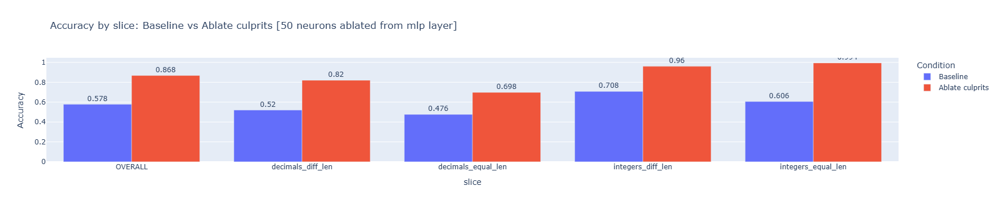

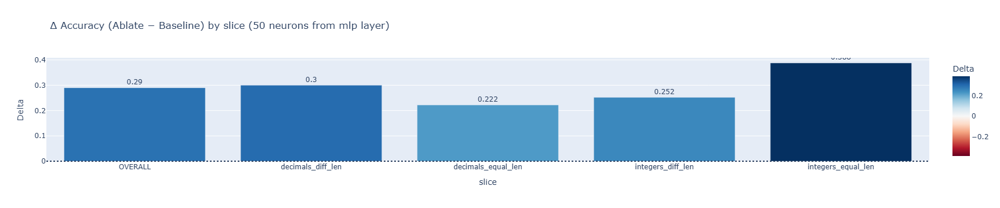

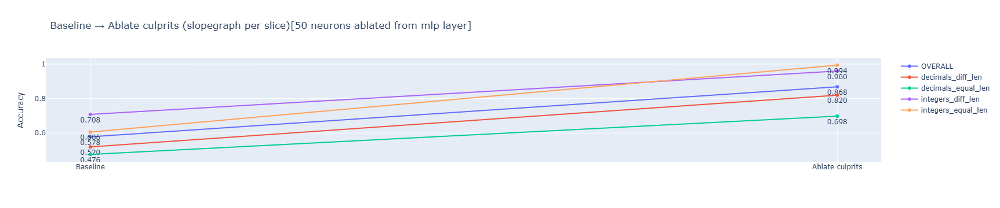

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import os

# ---- Input metrics ----
overall = {"Baseline": 0.578, "Ablate culprits": 0.868}

per_slice = {
    "decimals_diff_len":  {"Baseline": 0.520, "Ablate culprits": 0.820},
    "decimals_equal_len": {"Baseline": 0.476, "Ablate culprits": 0.698},
    "integers_diff_len":  {"Baseline": 0.708, "Ablate culprits": 0.960},
    "integers_equal_len": {"Baseline": 0.606, "Ablate culprits": 0.994},
}

# ---- DataFrames ----
overall_df = pd.DataFrame([{
    "slice": "OVERALL", 
    "Baseline": overall["Baseline"], 
    "Ablate culprits": overall["Ablate culprits"]
}])
slice_df = pd.DataFrame(
    [{"slice": k, "Baseline": v["Baseline"], "Ablate culprits": v["Ablate culprits"]} for k, v in per_slice.items()]
)
slice_df["Delta"] = slice_df["Ablate culprits"] - slice_df["Baseline"]
overall_df["Delta"] = overall_df["Ablate culprits"] - overall_df["Baseline"]

full_df = pd.concat([overall_df, slice_df], ignore_index=True)

# Ensure data/ folder exists
os.makedirs("data", exist_ok=True)

# ---- 1) Grouped bar chart (Baseline vs Ablated) ----
bar_df = full_df.melt(id_vars="slice", value_vars=["Baseline","Ablate culprits"], var_name="Condition", value_name="Accuracy")

fig1 = px.bar(
    bar_df, x="slice", y="Accuracy", color="Condition", barmode="group",
    text=bar_df["Accuracy"].round(3),
    title="Accuracy by slice: Baseline vs Ablate culprits [50 neurons ablated from mlp layer]"
)
fig1.update_traces(textposition="outside")
fig1.write_html("data/accuracy_grouped_bar_resid_post.html", full_html=False,  include_plotlyjs="cdn")

# ---- 2) Delta bar chart (improvement per slice) ----
fig2 = px.bar(
    full_df, x="slice", y="Delta", text=full_df["Delta"].round(3),
    title="Δ Accuracy (Ablate − Baseline) by slice (50 neurons from mlp layer)", color="Delta", color_continuous_scale="RdBu", color_continuous_midpoint=0,
)
fig2.update_traces(textposition="outside")
fig2.add_hline(y=0, line_dash="dot")
fig2.write_html("data/accuracy_delta_bar_resid_post.html", full_html=False,  include_plotlyjs="cdn")

# ---- 3) Slopegraph-style line chart ----
fig3 = go.Figure()
for _, row in full_df.iterrows():
    fig3.add_trace(go.Scatter(
        x=["Baseline","Ablate culprits"],
        y=[row["Baseline"], row["Ablate culprits"]],
        mode="lines+markers+text",
        text=[f"{row['Baseline']:.3f}", f"{row['Ablate culprits']:.3f}"],
        textposition="bottom center",
        name=row["slice"]
    ))

fig3.update_layout(title="Baseline → Ablate culprits (slopegraph per slice)[50 neurons ablated from mlp layer]", yaxis_title="Accuracy")
fig3.write_html("data/accuracy_slopegraph_resid_post.html", full_html=False,  include_plotlyjs="cdn")
fig1.show()
fig2.show()
fig3.show()
# "Saved plotly charts in data/accuracy_grouped_bar.html, data/accuracy_delta_bar.html, data/accuracy_slopegraph.html"


In [79]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import os

# ---- Input metrics ----
overall = {"Baseline": 0.578, "Ablate culprits": 0.868}

per_slice = {
    "decimals_diff_len":  {"Baseline": 0.520, "Ablate culprits": 0.820},
    "decimals_equal_len": {"Baseline": 0.476, "Ablate culprits": 0.698},
    "integers_diff_len":  {"Baseline": 0.708, "Ablate culprits": 0.960},
    "integers_equal_len": {"Baseline": 0.606, "Ablate culprits": 0.994},
}

# ---- DataFrames ----
overall_df = pd.DataFrame([{
    "slice": "OVERALL", 
    "Baseline": overall["Baseline"], 
    "Ablate culprits": overall["Ablate culprits"]
}])
slice_df = pd.DataFrame(
    [{"slice": k, "Baseline": v["Baseline"], "Ablate culprits": v["Ablate culprits"]} for k, v in per_slice.items()]
)
slice_df["Delta"] = slice_df["Ablate culprits"] - slice_df["Baseline"]
overall_df["Delta"] = overall_df["Ablate culprits"] - overall_df["Baseline"]

full_df = pd.concat([overall_df, slice_df], ignore_index=True)

# Ensure data/ folder exists
os.makedirs("data", exist_ok=True)

# ---- 1) Grouped bar chart (Baseline vs Ablated) ----
bar_df = full_df.melt(id_vars="slice", value_vars=["Baseline","Ablate culprits"], var_name="Condition", value_name="Accuracy")

fig1 = px.bar(
    bar_df, x="slice", y="Accuracy", color="Condition", barmode="group",
    text=bar_df["Accuracy"].round(3),
    title="Accuracy by slice: Baseline vs Ablate culprits [50 neurons ablated from mlp layer]"
)
fig1.update_traces(textposition="outside")
fig1.write_html("data/accuracy_grouped_bar_resid_post.html", full_html=False,  include_plotlyjs="cdn")

# ---- 2) Delta bar chart (improvement per slice) ----
fig2 = px.bar(
    full_df, x="slice", y="Delta", text=full_df["Delta"].round(3),
    title="Δ Accuracy (Ablate − Baseline) by slice (50 neurons from mlp layer)", color="Delta", color_continuous_scale="RdBu", color_continuous_midpoint=0,
)
fig2.update_traces(textposition="outside")
fig2.add_hline(y=0, line_dash="dot")
fig2.write_html("data/accuracy_delta_bar_resid_post.html", full_html=False,  include_plotlyjs="cdn")

# ---- 3) Slopegraph-style line chart ----
fig3 = go.Figure()
for _, row in full_df.iterrows():
    fig3.add_trace(go.Scatter(
        x=["Baseline","Ablate culprits"],
        y=[row["Baseline"], row["Ablate culprits"]],
        mode="lines+markers+text",
        text=[f"{row['Baseline']:.3f}", f"{row['Ablate culprits']:.3f}"],
        textposition="bottom center",
        name=row["slice"]
    ))

fig3.update_layout(title="Baseline → Ablate culprits (slopegraph per slice)[50 neurons ablated from mlp layer]", yaxis_title="Accuracy")
fig3.write_html("data/accuracy_slopegraph_resid_post.html", full_html=False,  include_plotlyjs="cdn")
fig1.show()
fig2.show()
fig3.show()
# "Saved plotly charts in data/accuracy_grouped_bar.html, data/accuracy_delta_bar.html, data/accuracy_slopegraph.html"


In [142]:
accs_abl

{'decimals_diff_len': 0.814,
 'integers_equal_len': 0.994,
 'decimals_equal_len': 0.684,
 'integers_diff_len': 0.958}

In [172]:
import numpy as np, pandas as pd, torch
from collections import defaultdict
from transformer_lens.utils import get_act_name

PROMPT_COL = "prompt_simple" if "prompt_simple" in df.columns else "prompt_mcq"
LAST = model.cfg.n_layers - 1
mlp_post_name = get_act_name("mlp_post", LAST)

device = next(model.parameters()).device

def to_toks(s): 
    return model.to_tokens(s, prepend_bos=True).to(device)

def margin_yes_minus_no(logits_last):
    # no softmax needed for argmax between two classes
    return (logits_last[yes_id] - logits_last[no_id]).item()

def pred_from_margin(m):
    return "Yes" if m > 0 else "No"

def _make_hook(neuron_idx_set=None, scale=None):
    """Hook that optionally zeros/scales selected neurons at last-layer mlp_post."""
    if neuron_idx_set is None:
        return None
    idx = torch.tensor(sorted(neuron_idx_set), device=device)
    def hook_mask(value, hook):
        out = value
        if scale is None:
            out = value.clone()
            out[..., idx] = 0.0
        else:
            out = value.clone()
            out[..., idx] = out[..., idx] * scale
        return out
    return hook_mask

@torch.no_grad()
def eval_examples(conditions, cols=("pair_type","truth_yn",PROMPT_COL)):
    """
    Returns a long DataFrame with one row per (example × condition):
      columns: idx, pair_type, truth_yn, prompt, condition, margin, pred, correct
    """
    rows = []
    sub = df[list(cols)].dropna().reset_index(drop=True)

    for cond in conditions:
        name   = cond["name"]
        idxset = cond.get("idx", None)
        scale  = cond.get("scale", None)

        hook_fn = _make_hook(idxset, scale)
        hooks = []
        if hook_fn is not None:
            hooks = [(mlp_post_name, hook_fn)]

        with model.hooks(fwd_hooks=hooks):
            for i, r in tqdm(sub.iterrows(), total=len(sub), desc=f"Condition={name}"):
                prompt = r[PROMPT_COL]
                toks = to_toks(prompt)
                logits = model(toks)[0, -1]
                margin = margin_yes_minus_no(logits)
                pred = pred_from_margin(margin)
                correct = (pred == r["truth_yn"])

                rows.append({
                    "i": i,
                    "pair_type": r["pair_type"],
                    "truth_yn": r["truth_yn"],
                    "prompt": prompt,
                    "condition": name,
                    "margin": margin,
                    "pred": pred,
                    "correct": bool(correct),
                })

    return pd.DataFrame(rows)
    
# -------------------------
# Example usage:
# -------------------------
culprits_diff_decimal = [406, 7592, 7026, 2045, 7986, 8945, 8222, 6040, 6743, 6406, 7033, 4361, 341, 3954, 4673, 5637, 8673, 3062, 4482, 2686, 7188, 1494, 2177, 8389, 822, 7184, 3200, 239, 1986, 4331]

conditions_diff_decimal = [
    {"name": "baseline"},
    {"name": "abl_culprits", "idx": culprits_diff_decimal, "scale": None},
    # add more if you like:
    # {"name": "scale_0.5", "idx": culprits, "scale": 0.5},
]

results_diff_decimal = eval_examples(conditions_diff_decimal)

Condition=abl_culprits: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [11:55<00:00,  2.80it/s]


In [82]:
import numpy as np, pandas as pd, torch
from collections import defaultdict
from transformer_lens.utils import get_act_name

PROMPT_COL = "prompt_simple" if "prompt_simple" in df.columns else "prompt_mcq"
LAST = model.cfg.n_layers - 1
mlp_post_name = get_act_name("mlp_post", LAST)

device = next(model.parameters()).device

def to_toks(s): 
    return model.to_tokens(s, prepend_bos=True).to(device)

def margin_yes_minus_no(logits_last):
    # no softmax needed for argmax between two classes
    return (logits_last[yes_id] - logits_last[no_id]).item()

def pred_from_margin(m):
    return "Yes" if m > 0 else "No"

def _make_hook(neuron_idx_set=None, scale=None):
    """Hook that optionally zeros/scales selected neurons at last-layer mlp_post."""
    if neuron_idx_set is None:
        return None
    idx = torch.tensor(sorted(neuron_idx_set), device=device)
    def hook_mask(value, hook):
        out = value
        if scale is None:
            out = value.clone()
            out[..., idx] = 0.0
        else:
            out = value.clone()
            out[..., idx] = out[..., idx] * scale
        return out
    return hook_mask

@torch.no_grad()
def eval_examples(conditions, cols=("pair_type","truth_yn",PROMPT_COL)):
    """
    Returns a long DataFrame with one row per (example × condition):
      columns: idx, pair_type, truth_yn, prompt, condition, margin, pred, correct
    """
    rows = []
    sub = df[list(cols)].dropna().reset_index(drop=True)

    for cond in conditions:
        name   = cond["name"]
        idxset = cond.get("idx", None)
        scale  = cond.get("scale", None)

        hook_fn = _make_hook(idxset, scale)
        hooks = []
        if hook_fn is not None:
            hooks = [(mlp_post_name, hook_fn)]

        with model.hooks(fwd_hooks=hooks):
            for i, r in tqdm(sub.iterrows(), total=len(sub), desc=f"Condition={name}"):
                prompt = r[PROMPT_COL]
                toks = to_toks(prompt)
                logits = model(toks)[0, -1]
                margin = margin_yes_minus_no(logits)
                pred = pred_from_margin(margin)
                correct = (pred == r["truth_yn"])

                rows.append({
                    "i": i,
                    "pair_type": r["pair_type"],
                    "truth_yn": r["truth_yn"],
                    "prompt": prompt,
                    "condition": name,
                    "margin": margin,
                    "pred": pred,
                    "correct": bool(correct),
                })

    return pd.DataFrame(rows)
    
# -------------------------
# Example usage:
# -------------------------
culprits = [406, 7592, 2045, 7026, 7986, 8945, 3809, 6040, 6406, 8673, 2177,
            3667, 3954, 341, 7870, 7248, 4487, 1914, 4673, 530, 7188, 8510,
            8579, 7472, 8102, 9126, 2482, 496, 5205, 721, 6076, 2363, 2251,
            3280, 6743, 2405, 6968, 3294, 6726, 1259, 4015, 526, 5980, 8659,
            1232, 3628, 6534, 4482, 8898, 7565]

conditions = [
    {"name": "baseline"},
    {"name": "abl_culprits", "idx": culprits, "scale": None},
    # add more if you like:
    # {"name": "scale_0.5", "idx": culprits, "scale": 0.5},
]

results = eval_examples(conditions)

Condition=abl_culprits: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [10:20<00:00,  3.22it/s]


In [83]:
results

,i,pair_type,truth_yn,prompt,condition,margin,pred,correct
0,0,decimals_diff_len,Yes,Question: Is 37.69 > 37.4? Answer:,baseline,4.660156,Yes,True
1,1,integers_equal_len,Yes,Question: Is 9078 > 3519? Answer:,baseline,5.035156,Yes,True
2,2,decimals_equal_len,No,Question: Is 42.31 > 42.34? Answer:,baseline,2.753906,Yes,False
3,3,decimals_equal_len,Yes,Question: Is 56.680 > 56.656? Answer:,baseline,4.808594,Yes,True
4,4,integers_diff_len,Yes,Question: Is 5573 > 338? Answer:,baseline,3.964844,Yes,True
...,...,...,...,...,...,...,...,...
3995,1995,decimals_diff_len,No,Question: Is 55.08 > 55.187? Answer:,abl_culprits,1.960938,Yes,False
3996,1996,decimals_equal_len,No,Question: Is 70.06 > 70.34? Answer:,abl_culprits,0.640625,Yes,False
3997,1997,decimals_diff_len,Yes,Question: Is 52.97 > 52.0? Answer:,abl_culprits,3.531250,Yes,True
3998,1998,integers_equal_len,No,Question: Is 2761 > 2776? Answer:,abl_culprits,-4.804688,No,True


In [84]:
# Now you can slice & dice later:
# overall accuracy per condition
acc_overall = results.groupby("condition")["correct"].mean().sort_values(ascending=False)
display(acc_overall)

# per-slice accuracy
acc_by_slice = results.groupby(["condition","pair_type"])["correct"].mean().unstack()
display(acc_by_slice)

# confusion-like table (truth vs pred) per condition
ct = pd.crosstab(index=[results["condition"], results["truth_yn"]],
                 columns=results["pred"],
                 normalize="index")
display(ct)

condition
abl_culprits    0.8625
baseline        0.5775
Name: correct, dtype: float64

pair_type,decimals_diff_len,decimals_equal_len,integers_diff_len,integers_equal_len
condition,,,,
abl_culprits,0.814,0.684,0.958,0.994
baseline,0.520,0.476,0.708,0.606


pred                         No       Yes
condition    truth_yn                    
abl_culprits No        0.743217  0.256783
             Yes       0.010331  0.989669
baseline     No        0.181202  0.818798
             Yes       0.000000  1.000000

In [87]:
fresults = results.merge(kg[['len']].reset_index().rename(columns = {'index': 'i'}), on = ['i'])

In [88]:
fresults.loc[fresults['len'] == True, 'len'] = "Greater"
fresults.loc[fresults['len'] == False,'len'] = "Smaller"

/tmp/ipykernel_18271/1145833100.py:1: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Greater' has dtype incompatible with bool, please explicitly cast to a compatible dtype first.



In [89]:
# confusion-like table (truth vs pred) per condition
ct = pd.crosstab(index=[ results["pair_type"], results["truth_yn"], fresults['len']],
                 columns=[fresults["condition"], fresults["pred"]],
                 normalize="index")
ct_diff = ct.loc[[idx for idx in ct.index if "equal" not in idx[0]]]
display(ct_diff)

condition                          abl_culprits            baseline          
pred                                         No       Yes        No       Yes
pair_type         truth_yn len                                               
decimals_diff_len No       Greater     0.264151  0.235849  0.000000  0.500000
                           Smaller     0.350000  0.150000  0.021429  0.478571
                  Yes      Greater     0.000000  0.500000  0.000000  0.500000
                           Smaller     0.004132  0.495868  0.000000  0.500000
integers_diff_len No       Smaller     0.474510  0.025490  0.213725  0.286275
                  Yes      Greater     0.016327  0.483673  0.000000  0.500000

In [175]:
ct_diff

abl_culprits            baseline          
                                             No       Yes        No       Yes
pair_type         truth_yn len                                               
decimals_diff_len No       Greater     0.264151  0.235849  0.000000  0.500000
                           Smaller     0.350000  0.150000  0.021429  0.478571
                  Yes      Greater     0.000000  0.500000  0.000000  0.500000
                           Smaller     0.004132  0.495868  0.000000  0.500000
integers_diff_len No       Smaller     0.474510  0.025490  0.213725  0.286275
                  Yes      Greater     0.016327  0.483673  0.000000  0.500000

In [179]:
import pandas as pd
import numpy as np
import plotly.express as px
import os

# --- 0) Ensure your table is in `ct` ---
# ct = <your DataFrame shown above>

# --- 1) Keep only *diff* slices ---
idx_pair = ct.index.get_level_values("pair_type")
ct_diff = ct.loc[idx_pair.str.contains("diff")].copy()

# --- 2) Compute per-cell improvement: (abl_culprits − baseline) ---
# Your columns are a 2-level MultiIndex like: ('condition','abl_culprits') etc., and 'pred' as columns too.
# We want the improvement for each (pred ∈ {No,Yes}) cell.
# First, bring columns to a flat Index for easier selection:
ct_diff.columns = pd.MultiIndex.from_tuples(ct_diff.columns)
abl = ct_diff.xs(("abl_culprits"), axis=1, level=0)
base = ct_diff.xs(("baseline"),     axis=1, level=0)

delta = abl - base   # same index as ct_diff, columns=['No','Yes']

# --- 3) Make a tidy frame for Plotly heatmap ---
# Index: (pair_type, truth_yn, len), Columns: pred ∈ {'No','Yes'}
# We'll add a label that combines index levels to put on y-axis.
delta_tidy = delta.copy()
delta_tidy["row_label"] = [
    f"{pt} | truth={ty} | len={le}"
    for pt, ty, le in delta_tidy.index
]
delta_plot = delta_tidy.set_index("row_label")[["No","Yes"]].sort_index()

# --- 4) Plot: improvement heatmap ---
os.makedirs("data", exist_ok=True)
fig = px.imshow(
    delta_plot.values,
    x=delta_plot.columns.tolist(),
    y=delta_plot.index.tolist(),
    color_continuous_scale="RdBu",
    origin="upper",
    aspect="auto",
    zmin=-0.5, zmax=0.5,  # symmetric range; adjust if needed
    title="Δ Accuracy (Ablate − Baseline) by (pair_type, truth, len, pred)"
)
fig.update_layout(coloraxis_colorbar_title="Δ acc")
fig.add_hline(y=-0.5, line_width=1, line_dash="dot")
fig.write_html("data/diff_improvement_heatmap.html")
print("Saved: data/diff_improvement_heatmap.html")

# --- 5) (Optional) Also show absolute accuracies side-by-side as heatmaps ---
# Ablated acc
abl_tidy = abl.copy()
abl_tidy["row_label"] = [
    f"{pt} | truth={ty} | len={le}"
    for pt, ty, le in abl_tidy.index
]
abl_plot = abl_tidy.set_index("row_label")[["No","Yes"]].sort_index()
fig2 = px.imshow(
    abl_plot.values, x=abl_plot.columns, y=abl_plot.index,
    color_continuous_scale="Viridis", origin="upper", aspect="auto",
    zmin=0.0, zmax=1.0, title="Ablated accuracy by (pair_type, truth, len, pred)"
)
fig2.update_layout(coloraxis_colorbar_title="acc")
fig2.write_html("data/diff_ablated_heatmap.html")

# Baseline acc
base_tidy = base.copy()
base_tidy["row_label"] = [
    f"{pt} | truth={ty} | len={le}"
    for pt, ty, le in base_tidy.index
]
base_plot = base_tidy.set_index("row_label")[["No","Yes"]].sort_index()
fig3 = px.imshow(
    base_plot.values, x=base_plot.columns, y=base_plot.index,
    color_continuous_scale="Viridis", origin="upper", aspect="auto",
    zmin=0.0, zmax=1.0, title="Baseline accuracy by (pair_type, truth, len, pred)"
)
fig3.update_layout(coloraxis_colorbar_title="acc")
fig3.write_html("data/diff_baseline_heatmap.html")
print("Saved: data/diff_ablated_heatmap.html, data/diff_baseline_heatmap.html")
abl

Saved: data/diff_improvement_heatmap.html
Saved: data/diff_ablated_heatmap.html, data/diff_baseline_heatmap.html


No       Yes
pair_type         truth_yn len                        
decimals_diff_len No       Greater  0.264151  0.235849
                           Smaller  0.350000  0.150000
                  Yes      Greater  0.000000  0.500000
                           Smaller  0.004132  0.495868
integers_diff_len No       Smaller  0.474510  0.025490
                  Yes      Greater  0.016327  0.483673

In [180]:
# -------------------------
# Example usage:
# -------------------------
culprits = [406, 7592, 2045, 7026, 7986, 8945, 3809, 6040, 6406, 8673]

conditions = [
    {"name": "baseline"},
    {"name": "abl_culprits", "idx": culprits, "scale": None},
    # add more if you like:
    # {"name": "scale_0.5", "idx": culprits, "scale": 0.5},
]

results_10neuron = eval_examples(conditions)

Condition=abl_culprits: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [12:34<00:00,  2.65it/s]


In [181]:
# Now you can slice & dice later:
# overall accuracy per condition
acc_overall = results_10neuron.groupby("condition")["correct"].mean().sort_values(ascending=False)
display(acc_overall)

# per-slice accuracy
acc_by_slice = results_10neuron.groupby(["condition","pair_type"])["correct"].mean().unstack()
display(acc_by_slice)

# confusion-like table (truth vs pred) per condition
ct = pd.crosstab(index=[results_10neuron["condition"], results_10neuron["truth_yn"]],
                 columns=results_10neuron["pred"],
                 normalize="index")
display(ct)

condition
abl_culprits    0.7755
baseline        0.5775
Name: correct, dtype: float64

pair_type,decimals_diff_len,decimals_equal_len,integers_diff_len,integers_equal_len
condition,,,,
abl_culprits,0.67,0.552,0.920,0.960
baseline,0.52,0.476,0.708,0.606


pred                         No       Yes
condition    truth_yn                    
abl_culprits No        0.569767  0.430233
             Yes       0.005165  0.994835
baseline     No        0.181202  0.818798
             Yes       0.000000  1.000000

In [90]:
import numpy as np, pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit
from tqdm import tqdm

# ---------- helpers ----------
def truth_sign_vec(series):
    return np.where(series.values == "Yes", +1, -1)

def compute_contrib_df(dataframe, prompt_col="prompt_simple"):
    """Compute per-example contrib vectors (unaligned + aligned)."""
    rows = []
    for _, rr in tqdm(dataframe[[ "pair_type", "truth_yn", prompt_col ]].dropna().iterrows(),
                      total=len(dataframe), desc="Contrib (train)"):
        contrib, local_margin = per_example_last_mlp_contrib(rr[prompt_col])
        rows.append({
            "pair_type": rr["pair_type"],
            "truth_yn": rr["truth_yn"],
            "contrib": contrib.numpy(),     # raw contrib_i = (Wout[i]·grad) * h_i
            "local_margin": local_margin
        })
    out = pd.DataFrame(rows)
    # align once by truth: positive => helps correct label
    out["sign"] = truth_sign_vec(out["truth_yn"])
    out["aligned_contrib"] = [c * s for c, s in zip(out["contrib"], out["sign"])]
    return out

def rank_neurons_train(train_contrib_df, mode="harmful"):
    """
    mode="harmful": pick neurons with most negative mean aligned contribution (hurt correctness).
    mode="helpful": pick neurons with most positive mean aligned contribution.
    Returns sorted indices and the score vector.
    """
    mat = np.stack(train_contrib_df["aligned_contrib"].values, axis=0)  # [N, d_mlp]
    scores = mat.mean(axis=0)  # mean helpfulness per neuron
    if mode == "harmful":
        order = np.argsort(scores)           # most negative first
    elif mode == "helpful":
        order = np.argsort(-scores)          # most positive first
    else:
        raise ValueError("mode must be 'harmful' or 'helpful'")
    return order, scores

def eval_examples_on_df(dataframe, conditions, prompt_col="prompt_simple"):
    """
    Same as your eval_examples but operates on a provided dataframe (no global df dependency).
    """
    rows = []
    sub = dataframe[[ "pair_type", "truth_yn", prompt_col ]].dropna().reset_index(drop=True)

    for cond in conditions:
        name   = cond["name"]
        idxset = cond.get("idx", None)
        scale  = cond.get("scale", None)

        hook_fn = _make_hook(idxset, scale) if idxset is not None or scale is not None else None
        hooks = [(mlp_post_name, hook_fn)] if hook_fn is not None else []

        with model.hooks(fwd_hooks=hooks):
            for i, r in tqdm(sub.iterrows(), total=len(sub), desc=f"Eval [{name}]"):
                toks = to_toks(r[prompt_col])
                logits = model(toks)[0, -1]
                margin = logits[yes_id].item() - logits[no_id].item()
                pred = "Yes" if margin > 0 else "No"
                rows.append({
                    "i": i,
                    "pair_type": r["pair_type"],
                    "truth_yn": r["truth_yn"],
                    "prompt": r[prompt_col],
                    "condition": name,
                    "margin": float(margin),
                    "pred": pred,
                    "correct": bool(pred == r["truth_yn"]),
                })
    return pd.DataFrame(rows)

def summarize_results(results_df):
    """Global + per-slice summary with Δ vs baseline."""
    g = (results_df.groupby("condition")
         .agg(n=("i","count"), acc=("correct","mean"), mean_margin=("margin","mean"))
         .reset_index())
    base = g.set_index("condition").loc["baseline"]
    g["Δacc_vs_base"] = g["acc"] - base["acc"]
    g["Δmargin_vs_base"] = g["mean_margin"] - base["mean_margin"]

    p = (results_df.groupby(["pair_type","condition"])
         .agg(n=("i","count"), acc=("correct","mean"), mean_margin=("margin","mean"))
         .reset_index())
    p_wide = p.pivot_table(index="pair_type", columns="condition", values=["n","acc","mean_margin"])
    # add deltas
    if ("acc","baseline") in p_wide.columns:
        for cond in p_wide["acc"].columns:
            if cond == "baseline": continue
            p_wide[("Δacc", cond)] = p_wide[("acc", cond)] - p_wide[("acc","baseline")]
    if ("mean_margin","baseline") in p_wide.columns:
        for cond in p_wide["mean_margin"].columns:
            if cond == "baseline": continue
            p_wide[("Δmean_margin", cond)] = p_wide[("mean_margin", cond)] - p_wide[("mean_margin","baseline")]
    return g, p_wide

In [110]:
from sklearn.model_selection import StratifiedKFold

def run_kfold(df, k_neurons=50, mode="harmful", prompt_col="prompt_simple",
              n_splits=5, seed=0, random_control=True):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    y = df["truth_yn"].values

    fold_rows = []
    all_fold_results = []

    for fold, (tr_idx, va_idx) in enumerate(skf.split(df, y), start=1):
        if fold != 3:
            continue
        train_df = df.iloc[tr_idx].reset_index(drop=True)
        val_df   = df.iloc[va_idx].reset_index(drop=True)

        # selection on TRAIN
        train_contrib = compute_contrib_df(train_df, prompt_col=prompt_col)
        order, scores = rank_neurons_train(train_contrib, mode=mode)
        culprits = order[:k_neurons]

        # controls
        rng = np.random.default_rng(seed + fold)
        rand_k = rng.choice(len(scores), size=k_neurons, replace=False) if random_control else None

        # eval on VAL
        conditions = [{"name":"baseline"},
                      {"name":f"abl_{mode}_top{k_neurons}", "idx": culprits, "scale": None}]
        if random_control:
            conditions.append({"name":f"abl_random_top{k_neurons}", "idx": rand_k, "scale": None})

        res = eval_examples_on_df(val_df, conditions, prompt_col=prompt_col)
        all_fold_results.append(res.assign(fold=fold))

        # summarize per fold
        gsum, _ = summarize_results(res)
        gsum = gsum.assign(fold=fold)
        fold_rows.append(gsum)

    fold_summary = pd.concat(fold_rows, ignore_index=True)

    
    # aggregate across folds
    agg = (fold_summary.groupby("condition")
           .agg(
               folds=("fold","nunique"),
               mean_acc=("acc","mean"),
               std_acc=("acc","std"),
               mean_delta_acc=("Δacc_vs_base","mean"),
               std_delta_acc=("Δacc_vs_base","std"),
               mean_margin=("mean_margin","mean"),
               mean_delta_margin=("Δmargin_vs_base","mean"),
           ).reset_index())

    return {
        "per_fold_summary": fold_summary,
        "aggregate_summary": agg,
        "all_fold_results_long": pd.concat(all_fold_results, ignore_index=True),
    }

# Example:
cv_out = run_kfold(df, k_neurons=50, mode="harmful", prompt_col=PROMPT_COL, n_splits=3, seed=0)
display(cv_out["aggregate_summary"])



# from sklearn.model_selection import StratifiedKFold
# import numpy as np
# import pandas as pd

# --- assumes you already have: compute_contrib_df, rank_neurons_train, eval_examples_on_df ---

# def select_culprits_by_slice(train_df, prompt_col="prompt_simple", k=50, mode="harmful"):
#     culprits_map = {}
#     for ptype, grp in train_df.groupby("pair_type"):
#         contrib_df = compute_contrib_df(grp, prompt_col=prompt_col)
#         order, _ = rank_neurons_train(contrib_df, mode=mode)
#         culprits_map[ptype] = order[:k]
#     return culprits_map

# def eval_cross_slice(val_df, culprits_map, prompt_col="prompt_simple"):
#     conditions = [{"name":"baseline"}] + [
#         {"name":f"abl_from[{ptype}]", "idx": idxs, "scale": None}
#         for ptype, idxs in culprits_map.items()
#     ]
#     res = eval_examples_on_df(val_df, conditions, prompt_col=prompt_col)
#     per_target = (res.groupby(["pair_type","condition"])
#                     .agg(n=("i","count"), acc=("correct","mean"), mean_margin=("margin","mean"))
#                     .reset_index())
#     return res, per_target

# def run_kfold_pairwise(df, k_neurons=50, mode="harmful", prompt_col="prompt_simple",
#                        n_splits=5, seed=0):
#     skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
#     y = df["truth_yn"].values
#     per_fold_targets = []
#     for fold, (tr, va) in enumerate(skf.split(df, y), start=1):
#         train_df = df.iloc[tr].reset_index(drop=True)
#         val_df   = df.iloc[va].reset_index(drop=True)
#         culprits_map = select_culprits_by_slice(train_df, prompt_col=prompt_col,
#                                                 k=k_neurons, mode=mode)
#         _, per_target = eval_cross_slice(val_df, culprits_map, prompt_col=prompt_col)
#         per_fold_targets.append(per_target.assign(fold=fold))
#     return {"per_fold_targets": pd.concat(per_fold_targets, ignore_index=True)}

# cv_pair = run_kfold_pairwise(df.iloc[:20], k_neurons=50, mode="harmful",
#                              prompt_col=PROMPT_COL, n_splits=5, seed=0)


Eval [abl_random_top50]: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 666/666 [06:09<00:00,  1.80it/s]


,condition,folds,mean_acc,std_acc,mean_delta_acc,std_delta_acc,mean_margin,mean_delta_margin
0,abl_harmful_top50,1,0.870871,NaN,0.282282,NaN,0.376525,-2.342668
1,abl_random_top50,1,0.584084,NaN,-0.004505,NaN,2.763244,0.044051
2,baseline,1,0.588589,NaN,0.000000,NaN,2.719193,0.000000


In [122]:
# import pickle 
# pickle.dump(cv_out, open('data/cv_out.pkl','wb'))

In [111]:
import pandas as pd
import numpy as np

def summarize_pairtype_from_cv_out(cv_out):
    """
    From cv_out['all_fold_results_long'] (rows = example × condition × fold),
    produce per-fold per-pair_type aggregates, then fold-averaged summaries
    with Δ vs baseline computed *within each fold*.
    """
    R = cv_out["all_fold_results_long"].copy()
    # 1) Per fold × pair_type × condition metrics
    per_fold = (R.groupby(["fold","pair_type","condition"])
                  .agg(n=("i","count"),
                       acc=("correct","mean"),
                       mean_margin=("margin","mean"))
                  .reset_index())

    # 2) Compute Δ vs baseline *within each fold & pair_type*
    def add_deltas(g):
        # g: one fold × pair_type (all conditions)
        out = g.copy()
        base_acc = g.loc[g["condition"]=="baseline","acc"]
        base_mrg = g.loc[g["condition"]=="baseline","mean_margin"]
        if len(base_acc)==1:
            out["Δacc_vs_base"] = g["acc"] - base_acc.values[0]
        else:
            out["Δacc_vs_base"] = np.nan
        if len(base_mrg)==1:
            out["Δmargin_vs_base"] = g["mean_margin"] - base_mrg.values[0]
        else:
            out["Δmargin_vs_base"] = np.nan
        return out

    per_fold = (per_fold
                .groupby(["fold","pair_type"], group_keys=False)
                .apply(add_deltas))

    # 3) Fold-aggregated summaries (mean ± sd across folds)
    agg = (per_fold.groupby(["pair_type","condition"])
           .agg(
               folds=("fold","nunique"),
               mean_acc=("acc","mean"),
               std_acc=("acc","std"),
               mean_delta_acc=("Δacc_vs_base","mean"),
               std_delta_acc=("Δacc_vs_base","std"),
               mean_margin=("mean_margin","mean"),
               mean_delta_margin=("Δmargin_vs_base","mean"),
               std_delta_margin=("Δmargin_vs_base","std"),
           ).reset_index())

    # 4) Convenience wide tables
    #   a) mean accuracy (rows=pair_type, cols=condition)
    acc_wide = agg.pivot(index="pair_type", columns="condition", values="mean_acc")
    #   b) mean Δ acc (pp) vs baseline (rows=pair_type, cols=condition≠baseline)
    delta_acc_wide_pp = (100.0 * agg.pivot(index="pair_type", columns="condition",
                                           values="mean_delta_acc"))
    if "baseline" in delta_acc_wide_pp.columns:
        delta_acc_wide_pp = delta_acc_wide_pp.drop(columns=["baseline"])

    return {
        "per_fold_pair": per_fold,             # per fold × slice × condition (with Δ)
        "agg_pair_cond": agg,                  # fold-averaged stats
        "acc_wide": acc_wide,                  # mean acc by slice×condition
        "delta_acc_wide_pp": delta_acc_wide_pp # mean Δ acc (pp) vs baseline by slice×cond
    }

In [147]:
import plotly.express as px
import plotly.graph_objects as go

def plot_pairtype_grouped_acc(cv_out):
    S = summarize_pairtype_from_cv_out(cv_out)
    agg = S["agg_pair_cond"].copy()
    # keep baseline and your ablation conditions
    fig = px.bar(
        agg.assign(acc_pct = 100*agg["mean_acc"]),
        x="pair_type", y="acc_pct", color="condition",
        error_y="std_acc", barmode="group",
        title="K-fold: Accuracy by pair_type and condition (mean ± sd)",
        labels={"acc_pct":"Accuracy (%)"}
    )
    fig.update_yaxes(range=[0,100])
    fig.update_layout(xaxis_tickangle=-20, legend_title="Condition")
    fig.write_html("data/pairtype_grouped_acc.html", full_html=False,  include_plotlyjs="cdn")
    fig.show()

def plot_pairtype_delta_heatmap(cv_out, title="K-fold: Δ Accuracy vs baseline (pp) by pair_type × condition"):
    S = summarize_pairtype_from_cv_out(cv_out)

    M = S["delta_acc_wide_pp"].copy()  # rows=pair_type, cols=condition≠baseline
    M = M[["abl_harmful_top50"]].copy()

    if M.empty:
        print("No Δ matrix to plot (check conditions)."); return
    fig = px.imshow(
        M, text_auto=".2f", aspect="auto",
        labels=dict(color="Δ acc (pp)"), title=title, 
        color_continuous_scale="RdBu",
        color_continuous_midpoint=0 
    )
    fig.update_xaxes(title="Condition (vs baseline)")
    fig.update_yaxes(title="pair_type")
    fig.add_hline(y=-0.5, line_width=1, line_color="black")
    fig.add_vline(x=-0.5, line_width=1, line_color="black")
    fig.write_html("data/pairtype_delta_heatmap.html", full_html=False,  include_plotlyjs="cdn")
    fig.show()

def plot_pairtype_delta_bars(cv_out):
    S = summarize_pairtype_from_cv_out(cv_out)
    agg = S["agg_pair_cond"].copy()
    agg = agg[agg['condition'] == "abl_harmful_top50"].copy()
    # drop baseline (Δ=0)
    g = agg[agg["condition"]!="baseline"].copy()
    g["mean_delta_pp"] = 100*g["mean_delta_acc"]
    g["std_delta_pp"]  = 100*g["std_delta_acc"]

    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=g["pair_type"] + " • " + g["condition"],
        y=g["mean_delta_pp"],
        error_y=dict(type="data", array=g["std_delta_pp"], visible=True),
        text=np.round(g["mean_delta_pp"], 2),
        textposition="outside",
        name="Δ acc (pp)", 
        marker=dict(
            colorscale='RdBu',
            cmid=0,
        )
    ))
    m = float(np.max(np.abs(g["mean_delta_pp"])) if len(g) else 0.0)
    fig.update_yaxes(title="Δ Accuracy (pp)", range=[-max(1,m*1.3), max(1,m*1.3)])
    fig.update_layout(
        title="K-fold: Δ Accuracy (pp) vs baseline by pair_type (mean ± sd)",
        xaxis_title="pair_type • condition",
        xaxis_tickangle=-20
    )
    fig.add_hline(y=0, line_dash="dot")
    fig.write_html("data/pairtype_delta_bars.html", full_html=False,  include_plotlyjs="cdn")
    fig.show()

def plot_pairtype_delta_margin_heatmap(cv_out, title="K-fold: Δ Mean Margin vs baseline by pair_type × condition"):
    S = summarize_pairtype_from_cv_out(cv_out)
    agg = S["agg_pair_cond"].copy()
    agg = agg[agg['condition'] == "abl_harmful_top50"].copy()
    M = agg.pivot(index="pair_type", columns="condition", values="mean_delta_margin")
    if "baseline" in M.columns:
        M = M.drop(columns=["baseline"])
    if M.empty:
        print("No Δ margin matrix to plot."); return
    fig = px.imshow(M, text_auto=".3f", aspect="auto",
                    labels=dict(color="Δ margin"), title=title, 
        color_continuous_scale="RdBu",
        color_continuous_midpoint=0 )
    fig.update_xaxes(title="Condition (vs baseline)")
    fig.update_yaxes(title="pair_type")
    fig.write_html("data/pairtype_delta_margin_heatmap.html", full_html=False,  include_plotlyjs="cdn")
    fig.show()


def export_pairtype_tables(cv_out, prefix="cv_global_pairtype"):
    S = summarize_pairtype_from_cv_out(cv_out)
    S["per_fold_pair"].to_csv(f"{prefix}_per_fold_pair.csv", index=False)
    S["agg_pair_cond"].to_csv(f"{prefix}_agg_pair_cond.csv", index=False)
    S["acc_wide"].to_csv(f"{prefix}_acc_wide.csv")
    S["delta_acc_wide_pp"].to_csv(f"{prefix}_delta_acc_wide_pp.csv")
    print("Saved CSVs with prefix:", prefix)

In [148]:
# After: cv_out = run_kfold(df, k_neurons=50, mode="harmful", prompt_col=PROMPT_COL, n_splits=5, seed=0)

plot_pairtype_grouped_acc(cv_out)              # acc (%) by slice & condition, with sd bars
plot_pairtype_delta_heatmap(cv_out)            # Δ acc (pp) vs baseline heatmap
plot_pairtype_delta_bars(cv_out)               # Δ acc (pp) bars (mean ± sd) per slice
# Optional:
plot_pairtype_delta_margin_heatmap(cv_out)     # margin version
# Optional export:
export_pairtype_tables(cv_out)




/tmp/ipykernel_18271/991669774.py:36: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



/tmp/ipykernel_18271/991669774.py:36: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



/tmp/ipykernel_18271/991669774.py:36: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



/tmp/ipykernel_18271/991669774.py:36: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Saved CSVs with prefix: cv_global_pairtype


/tmp/ipykernel_18271/991669774.py:36: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [ ]:
def plot_cv_delta_bars(cv_out):
    agg = cv_out["aggregate_summary"].copy()
    # focus on Δ acc vs baseline with error bars
    g = agg[["condition","mean_delta_acc","std_delta_acc","folds"]].copy()
    g = g[g["condition"] != "baseline"]
    g["mean_delta_pp"] = 100*g["mean_delta_acc"]
    g["std_delta_pp"]  = 100*g["std_delta_acc"]

    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=g["condition"], y=g["mean_delta_pp"],
        error_y=dict(type="data", array=g["std_delta_pp"], visible=True),
        name="Δ Accuracy vs baseline",
        text=np.round(g["mean_delta_pp"], 2),
        textposition="outside",
    ))
    m = float(np.max(np.abs(g["mean_delta_pp"]))) if len(g) else 0.0
    fig.update_yaxes(title="Δ Accuracy (pp)", range=[-max(1,m*1.3), max(1,m*1.3)])
    fig.update_layout(title=f"K-fold: Δ Accuracy vs baseline (mean ± 1 sd), folds={int(agg['folds'].max())}")
    fig.add_hline(y=0, line_dash="dot")
    fig.show()

def plot_cv_mean_acc(cv_out):
    agg = cv_out["aggregate_summary"].copy()
    # overall mean acc per condition across folds
    fig = px.bar(
        agg, x="condition", y="mean_acc",
        error_y="std_acc",
        title="K-fold: mean accuracy ± 1 sd by condition",
        labels={"mean_acc":"Accuracy"}
    )
    fig.update_yaxes(range=[0,1])
    fig.show()

In [97]:
import numpy as np
import pandas as pd

def _delta_mats_from_per_fold(per_fold_targets: pd.DataFrame) -> dict:
    """
    Build Δ-accuracy matrices per fold:
    rows = target pair_type, cols = selector pair_type (from 'abl_from[selector]').
    Δacc(target, selector, fold) = acc(target | abl_from[selector]) - acc(target | baseline)
    Returns: {fold -> DataFrame (rows: target, cols: selector)}
    """
    mats = {}
    for fold, g in per_fold_targets.groupby("fold"):
        # g has rows per (pair_type, condition) with 'acc'
        base = (g[g["condition"] == "baseline"]
                .set_index("pair_type")["acc"])
        # all ablation-from conditions:
        sel = g[g["condition"].str.startswith("abl_from[")].copy()
        if sel.empty:
            continue
        sel["selector"] = sel["condition"].str.replace(r"^abl_from\[(.+)\]$", r"\1", regex=True)

        # pivot: rows = target pair_type, cols = selector, values = acc
        P = sel.pivot_table(index="pair_type", columns="selector", values="acc", aggfunc="first")

        # align base and P rows
        base_al = base.reindex(P.index)
        Delta = P.sub(base_al, axis=0)  # Δacc
        mats[fold] = Delta
    return mats

def _mean_std_matrix(mats: dict) -> (pd.DataFrame, pd.DataFrame):
    """
    Take {fold->Δacc matrix} and compute mean & std across folds,
    aligned on the union of indices/columns.
    """
    if not mats:
        return pd.DataFrame(), pd.DataFrame()
    # union shapes
    all_rows = sorted(set().union(*[m.index for m in mats.values()]))
    all_cols = sorted(set().union(*[m.columns for m in mats.values()]))

    aligned = []
    for m in mats.values():
        aligned.append(m.reindex(index=all_rows, columns=all_cols))

    # stack -> mean/std
    stack = np.stack([a.values for a in aligned], axis=0)  # [F, R, C]
    mean = pd.DataFrame(stack.mean(axis=0), index=all_rows, columns=all_cols)
    std  = pd.DataFrame(stack.std(axis=0, ddof=1 if stack.shape[0] > 1 else 0),
                        index=all_rows, columns=all_cols)
    return mean, std


import plotly.express as px

def plot_kfold_pairwise_mean_delta_heatmap(cv_pair, title="K-fold mean Δ accuracy (pp): rows=target, cols=selector"):
    """
    Uses cv_pair['per_fold_targets'] to compute Δ matrices per fold,
    then plots the mean Δ (in percentage points).
    """
    per_fold = cv_pair["per_fold_targets"].copy()
    mats = _delta_mats_from_per_fold(per_fold)
    mean, _std = _mean_std_matrix(mats)

    if mean.empty:
        print("No data to plot.")
        return

    fig = px.imshow(100.0 * mean, text_auto=".2f", aspect="auto",
                    labels=dict(color="Δ acc (pp)"),
                    title=title)
    fig.update_xaxes(title="Selector slice (culprits from)")
    fig.update_yaxes(title="Target slice (evaluated on)")
    fig.show()

def plot_kfold_pairwise_std_heatmap(cv_pair, title="K-fold std of Δ accuracy (pp)"):
    """Same as above but plots the std across folds (pp)."""
    per_fold = cv_pair["per_fold_targets"].copy()
    mats = _delta_mats_from_per_fold(per_fold)
    _mean, std = _mean_std_matrix(mats)

    if std.empty:
        print("No data to plot.")
        return

    fig = px.imshow(100.0 * std, text_auto=".2f", aspect="auto",
                    labels=dict(color="std Δ acc (pp)"),
                    title=title)
    fig.update_xaxes(title="Selector slice")
    fig.update_yaxes(title="Target slice")
    fig.show()


import plotly.graph_objects as go

def plot_kfold_in_slice_bars(cv_pair, title="In-slice Δ accuracy (pp) with error bars"):
    """
    For each target slice T, collect Δacc(T, selector=T, fold) across folds.
    Plot mean ± sd in percentage points.
    """
    per_fold = cv_pair["per_fold_targets"].copy()
    mats = _delta_mats_from_per_fold(per_fold)
    if not mats:
        print("No data to plot.")
        return

    # Build per-slice vectors across folds (diagonal)
    # First, get union of row/col labels
    all_rows = sorted(set().union(*[m.index for m in mats.values()]))
    all_cols = sorted(set().union(*[m.columns for m in mats.values()]))

    rows = []
    for t in all_rows:
        vals = []
        for f, M in mats.items():
            if t in M.index and t in M.columns:
                v = M.loc[t, t]
                if pd.notna(v):
                    vals.append(v)
        if vals:
            rows.append({
                "pair_type": t,
                "mean": np.mean(vals),
                "std": np.std(vals, ddof=1 if len(vals)>1 else 0),
                "n_folds": len(vals),
            })

    if not rows:
        print("No diagonal entries to plot.")
        return

    D = pd.DataFrame(rows).sort_values("mean")

    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=D["pair_type"],
        y=100.0 * D["mean"],
        error_y=dict(type="data", array=100.0 * D["std"], visible=True),
        text=np.round(100.0 * D["mean"], 2),
        textposition="outside",
        name="Δ acc (pp)"
    ))
    m = float(np.max(np.abs(100.0 * D["mean"])) if len(D) else 0.0)
    fig.update_yaxes(title="Δ Accuracy (pp)", range=[-max(1, m*1.3), max(1, m*1.3)])
    fig.update_layout(title=title, xaxis_title="pair_type")
    fig.add_hline(y=0, line_dash="dot")
    fig.show()


def plot_kfold_cross_slice_for_selector(cv_pair, selector_slice, title=None):
    """
    For a fixed selector slice S (culprits-from=S), show Δacc across TARGET slices,
    aggregated over folds (mean ± sd, in pp).
    """
    per_fold = cv_pair["per_fold_targets"].copy()
    mats = _delta_mats_from_per_fold(per_fold)
    if not mats:
        print("No data to plot.")
        return

    # Gather vector across folds for the requested selector
    rows = []
    targets = sorted(set().union(*[m.index for m in mats.values()]))
    for t in targets:
        vals = []
        for f, M in mats.items():
            if (t in M.index) and (selector_slice in M.columns):
                v = M.loc[t, selector_slice]
                if pd.notna(v):
                    vals.append(v)
        if vals:
            rows.append({"pair_type": t,
                         "mean": np.mean(vals),
                         "std": np.std(vals, ddof=1 if len(vals)>1 else 0),
                         "n_folds": len(vals)})

    if not rows:
        print(f"No data for selector '{selector_slice}'.")
        return

    D = pd.DataFrame(rows).sort_values("mean")

    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=D["pair_type"],
        y=100.0 * D["mean"],
        error_y=dict(type="data", array=100.0 * D["std"], visible=True),
        text=np.round(100.0 * D["mean"], 2),
        textposition="outside",
        name=f"Δ acc vs baseline (selector={selector_slice})"
    ))
    m = float(np.max(np.abs(100.0 * D["mean"])) if len(D) else 0.0)
    fig.update_yaxes(title="Δ Accuracy (pp)", range=[-max(1, m*1.3), max(1, m*1.3)])
    fig.update_layout(
        title=title or f"Cross-slice Δ accuracy (pp) from selector='{selector_slice}'",
        xaxis_title="Target pair_type")
    fig.add_hline(y=0, line_dash="dot")
    fig.show()



def export_kfold_pairwise_tables(cv_pair, prefix="kfold_pairwise"):
    per_fold = cv_pair["per_fold_targets"].copy()
    mats = _delta_mats_from_per_fold(per_fold)
    mean, std = _mean_std_matrix(mats)

    per_fold.to_csv(f"{prefix}_per_fold_targets.csv", index=False)
    if not mean.empty:
        (100.0 * mean).to_csv(f"{prefix}_mean_delta_pp.csv")  # rows=target, cols=selector
    if not std.empty:
        (100.0 * std).to_csv(f"{prefix}_std_delta_pp.csv")
    print("Saved:", f"{prefix}_per_fold_targets.csv",
          (f"{prefix}_mean_delta_pp.csv" if not mean.empty else ""),
          (f"{prefix}_std_delta_pp.csv" if not std.empty else ""))

In [100]:
plot_kfold_pairwise_mean_delta_heatmap(cv_pair)
plot_kfold_pairwise_std_heatmap(cv_pair)              # optional
plot_kfold_in_slice_bars(cv_pair)
plot_kfold_cross_slice_for_selector(cv_pair, selector_slice="decimals_diff_len")  # pick any slice key you have

export_kfold_pairwise_tables(cv_pair)                 # optional CSVs

plot_cv_delta_bars(cv_out)
plot_cv_mean_acc(cv_out)


Saved: kfold_pairwise_per_fold_targets.csv kfold_pairwise_mean_delta_pp.csv kfold_pairwise_std_delta_pp.csv


In [94]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np

def plot_global_accuracy(out):
    g = out["global_summary"].copy()
    g["acc_pct"] = 100 * g["acc"]
    fig = px.bar(
        g, x="condition", y="acc_pct", text="acc_pct",
        title="Accuracy by condition (single split)",
        labels={"acc_pct":"Accuracy (%)"}
    )
    fig.update_traces(texttemplate="%{text:.1f}%", textposition="outside")
    fig.update_yaxes(range=[0, 100])
    fig.show()

def plot_global_delta(out):
    g = out["global_summary"].copy()
    g = g[g["condition"] != "baseline"]
    g["Δacc_pct"] = 100 * g["Δacc_vs_base"]
    fig = px.bar(
        g, x="condition", y="Δacc_pct", text="Δacc_pct",
        title="Δ Accuracy vs baseline (single split)",
        labels={"Δacc_pct":"Δ Accuracy (pp)"}
    )
    fig.update_traces(texttemplate="%{text:.2f} pp", textposition="outside")
    # symmetric range around 0
    m = float(np.max(np.abs(g["Δacc_pct"]))) if len(g) else 0.0
    fig.update_yaxes(range=[-max(1,m*1.2), max(1,m*1.2)])
    fig.add_hline(y=0, line_dash="dot")
    fig.show()

def plot_pairtype_delta_heatmap(out, metric="acc"):
    """
    Heatmap of Δ vs baseline by pair_type x condition (excluding baseline).
    metric: "acc" or "mean_margin"
    """
    pwide = out["per_slice_summary"].copy()
    # convert MultiIndex columns -> long
    pwide = pwide.copy()
    pwide.columns = pd.MultiIndex.from_tuples(pwide.columns)  # ensure MI
    idx = pwide.index

    # build long frame of deltas
    rows = []
    for cond in pwide[metric].columns:
        if cond == "baseline": 
            continue
        delta_col = (f"Δ{metric}", cond)
        if delta_col in pwide.columns:
            for pt, val in zip(idx, pwide[delta_col]):
                rows.append({"pair_type": pt, "condition": cond, "delta": val})

    long = pd.DataFrame(rows)
    if metric == "acc":
        long["delta_pp"] = 100 * long["delta"]
        z = "delta_pp"; ztitle = "Δ Accuracy (pp)"
    else:
        z = "delta"; ztitle = f"Δ {metric}"

    fig = px.imshow(
        long.pivot(index="pair_type", columns="condition", values=z),
        aspect="auto", origin="lower",
        title=f"Per-slice Δ vs baseline ({'accuracy' if metric=='acc' else metric})"
    )
    fig.update_coloraxes(colorbar_title=ztitle)
    fig.add_hline(y=-0.5, line_color="black", line_width=1)
    fig.add_vline(x=-0.5, line_color="black", line_width=1)
    fig.show()

def plot_pairtype_bars(out, metric="acc"):
    """
    Grouped bars per pair_type for baseline vs ablation.
    """
    p = out["per_slice_summary"].copy()
    # flatten columns
    p.columns = [f"{a}/{b}" for a,b in p.columns]
    p = p.reset_index().rename(columns={"index":"pair_type"})
    # gather baseline + all non-baseline conditions
    conds = sorted({c.split("/",1)[1] for c in p.columns if c.startswith("acc/")})
    conds = [c for c in conds if c == "baseline"] + [c for c in conds if c != "baseline"]
    plot_rows = []
    for _, row in p.iterrows():
        for c in conds:
            plot_rows.append({
                "pair_type": row["pair_type"],
                "condition": c,
                "value": row[f"{metric}/{c}"]
            })
    d = pd.DataFrame(plot_rows)
    if metric == "acc":
        d["value_pct"] = 100*d["value"]
        ycol = "value_pct"; ylab = "Accuracy (%)"
    else:
        ycol = "value"; ylab = metric
    fig = px.bar(d, x="pair_type", y=ycol, color="condition", barmode="group",
                 title=f"{metric} by pair_type and condition", labels={ycol: ylab})
    if metric == "acc":
        fig.update_yaxes(range=[0,100])
    fig.update_layout(xaxis_tickangle=-20)
    fig.show()


In [96]:
plot_global_accuracy(out)
plot_global_delta(out)                  # Δ vs baseline
plot_pairtype_delta_heatmap(out, "acc") # per-slice Δ accuracy heatmap
plot_pairtype_bars(out, "acc")          # grouped bars per slice


NameError: name 'out' is not defined

In [173]:
model

HookedTransformer(
  (embed): Embed()
  (hook_embed): HookPoint()
  (blocks): ModuleList(
    (0-25): 26 x TransformerBlock(
      (ln1): RMSNormPre(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln1_post): RMSNorm(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln2): RMSNormPre(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln2_post): RMSNorm(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (attn): GroupedQueryAttention(
        (hook_k): HookPoint()
        (hook_q): HookPoint()
        (hook_v): HookPoint()
        (hook_z): HookPoint()
        (hook_attn_scores): HookPoint()
        (hook_pattern): HookPoint()
        (hook_result): HookPoint()
        (hook_rot_k): HookPoint()
        (hook_rot_q): HookPoint()
      )
      (mlp): GatedMLP(
        (hook_pre): HookPoint()
        (hook_pre_linear): HookPoint()
        (

In [174]:
tlmodel

NameError: name 'tlmodel' is not defined

In [ ]:
No, greater -> likely chance it will report yes 
No, Smaller -> likely chance it will report no 
Yes, Greater -> likely chance it will say yes 
Yes, Smaller -> likely chance it will say no. 